### Exercise Objective

With the advancement of NLP in recent years, OCBC has growing aspirations of utilising news text creatively to 
create, improve and/or augment present and future banking services.

#### Group the news in the provided news dataset to various clusters. 

Sample steps:
1. Get representation/embedding of each news article
2. Viasulize the representation
3. Evaluation of the representation
4. Provide explanations to illustrate your assumptions, approach and thought process.

In [1]:
import pandas as pd
import seaborn as sns
import nltk
import sklearn
import pyLDAvis.gensim_models
import pkg_resources
pkg_resources.require("gensim==3.8.3")
import gensim
import matplotlib.pyplot as plt 
import re

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer,PorterStemmer
from nltk.tokenize import word_tokenize
from collections import  Counter
from sklearn.feature_extraction.text import CountVectorizer
from gensim.models import CoherenceModel
from pprint import pprint

/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.9/site-packages/gensim/matutils.py:24: DeprecationWarning: Please use `triu` from the `scipy.linalg` namespace, the `scipy.linalg.special_matrices` namespace is deprecated.
  from scipy.linalg.special_matrices import triu
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/niharikashrivastava/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/niharikashrivastava/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/niharikashrivastava/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/niharikashrivastav

In [178]:
news_data = pd.read_csv('news_data.csv')

In [17]:
news_data.head(10)

,altid,title,content
0,sa1a70ab8ef5,Davenport hits out at Wimbledon,World number one Lindsay Davenport has critic...
1,ta497aea0e36,Camera phones are 'must-haves',Four times more mobiles with cameras in them ...
2,ta0f0fa26a93,US top of supercomputing charts,The US has pushed Japan off the top of the su...
3,ba23aaa4f4bb,Trial begins of Spain's top banker,"The trial of Emilio Botin, the chairman of Sp..."
4,baa126aeb946,Safety alert as GM recalls cars,The world's biggest carmaker General Motors (...
5,saa0c6292a37,Angry Williams rejects criticism,Serena Williams has angrily rejected claims t...
6,pa0f562ea8a2,E-University 'disgraceful waste',A failed government scheme to offer UK univer...
7,ea6b1e0f27d6,India to deport Bollywood actress,India has ordered the deportation of Iranian-...
8,ta74d0c14217,Web radio takes Spanish rap global,Spin the radio dial in the US and you are lik...
9,babc125887b7,Ailing EuroDisney vows turnaround,"EuroDisney, the European home of Mickey Mouse..."


In [18]:
news_data.shape

(60, 3)

In [69]:
stop_words = set(stopwords.words('english'))

def plot_most_commom_words(text, plot_size):
    text_list = text.str.split()
    text_list = text_list.values.tolist()
    corpus = [word for row in text_list for word in row]
    counter = Counter(corpus)
    most = counter.most_common()
    
    words, counts = [], []
    for word, count in most:
        if (word.lower() not in stop_words):
            words.append(word)
            counts.append(count)
    
    sns.set(rc = {'figure.figsize': plot_size})
    sns.barplot(x = counts, y = words)

/usr/local/lib/python3.9/site-packages/seaborn/rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/usr/local/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


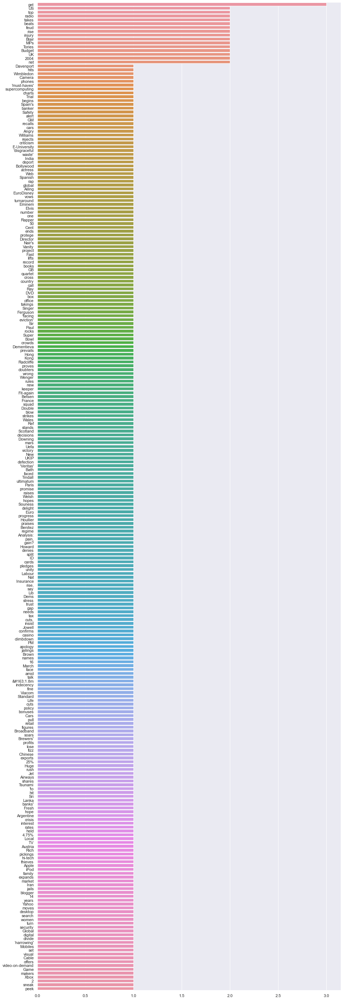

In [65]:
plot_most_commom_words(news_data['title'], (15,50))

Max count is 3 and that too for "get". Its a verb which is not that significant in most context and max count is also less. Maybe exploring content would be more beneficial. Also, title is just a small summary of the main content so we can rather just explore content and expect an exhaustive result.

/usr/local/lib/python3.9/site-packages/seaborn/rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/usr/local/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


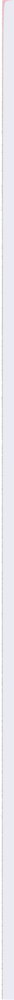

In [22]:
plot_most_commom_words(news_data['content'], (10, 900))

In [234]:
def plot_top_ngrams(text, n=2):
    new= text.str.split()
    new=new.values.tolist()
    corpus=[word for i in new for word in i]

    def _get_top_ngram(corpus, n=None):
        vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
        bag_of_words = vec.transform(corpus)
        sum_words = bag_of_words.sum(axis=0) 
        words_freq = [(word, sum_words[0, idx]) 
                      for word, idx in vec.vocabulary_.items()]
        words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
        return words_freq

    top_n_bigrams=_get_top_ngram(corpus,n)[:50]
    x,y=map(list,zip(*top_n_bigrams))
    sns.set(rc = {'figure.figsize':(15,8)})
    sns.barplot(x=y,y=x)

In [235]:
plot_top_ngrams(news_data['content'], 2)

ValueError: empty vocabulary; perhaps the documents only contain stop words

In [194]:
plot_top_ngrams_barchart(news_data['content'], 3)

ValueError: empty vocabulary; perhaps the documents only contain stop words

Clean data
- take only content column into consideration
- make everything small-case
- remove punctuation, new line characters, double quotes, single quotes
- extend stopwords to include said, would, also, could (choosing from top 20 words) as they have very less significance and might add uneccessary bias during clustering due to its high volume.

In [228]:
# Remove new line characters
news_data['content'] = [re.sub('\n', ' ', sent) for sent in news_data['content']]
# Remove distracting single quotes
news_data['content'] = [re.sub("\'", "", sent) for sent in news_data['content']]
# Remove distracting double quotes
news_data['content'] = [re.sub("\"", "", sent) for sent in news_data['content']]

stop_words.extend(['said', 'would', 'also', 'could'])


def preprocess(articles):
    for article in articles:
        yield(gensim.utils.simple_preprocess(str(article), deacc=False))  # deacc=True removes punctuations
        
cleaned_content = list(sent_to_words(news_content))

def remove_stopwords(texts):
    return [[word for word in doc if word not in stop_words] for doc in texts]

no_stopword_corpus = remove_stopwords(cleaned_content)
no_stopword_corpus = [" ".join(doc) for doc in no_stopword_corpus]
news_data['content'] = no_stopword_corpus

In [ ]:
# Example of cleaned data
news_data['content'][0]

/usr/local/lib/python3.9/site-packages/seaborn/rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
/usr/local/lib/python3.9/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


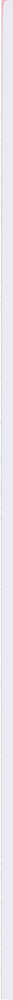

In [233]:
plot_most_commom_words(news_data['content'], (10, 900))

In [246]:
 def preprocess_text(text):
    corpus=[]
    stem=PorterStemmer()
    lem=WordNetLemmatizer()
    for news in text:
        words=[w for w in word_tokenize(news)]

        words=[lem.lemmatize(w) for w in words if len(w)>2]

        corpus.append(words)
    return corpus

def get_lda_objects(text):   
    corpus=preprocess_text(text)
    
    dic=gensim.corpora.Dictionary(corpus)
    bow_corpus = [dic.doc2bow(doc) for doc in corpus]
    
    lda_model =  gensim.models.LdaMulticore(bow_corpus, 
                                   num_topics = 60, 
                                   id2word = dic,                                    
                                   passes = 10,
                                   workers = 2,
                                   random_state=0)
    
    return lda_model, bow_corpus, dic

In [243]:
def plot_lda_vis(lda_model, bow_corpus, dic):
    pyLDAvis.enable_notebook()
    vis = pyLDAvis.gensim_models.prepare(lda_model, bow_corpus, dic, sort_topics=False)
    return vis

In [249]:
lda_model, bow_corpus, dic = get_lda_objects(news_data['content'])

In [254]:
lda_model.show_topics()

[(1,
  '0.028*"france" + 0.023*"back" + 0.021*"laporte" + 0.016*"betsen" + 0.016*"injury" + 0.016*"serge" + 0.013*"said" + 0.012*"jimmy" + 0.011*"would" + 0.010*"scotland"'),
 (27,
  '0.030*"profit" + 0.030*"life" + 0.028*"bonus" + 0.026*"market" + 0.024*"long" + 0.024*"rate" + 0.023*"cut" + 0.021*"term" + 0.021*"stock" + 0.021*"investment"'),
 (35,
  '0.022*"family" + 0.020*"said" + 0.015*"blair" + 0.013*"people" + 0.012*"conlon" + 0.012*"apology" + 0.010*"would" + 0.010*"new" + 0.010*"eurodisney" + 0.010*"euro"'),
 (10,
  '0.049*"casino" + 0.021*"said" + 0.021*"gambling" + 0.018*"bill" + 0.014*"government" + 0.014*"new" + 0.011*"move" + 0.011*"british" + 0.011*"number" + 0.007*"year"'),
 (30,
  '0.000*"record" + 0.000*"lift" + 0.000*"show" + 0.000*"world" + 0.000*"super" + 0.000*"speed" + 0.000*"year" + 0.000*"said" + 0.000*"tower" + 0.000*"bowl"'),
 (15,
  '0.023*"said" + 0.018*"labour" + 0.018*"blair" + 0.017*"brown" + 0.015*"game" + 0.014*"cent" + 0.011*"election" + 0.010*"told" +

In [255]:
plot_lda_vis(lda_model, bow_corpus, dic)

/usr/local/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is de

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0     -0.072807 -0.022639       1        1  1.412285
1     -0.091584  0.009805       2        1  1.359776
2     -0.070815  0.002101       3        1  0.007689
3      0.001806  0.139811       4        1  1.126288
4     -0.075124  0.002598       5        1  0.007689
5      0.109838 -0.067588       6        1  7.837874
6     -0.082485  0.004758       7        1  0.227946
7      0.108656 -0.119182       8        1  3.765359
8     -0.076912  0.002657       9        1  0.007689
9      0.099257 -0.065544      10        1  3.113350
10     0.040516  0.031676      11        1  1.677612
11     0.137496  0.092593      12        1  4.000093
12    -0.079406 -0.031570      13        1  0.498206
13     0.090270 -0.073499      14        1  3.406552
14    -0.084975  0.104133      15        1  1.140394
15     0.169096  0.170832      16        1  3.998502
16     0.096275 -0.006874      17        1  3.591519
17    -0.075360  0.003081      18        1  0.007689
18    -0.078937  0.012676      19        1  0.051188
19    -0.058723  0.024101      20        1  0.966389
20     0.141819 -0.088442      21        1  3.791378
21    -0.024262 -0.055104      22        1  1.623496
22    -0.076597  0.003202      23        1  0.007689
23    -0.074741  0.001651      24        1  0.007689
24    -0.075147  0.003187      25        1  0.007689
25    -0.076585  0.002530      26        1  0.007689
26     0.133025  0.142018      27        1  2.845043
27     0.021596  0.005440      28        1  1.688772
28     0.147269  0.146490      29        1  4.435321
29     0.024399  0.119859      30        1  2.598470
30    -0.075656  0.001626      31        1  0.007689
31     0.044871 -0.002060      32        1  1.347319
32    -0.075115  0.002253      33        1  0.007689
33     0.086442 -0.100516      34        1  2.746220
34    -0.075873  0.002085      35        1  0.007689
35     0.086816  0.049605      36        1  2.664332
36    -0.018009 -0.020090      37        1  1.625432
37    -0.075361  0.002898      38        1  0.007689
38    -0.080925 -0.000118      39        1  0.719019
39     0.037265 -0.017832      40        1  2.341792
40     0.038130 -0.046716      41        1  1.616669
41    -0.089986 -0.032675      42        1  0.670907
42    -0.074180  0.001351      43        1  0.007689
43    -0.072620  0.006148      44        1  0.007689
44    -0.071416  0.004393      45        1  0.007689
45    -0.076508  0.002807      46        1  0.007689
46    -0.075063  0.002271      47        1  0.007689
47     0.021370 -0.018151      48        1  1.709013
48     0.078401 -0.034196      49        1  3.102086
49    -0.077135  0.002757      50        1  0.007689
50     0.093999 -0.113326      51        1  4.864206
51    -0.076942  0.002918      52        1  0.007689
52     0.082078 -0.101842      53        1  2.949506
53     0.130880  0.181100      54        1  2.690425
54     0.162016 -0.078469      55        1  5.524541
55    -0.104105 -0.076909      56        1  1.864385
56     0.174882 -0.127545      57        1  4.380335
57    -0.045113 -0.005470      58        1  1.236960
58     0.005604  0.009335      59        1  1.606558
59    -0.025605  0.009615      60        1  1.038397, topic_info=        Term        Freq       Total Category  logprob  loglift
603     sale   23.000000   23.000000  Default  30.0000  30.0000
37      game   31.000000   31.000000  Default  29.0000  29.0000
2692     tax   26.000000   26.000000  Default  28.0000  28.0000
94     world   40.000000   40.000000  Default  27.0000  27.0000
72      said  174.000000  174.000000  Default  26.0000  26.0000
...      ...         ...         ...      ...      ...      ...
581      may    0.782126   19.157341  Topic60  -5.1459   1.3691
90      well    0.788074   25.489566  Topic60  -5.1384   1.0911
215     much    0.728661   19.039165  Topic60  -5.2167   1.3044
756   public    0.710908   15.8

In [256]:
corpus=preprocess_text(news_data['content'])
dic=gensim.corpora.Dictionary(corpus)
bow_corpus = [dic.doc2bow(doc) for doc in corpus]

In [257]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=corpus, dictionary=dic, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Coherence Score:  0.46985361093698036


In [258]:
# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip
mallet_path = 'mallet-2.0.8/bin/mallet'
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=bow_corpus, num_topics=60, id2word=dic)

Mallet LDA: 60 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 392
total tokens: 10877
<10> LL/token: -9.83714
<20> LL/token: -9.598
<30> LL/token: -9.4692
<40> LL/token: -9.37243

0	0.83333	government hit decade fell spend lost association remain attract announcement silva force ruled recover endured shamble conservative sign lehmann social 
1	0.83333	chancellor budget britain cable economy bill shadow expert gordon finance measure borrowing oliver planning handling date provide passed parliament delegate 
2	0.83333	price lift high firm news local loop exchange raised began speed airway upgrade piece mass flying date frenzy kuala december 
3	0.83333	show head put paul singer session owned tactic star television safe performed ladbrokes entertainment main wednesday egg sex night jude 
4	0.83333	day online case court iranian blogger iran arrested website statement revolutionary growing authority arrest action release foreign sentenced reporter harsh 
5	0.83333	million m

<60> LL/token: -9.31797
<70> LL/token: -9.24286
<80> LL/token: -9.21692
<90> LL/token: -9.23177

0	0.83333	year government cost general british month added remain level decade cautious secretary fell impact problem ruled expensive baez reserve focused 
1	0.83333	budget chancellor brown lib britain tory bill cable trust letwin dem finance needed measure date trusted prosper expert oliver dems 
2	0.83333	price news high fast telephone le local exchange unbundling falling low beginning faster loop catch remarkable kuala controversy convenient section 
3	0.83333	show paul singer row performed ladbrokes janet camp died star argues order jacket hey sheila reef odds harvey contestant buena 
4	0.83333	day sigarchi sentence iranian online court blogger iran journalist campaign case current website major director charge make revolutionary arrest authority 
5	0.83333	million market share recently airline idea analyst jet firm europe competition deal added domestic air airway starting hold message

<110> LL/token: -9.18691
<120> LL/token: -9.19022
<130> LL/token: -9.19189
<140> LL/token: -9.20551

0	0.83333	government end set secretary chairman cost deal business helped office decade introduced pay bad successful general remained ruled gold giuseppe 
1	0.83333	chancellor party tory brown budget britain lib bill economy trust letwin dem rule finance measure needed gordon labour decided prosper 
2	0.83333	broadband news local operator high telephone le loop unbundling exchange beginning speed faster announced limited upgrade piece mass enjoy breached 
3	0.83333	show singer jackson previous row janet star paul entertainment died chance song federal rose produce cbs sheila pre hand entering 
4	0.83333	day sigarchi blogger campaign iranian iran sentence online revolutionary authority journalist case website arrest arrested court weblogger reporter harsh border 
5	0.83333	million market price share firm company added airline began jet growth low period indian end deal domestic air airw

<160> LL/token: -9.17826
<170> LL/token: -9.20829
<180> LL/token: -9.14647
<190> LL/token: -9.13949

0	0.83333	impact open income initial past nurse venture hard chairman watcher shop shelf emphasis vice gary action monetary spicejet slide merrill 
1	0.83333	chancellor government brown budget tory bill britain lib letwin dem finance measure date trust gordon rule office needed expert oliver 
2	0.83333	broadband news number operator access local telephone deal loop exchange unbundling line faster extending online cost big announced upgrade population 
3	0.83333	show bowl day paul singer jackson black janet song cbs performed entertainment star sang keeping jacket hey florida eyed beatles 
4	0.83333	day sigarchi sentence case campaign online called blogger iranian iran arrested journalist court website revolutionary authority current statement arrest spokesman 
5	0.83333	million market price airline began jet finally indian domestic recently based air growth fall begin reach adult carrie

<210> LL/token: -9.13236
<220> LL/token: -9.16273
<230> LL/token: -9.15437
<240> LL/token: -9.16959

0	0.83333	interesting finance ability thing player criticised impressed watching received richard working freedom maker exciting enhancement growth funded iraq spell charles 
1	0.83333	government chancellor tory bill party budget lib shadow britain letwin dem conservative book measure gordon argued rule challenge announced needed 
2	0.83333	broadband news local operator telephone access loop exchange high equipment faster big raised talk finally home worldwide speed upgrade piece 
3	0.83333	show super bowl singer jackson live black janet fan performance cbs performed version entertainment controversy time sir sang pea paul 
4	0.83333	day sigarchi sentence campaign court case called blogger iranian website iran arrested authority revolutionary online arrest secure journalist release based 
5	0.83333	market price million deal airline recently jet share low meant end domestic air airway pl

<260> LL/token: -9.19196
<270> LL/token: -9.12128
<280> LL/token: -9.14591
<290> LL/token: -9.19014

0	0.83333	put point chance today earlier package return call set spring mutual union ultimately rule row overcome thing panel launched terrestrial 
1	0.83333	tory government budget bill britain lib shadow party trust conservative letwin announced needed argued attacked rule measure vote burden expert 
2	0.83333	broadband news home local operator company telephone huge loop exchange access le unbundling finally starting speed making number equipment beginning 
3	0.83333	show super bowl singer jackson performance song janet sir cbs black performed entertainment federal pea paul organiser jude james jacket 
4	0.83333	day called sigarchi case sentence online blogger iranian court iran campaign revolutionary authority release website arrest journalist friday sentenced reporter 
5	0.83333	million price share recently deal airline market began remains jet low open air airway bid sebastien impr

<310> LL/token: -9.16286
<320> LL/token: -9.14999
<330> LL/token: -9.15739
<340> LL/token: -9.13533

0	0.83333	continue today sort thing past power division basis football compromising enables additional hopkins savvy method democratisation coloured browse emergence confounding 
1	0.83333	tory budget party announced lib bill trust rule letwin expert conservative added prosper burden dems deliver measure office shamble regulation 
2	0.83333	broadband home news connection local operator making telephone loop exchange access price huge unbundling thought finally speed company rest online 
3	0.83333	show super bowl singer jackson song performance live janet sir paul cbs black ago performed entertainment pre fan audience controversy 
4	0.83333	day sigarchi sentence campaign online iranian blogger iran arrested journalist court statement revolutionary called arrest action authority secure case interview 
5	0.83333	million firm airline jet market began share high domestic recently eurodisney 

<360> LL/token: -9.12905
<370> LL/token: -9.17991
<380> LL/token: -9.11723
<390> LL/token: -9.17524

0	0.83333	big similar range talk making day hand rapper rest carried exists voice handed latest popular coming enthusiasm bringing philip contacting 
1	0.83333	budget britain lib bill cable brown rule conference set trust letwin measure date needed gordon finance announced met record attract 
2	0.83333	broadband connection local huge access telephone operator dial news company loop exchange home unbundling le speed faster finally call reach 
3	0.83333	show super bowl singer jackson live black janet back sir paul cbs performed entertainment performance federal leaving watchdog sang pea 
4	0.83333	day sigarchi sentence iranian blogger campaign iran arrested court revolutionary authority journalist case organisation statement arrest action press weblogger sentenced 
5	0.83333	price firm share recently jet announced domestic airline eurodisney output airway turning disney began package reco

<410> LL/token: -9.15441
<420> LL/token: -9.1446
<430> LL/token: -9.13144
<440> LL/token: -9.15604

0	0.83333	medium big impact earned deputy mechanism tool predict odds eat notice carried easy called wayside snalune miramax transmitted retains reidar 
1	0.83333	budget lib bill spokesman lead conference expert cable young finance measure needed announced oliver britain met record office region ruled 
2	0.83333	broadband local news access connection operator telephone dial home loop exchange speed unbundling line successful le fast combination finally anti 
3	0.83333	show super bowl jackson paul singer janet star sir cbs black performed entertainment performance profile telling sang safe organiser jude 
4	0.83333	day sigarchi sentence campaign blogger iranian court case iran arrested authority statement revolutionary website foreign arrest extra journalist release bbc 
5	0.83333	firm airline jet recently market price share domestic eurodisney indian air airway bid opened india began ban

<460> LL/token: -9.16842
<470> LL/token: -9.13118
<480> LL/token: -9.1696
<490> LL/token: -9.152

0	0.83333	medium put major highlight voice privately engine democrat complain france john installed amount quarter watcher roadshow glasgow aiding sluggish kilometre 
1	0.83333	tax budget lib bill spokesman office cable dem rule expert handling attacked finance measure needed rate insisted dems meant day 
2	0.83333	broadband news le home connection local operator telephone access dial loop exchange big unbundling today raised faster protecting mass catching 
3	0.83333	show super bowl singer jackson live star paul cbs black janet version pre song controversy performance sir million watchdog stadium 
4	0.83333	campaign day sigarchi sentence iranian court blogger iran arrested revolutionary journalist accused foreign arrest state case statement weblogger sentenced reporter 
5	0.83333	firm share airline recently began jet low domestic opened eurodisney indian company air airway friday run turn

<510> LL/token: -9.14341
<520> LL/token: -9.14503
<530> LL/token: -9.11104
<540> LL/token: -9.13869

0	0.83333	put taking medium high job started corporate watching amount microsoft exporting leaving maria powerful engineer combat frozen mandated congressionally expecting 
1	0.83333	tax budget economic economy lib britain public cable dem bill attacked accused rule claimed day taxation needed expert invest ahead 
2	0.83333	broadband home connection access operator le news big telephone local loop exchange dial price unbundling finally speed faster upgrade piece 
3	0.83333	super bowl show paul singer jackson live janet song cbs black performed entertainment successful fan audience controversy sir sang organiser 
4	0.83333	day sigarchi sentence campaign iranian case blogger court iran arrested revolutionary authority arrest journalist network release weblogger sentenced reporter harsh 
5	0.83333	firm share recently airline price jet low indian began eurodisney open domestic airway bid op

<560> LL/token: -9.1339
<570> LL/token: -9.12905
<580> LL/token: -9.13192
<590> LL/token: -9.1017

0	0.83333	time taking chance put event belief involved viewer death working region kinnock thomas sound fan wayside trialling pick marketed living 
1	0.83333	tax budget economic cable economy britain bill public money lib attacked finance challenge accused dem tory rule provide passed parliament 
2	0.83333	broadband home connection operator local telephone access news loop dial price big unbundling le speed number finally faster reach company 
3	0.83333	super bowl singer jackson show version paul black janet keeping cbs song controversy sir downloaded forced sang pea organiser jude 
4	0.83333	day sigarchi campaign sentence iranian online blogger iran case based revolutionary authority statement arrest action secure journalist human release court 
5	0.83333	share price airline recently indian open jet domestic low firm eurodisney airway opened disney million carrier banker trading bid impr

<610> LL/token: -9.12913
<620> LL/token: -9.13811
<630> LL/token: -9.09303
<640> LL/token: -9.13628

0	0.83333	time deal put strong london chairman promise wave previously death popular usage telling credit firm injury held beat vod successfully 
1	0.83333	tax budget economic money economy lib cable dem attacked rule public finance needed expert invest dems attract higher cost cut 
2	0.83333	broadband home price news connection operator le access fast local loop exchange big unbundling telephone technology falling finally firm limited 
3	0.83333	show super bowl live singer paul jackson black janet sir disappointed cbs performed entertainment controversy started slot sang jude jacket 
4	0.83333	day sigarchi sentence called campaign iranian blogger iran arrested online statement revolutionary court arrest action authority case foreign weblogger sentenced 
5	0.83333	recently airline jet indian share domestic run air airway bid opened financial business began flight carrier banker flying m

<660> LL/token: -9.11975
<670> LL/token: -9.13465
<680> LL/token: -9.11176
<690> LL/token: -9.15638

0	0.83333	time strong pay belief ago minute national equipment previously past raised division style director entrepreneur endured stem export administration computer 
1	0.83333	tax economy budget economic lib bill britain cable letwin dem rule public expert handling increase taxation oliver dems asked date 
2	0.83333	broadband home connection access news fast price local telephone operator le big loop growing exchange finally unbundling cautious falling office 
3	0.83333	super song show bowl singer jackson live black janet sir game paul cbs performed entertainment fan controversy perform sang pea 
4	0.83333	day sigarchi sentence court campaign iranian case blogger iran arrested authority statement revolutionary release arrest secure legal charge mechanism weblogger 
5	0.83333	recently airline share jet low domestic opened indian began air airway policyholder restructuring firm site vis

<710> LL/token: -9.11341
<720> LL/token: -9.13784
<730> LL/token: -9.13199
<740> LL/token: -9.11187

0	0.83333	time similar lead state price date belief past package engine hour force happening strength wave light drive concentrate pick concentrating 
1	0.83333	tax budget economic chancellor lib economy public cable needed expert dem attacked finance measure revenue taxation britain bill common attract 
2	0.83333	broadband home connection news local access operator loop finally telephone exchange speed faster reach making falling beginning line product limited 
3	0.83333	year show super bowl live jackson time performance sir cbs black performed janet singer entertainment song sang paul organiser landing 
4	0.83333	day campaign sigarchi case sentence iranian blogger iran arrested authority court revolutionary held current called make arrest action secure resolve 
5	0.83333	airline began jet recently domestic promise friday eurodisney indian airway bid ago restructuring opened price open

<760> LL/token: -9.1317
<770> LL/token: -9.10918
<780> LL/token: -9.13126
<790> LL/token: -9.16433

0	0.83333	time similar lead event decade wave marathon winning happen basis london forced disappointment concert ended picture gear bristol signal reidar 
1	0.83333	tax budget economic money economy lib cable rate dem attacked cut expert claimed commerce taxation invest insurance income dems handling 
2	0.83333	broadband home local connection news operator big telephone loop exchange access unbundling speed reach making finally price faster technology company 
3	0.83333	show super bowl singer jackson live star sir paul disappointed cbs black performed version song controversy playing fight stadium pea 
4	0.83333	day campaign sigarchi sentence iranian blogger court iran arrested authority journalist online release revolutionary arrest action secure bbc joining current 
5	0.83333	airline recently indian price jet began opened eurodisney change domestic air airway bid friday higher financia

<810> LL/token: -9.14028
<820> LL/token: -9.13501
<830> LL/token: -9.12508
<840> LL/token: -9.13776

0	0.83333	time similar vote launch viewer successful measure date forward clear working event competitive immediately wave belief concert red success columbia 
1	0.83333	tax budget economic money bill lib public cable rate economy asylum cut letwin dem attacked taxation needed expert tory oliver 
2	0.83333	broadband home news connection le operator technology local telephone loop exchange access fast big unbundling ago speed faster making falling 
3	0.83333	show super bowl singer jackson paul black live janet sir cbs performed entertainment controversy federal turned investigation organiser jude jacket 
4	0.83333	day sigarchi campaign sentence blogger iranian case iran release authority journalist court arrest action secure sentenced revolutionary reporter protect harsh 
5	0.83333	price indian share airline began jet low recently eurodisney flight domestic airway banking attack restruct

<860> LL/token: -9.14299
<870> LL/token: -9.12842
<880> LL/token: -9.12524
<890> LL/token: -9.14748

0	0.83333	time similar event future vote date called manager measure bigger toughest requirement power month playing raft attractive effectively spying motjaba 
1	0.83333	tax budget lib cable bill government expert economy economic letwin attacked finance european dem argued support taxation needed invest oliver 
2	0.83333	broadband local home connection access news taking telephone operator le fast dial loop exchange unbundling growing finally headline speed faster 
3	0.83333	show super bowl singer jackson black janet star trial sir performed million sang provided pea organiser jude jacket hey florida 
4	0.83333	day sigarchi campaign court case iranian blogger sentence iran journalist authority current revolutionary arrest action secure foreign financing weblogger sentenced 
5	0.83333	share recently price airline jet low began million firm eurodisney domestic airway daily worth turning

<910> LL/token: -9.08949
<920> LL/token: -9.14019
<930> LL/token: -9.12609
<940> LL/token: -9.12948

0	0.83333	time similar announced problem continue vote date price measure called beat power massive organised uncertain eef sun joining prototype completed 
1	0.83333	tax budget economic lib bill cable economy brown dem cut finance council taxation expert oliver attract support asked urged unfair 
2	0.83333	broadband news local operator home access connection telephone dial loop exchange finally unbundling le speed fast product faster making number 
3	0.83333	show super bowl live song back singer jackson black janet version time sir communication cbs performed star controversy federal investigation 
4	0.83333	day sigarchi case sentence iranian blogger campaign iran court revolutionary authority release lawyer called arrest journalist press foreign sentenced reporter 
5	0.83333	share price million airline jet low began domestic recently opened indian air airway restructuring india financ

<960> LL/token: -9.13179
<970> LL/token: -9.11661
<980> LL/token: -9.15873
<990> LL/token: -9.1169

0	0.83333	time similar big ago announced belief measure problem today power spirit short hour boy back real launched rewind expansion personal 
1	0.83333	tax budget economic money lib cable rate economy finance dem attacked attract peg taxation invest dems bad deal urged inspection 
2	0.83333	broadband home connection million access news high operator local loop exchange telephone expert talk dial making unbundling raised finally faster 
3	0.83333	show super bowl live paul singer jackson black janet cbs performed version controversy sir included voluntary sex stadium sang pea 
4	0.83333	day sigarchi sentence campaign court case blogger iranian iran arrested online revolutionary authority journalist arrest secure press deputy gave weblogger 
5	0.83333	share price airline open jet recently indian domestic air airway bid call financial began low remember progress india market higher 
6	0.83

In [259]:
# Show Topics
pprint(ldamallet.show_topics(formatted=False))

[(19,
  [('year', 0.15217391304347827),
   ('serena', 0.050724637681159424),
   ('khan', 0.043478260869565216),
   ('past', 0.043478260869565216),
   ('born', 0.036231884057971016),
   ('challenge', 0.036231884057971016),
   ('bombay', 0.028985507246376812),
   ('bollywood', 0.028985507246376812),
   ('role', 0.028985507246376812),
   ('visa', 0.028985507246376812)]),
 (51,
  [('woman', 0.1267605633802817),
   ('money', 0.11267605633802817),
   ('added', 0.08450704225352113),
   ('men', 0.07746478873239436),
   ('prize', 0.035211267605633804),
   ('tennis', 0.028169014084507043),
   ('wimbledon', 0.028169014084507043),
   ('phillips', 0.02112676056338028),
   ('equal', 0.02112676056338028),
   ('insulting', 0.014084507042253521)]),
 (0,
  [('time', 0.15384615384615385),
   ('similar', 0.05917159763313609),
   ('big', 0.05325443786982249),
   ('back', 0.04142011834319527),
   ('announced', 0.04142011834319527),
   ('ago', 0.03550295857988166),
   ('problem', 0.029585798816568046),
   ('

In [260]:
# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=corpus, dictionary=dic, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('Coherence Score: ', coherence_ldamallet)

Coherence Score:  0.5774959764538963


In [261]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=bow_corpus, num_topics=num_topics, id2word=dic)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [262]:
model_list, coherence_values = compute_coherence_values(dictionary=dic, corpus=bow_corpus, texts=corpus, start=2, limit=60, step=2)

Mallet LDA: 2 topics, 1 topic bits, 1 topic mask
Data loaded.
max tokens: 392
total tokens: 10877
<10> LL/token: -9.26381
<20> LL/token: -9.18369
<30> LL/token: -9.16627
<40> LL/token: -9.142

0	25	people blair labour radio tax minister told government service end day top election net brown broadband prime news million high 
1	25	year world game show made sale number bank make music people rate market plan time added film player camera profit 

<50> LL/token: -9.133
<60> LL/token: -9.10852
<70> LL/token: -9.08859
<80> LL/token: -9.0953
<90> LL/token: -9.08333

0	25	people blair labour radio tax minister government service end day top election net time brown broadband prime home news million 
1	25	year world game show made sale number bank make music rate market plan player added phone film camera profit mobile 

<100> LL/token: -9.0842
<110> LL/token: -9.08327
<120> LL/token: -9.07286
<130> LL/token: -9.07236
<140> LL/token: -9.0627

0	25	people blair labour radio tax minister told gov

<60> LL/token: -9.14055
<70> LL/token: -9.1306
<80> LL/token: -9.12844
<90> LL/token: -9.11823

0	12.5	end day net player home high film plan bbc work million people make spokesman family campaign real called digital bill 
1	12.5	people blair tax minister phone country camera money report profit month mobile good told year tory program cut virus howard 
2	12.5	game labour show made government bank election brown prime party half win week public back set chancellor woman term medium 
3	12.5	year time world radio sale service number music top market rate broadband news firm user record demand offer station hop 

<100> LL/token: -9.09172
<110> LL/token: -9.08202
<120> LL/token: -9.06576
<130> LL/token: -9.06574
<140> LL/token: -9.05444

0	12.5	people end make day net player home news million film told high work life bbc spokesman family campaign real called 
1	12.5	blair year tax minister people plan phone country camera money report profit mobile good tory government month program howard

<710> LL/token: -8.94198
<720> LL/token: -8.96174
<730> LL/token: -8.95839
<740> LL/token: -8.94302

0	12.5	people show number end net day home film medium woman program family make virus campaign real called million security online 
1	12.5	year tax sale bank rate market plan phone country camera money report profit mobile life cut economy term people made 
2	12.5	labour blair minister told election game brown prime party half good win week public government back chancellor tory howard spokesman 
3	12.5	world year radio service music top broadband news time high firm technology work record demand programme offer player local digital 

<750> LL/token: -8.95204
<760> LL/token: -8.94779
<770> LL/token: -8.93868
<780> LL/token: -8.94202
<790> LL/token: -8.93349

0	12.5	people show number end day make net home film medium woman program family virus campaign game security online watch criminal 
1	12.5	year people tax sale bank rate market plan phone country camera money report profit mobile 

<260> LL/token: -8.95115
<270> LL/token: -8.93962
<280> LL/token: -8.93606
<290> LL/token: -8.95357

0	8.33333	game day rate added good win life family term end casino wale british place williams england decision member made london 
1	8.33333	people radio music world net broadband home news user make woman program technology virus real station hop hip security research 
2	8.33333	blair labour tax minister told government election brown plan prime money party public chancellor tory howard spokesman campaign bill country 
3	8.33333	people sale market phone million camera report mobile profit work made cut firm player euro cent search european share europe 
4	8.33333	year time bank top high world service month record set demand programme offer video speed rise price store cable similar 
5	8.33333	year show number film half back play song director part france injury expected nair chance viacom super run actor lot 

<300> LL/token: -8.94366
<310> LL/token: -8.93751
<320> LL/token: -8.94852


<710> LL/token: -8.89805
<720> LL/token: -8.87929
<730> LL/token: -8.89827
<740> LL/token: -8.89958

0	8.33333	game end half good win player week made back added play make wale place williams england decision match race side 
1	8.33333	people radio service world net broadband news user program virus programme home day called local firm station hop hip security 
2	8.33333	blair labour tax minister told government election brown prime plan money party public chancellor tory howard family term campaign bill 
3	8.33333	people market phone million country camera report profit month mobile life music real digital cut euro long company made xbox 
4	8.33333	year sale bank rate time top world record demand offer high video speed economy part rise price store cable similar 
5	8.33333	year show number film song day nair chance taking office viacom super run actor fan live young sharp remains india 

<750> LL/token: -8.90287
<760> LL/token: -8.91387
<770> LL/token: -8.91603
<780> LL/token: -8.8977

<120> LL/token: -9.01019
<130> LL/token: -9.00902
<140> LL/token: -8.99009

0	6.25	sale bank phone film people camera report mobile month digital project store director channel consumer world analyst continue car office 
1	6.25	blair radio music told prime people chancellor bbc family campaign station hop hip medium casino member spanish leader called world 
2	6.25	service day end broadband firm home technology user demand programme offer news local video access price card cable similar web 
3	6.25	time number added williams rise match race song search cent interest start latest viacom expected goal run past lot risk 
4	6.25	labour minister show election brown party government public term bill spokesman issue book budget week men michael mp british chairman 
5	6.25	year tax rate market plan made country profit money tory howard cut life economy euro long decision investment economic fall 
6	6.25	year people top net world million high record program virus speed security research woman s

<460> LL/token: -8.89701
<470> LL/token: -8.88254
<480> LL/token: -8.90495
<490> LL/token: -8.88482

0	6.25	music phone film camera report month mobile people million digital work online player nair handset actor technology office image feature 
1	6.25	radio day make medium family campaign called station hop hip world casino spanish visual group website television track millan thing 
2	6.25	people service broadband home news time firm demand programme real local video access project offer technology end user price similar 
3	6.25	year show number added british race cent time decision part put consumer expected latest viacom super run song chief wednesday 
4	6.25	blair labour tax minister told election brown prime government party chancellor tory public plan howard spokesman bill card member london 
5	6.25	sale bank rate year market profit country money term cut economy made rise state euro long life investment interest economic 
6	6.25	world top net year woman program record high virus

<810> LL/token: -8.8842
<820> LL/token: -8.88952
<830> LL/token: -8.90733
<840> LL/token: -8.89553

0	6.25	phone film camera mobile music work digital people month xbox analyst nair player office million actor image handset feature young 
1	6.25	radio day world family people station hop hip medium casino spanish song online visual called website make group television track 
2	6.25	service people broadband firm news technology demand programme offer local video access user price watch channel company search telewest home 
3	6.25	show number year put part british store race cent consumer car viacom super run wednesday lot retail risk future live 
4	6.25	blair labour tax minister election brown prime government party told chancellor tory public howard spokesman bill plan issue london book 
5	6.25	sale bank rate market country year profit money cut report made economy term rise euro life investment interest economic long 
6	6.25	year time top world net high end record program virus people 

<160> LL/token: -8.98737
<170> LL/token: -8.97783
<180> LL/token: -8.96663
<190> LL/token: -8.97248

0	5	game half win week back player play wale place williams england side france nation injury make made club mike told 
1	5	tax country howard spokesman public economy bill casino decision match state made economic european men china start international dollar britain 
2	5	people bank phone camera report mobile music month digital make euro world xbox europe player game growth fund lot image 
3	5	sale number news real local put project watch store rise cent consumer expected latest programme song scheme chief retail area 
4	5	year show service time added demand offer station video similar telewest offering chance set viacom cable super content sky live 
5	5	world top day record medium bbc hop hip speed spanish group website lift called track online system sigarchi rap millan 
6	5	blair labour minister election brown prime film party told people tory chancellor government family card mem

<460> LL/token: -8.90479
<470> LL/token: -8.91557
<480> LL/token: -8.91571
<490> LL/token: -8.89806

0	5	half win made game wale player place williams play england match side france back nation injury goal great mike official 
1	5	government plan country public bill casino card state economic private people china decision argentina money chairman dollar scheme lost easy 
2	5	people music phone camera game report month mobile make digital million technology xbox player real work analyst end model handset 
3	5	sale news number local project put british watch store part cent consumer expected latest car rise chief retail future programme 
4	5	year show service time offer video demand song channel telewest day offering added viacom le big content sky super programme 
5	5	world top record high hop hip day speed spanish lift called based track millan website control make sigarchi rap language 
6	5	blair labour tax minister told election brown prime party chancellor tory howard family people 

<760> LL/token: -8.89848
<770> LL/token: -8.90283
<780> LL/token: -8.89945
<790> LL/token: -8.87964

0	5	game half win wale place williams player made england match side france injury back play nation goal great mike official 
1	5	plan people money government bill casino country card state private argentina university international chairman scheme problem united earlier shadow secretary 
2	5	music phone million technology people camera report mobile month service work digital make access player xbox analyst handset real model 
3	5	number sale news week local put project british store cent consumer part start make expected latest chief lot retail risk 
4	5	show year time programme video set demand offer song cable similar service telewest day offering chance channel viacom le big 
5	5	world top hop hip speed record spanish day website high lift medium group track millan called sigarchi rap language sentence 
6	5	blair labour tax minister told election brown prime party chancellor tory h

<60> LL/token: -9.12465
<70> LL/token: -9.09499
<80> LL/token: -9.05181
<90> LL/token: -9.02882

0	4.16667	bank rate film market made life cut family economy added cable director interest consumer telewest private long nair price office 
1	4.16667	year game show number broadband make local end home back announced thing run mike big week live young international le 
2	4.16667	radio time phone people camera technology mobile digital station month visual website make television similar handset viacom image feature end 
3	4.16667	user firm hop hip medium real spanish cent web group company search share track millan music news mail rap language 
4	4.16667	tax minister brown money party people tory chancellor plan country question michael economic britain lost lib spokesman common claim lot 
5	4.16667	win half wale williams member england london match side play injury university added goal race important club saturday coach forward 
6	4.16667	service top net million high record music video s

<310> LL/token: -8.89194
<320> LL/token: -8.92257
<330> LL/token: -8.93543
<340> LL/token: -8.93174

0	4.16667	bank market film rate life long director interest nair office actor bonus young sharp stock india share made policy including 
1	4.16667	year game show number broadband end song time make million thing super mike easy club operator performance big bowl live 
2	4.16667	radio phone camera mobile people time month digital station technology project visual work website local make television channel university lead 
3	4.16667	firm hop hip world spanish cent web group search part latest millan chance mail track rap fan music spain hard 
4	4.16667	labour tax government brown party chancellor money tory howard plan blair minister term mp britain michael country scheme lost lib 
5	4.16667	half win play williams wale match race side france england player injury start official saturday coach forward mind ukip paula 
6	4.16667	top service music high video offer speed record player million

<560> LL/token: -8.91089
<570> LL/token: -8.89477
<580> LL/token: -8.92887
<590> LL/token: -8.89704

0	4.16667	film life number director year nair office run actor share young sharp stock remains india policy standard including recently indian 
1	4.16667	year time show day end announced million club viacom super live put performance bowl ago pre singer jackson paid playing 
2	4.16667	radio make people phone camera mobile month digital station technology project work visual similar music channel report lead television thing 
3	4.16667	world top medium hop hip number spanish song web group search cent track millan chance rap language hard desktop fan 
4	4.16667	labour tax government brown plan chancellor tory howard bill question budget public economic due university mp minister britain michael book 
5	4.16667	game half win wale williams england play match side france player made injury race back great mike lot saturday coach 
6	4.16667	service game programme music offer demand video spe

<810> LL/token: -8.87572
<820> LL/token: -8.89464
<830> LL/token: -8.88572
<840> LL/token: -8.90227

0	4.16667	film nair office actor india including director recently indian fair airline ray dvd young sharp oscar favourite box becky question 
1	4.16667	year show time put announced viacom super million remains bowl live pre day paul ago singer row jackson deputy open 
2	4.16667	people radio phone camera report mobile month make music digital station project visual channel website technology watch television service handset 
3	4.16667	number world top hop hip spanish song cent web group based search millan track rap fan spain hard big desktop 
4	4.16667	labour government tax brown plan minister chancellor tory howard money party book budget economic michael university public war due scheme 
5	4.16667	game win half wale player williams play made england match race side france back injury make start goal great lot 
6	4.16667	service programme record offer video speed million price similar

<60> LL/token: -9.09454
<70> LL/token: -9.07864
<80> LL/token: -9.051
<90> LL/token: -9.02728

0	3.57143	bank world profit made country year life hop hip cut part state spanish euro cent european europe rate long argentina 
1	3.57143	show phone camera time end mobile people million viacom super problem month image feature ukip bowl year sold singer jackson 
2	3.57143	home broadband tory rate plan real access card decision announced start scheme easy operator meant give denied shadow hold support 
3	3.57143	year market offer time economy store director interest economic private investment growth university cost debt similar president high firm sector 
4	3.57143	world half top speed play wale place record system xbox lift side pressure match national building set tower minute final 
5	3.57143	blair labour tax minister brown prime told public howard bill member issue question budget tony mp money chairman war spokesman 
6	3.57143	net people woman program virus security williams criminal m

<260> LL/token: -8.94074
<270> LL/token: -8.91704
<280> LL/token: -8.91592
<290> LL/token: -8.94239

0	3.57143	world profit hop hip cut year spanish country euro company long european term millan argentina rap language spain bonus share 
1	3.57143	show camera report phone year million viacom super image high feature live increase agreed bowl time paul singer jackson sold 
2	3.57143	government bill card xbox announced decision official scheme easy british hard give denied shadow secretary success immigration title support set 
3	3.57143	bank life market rate time economy state interest people private investment government cost growth economic university continue money dollar debt 
4	3.57143	top half win world record speed wale williams play player lift side place match pressure international system time building performance 
5	3.57143	blair labour tax minister brown prime election chancellor tory howard family public plan budget head tony michael question mp britain 
6	3.57143	net peopl

<460> LL/token: -8.87612
<470> LL/token: -8.89206
<480> LL/token: -8.90163
<490> LL/token: -8.91097

0	3.57143	world year profit life cut hop hip spanish euro cent european share europe china millan term made rap language bonus 
1	3.57143	year show camera phone time viacom super image feature bowl ago song live singer jackson end fcc fine owned previously 
2	3.57143	plan game bill casino card decision xbox announced international official scheme give easy real hard denied shadow secretary immigration john 
3	3.57143	bank report market country money state economy investment set economic long private cost people argentina university dollar debt sector government 
4	3.57143	top world half record speed williams match lift player control system great pressure national high building tower played performance final 
5	3.57143	blair labour tax minister brown election prime government public chancellor tory family howard party question budget tony mp michael lib 
6	3.57143	people net user woman 

<660> LL/token: -8.87989
<670> LL/token: -8.89996
<680> LL/token: -8.85627
<690> LL/token: -8.86263

0	3.57143	world profit life hop hip spanish term euro cut long cent european share europe millan rap language spain bonus heineken 
1	3.57143	show year time song viacom super live home trial bowl ago singer jackson remains put paid performance problem fcc fine 
2	3.57143	number game bill casino card decision real xbox plan international official easy hard give announced denied microsoft shadow secretary title 
3	3.57143	bank country money people made government report state investment set economic private university cost dollar debt argentina sector fund united 
4	3.57143	top world record year speed williams place national lift woman system pressure time great control building tower final serena cup 
5	3.57143	blair labour tax minister election brown prime public chancellor tory howard question government issue budget tony michael mp people britain 
6	3.57143	net user program people vir

<860> LL/token: -8.86121
<870> LL/token: -8.88289
<880> LL/token: -8.85939
<890> LL/token: -8.88073

0	3.57143	world profit hop hip life spanish euro long europe cent millan european lead strong rap term spain bonus group heineken 
1	3.57143	year show time song viacom super live performance trial bowl ago taking paul singer pre favourite row jackson fcc fine 
2	3.57143	game plan bill casino card decision real xbox international people scheme medium hard set number give high shadow official title 
3	3.57143	bank country money people state report economic spokesman private cost university government set made dollar debt argentina sector president united 
4	3.57143	top world record speed lift control system great time national woman tower minute pressure final serena grand test blue open 
5	3.57143	blair labour tax minister election brown prime government chancellor tory howard public issue budget tony party michael put leader mp 
6	3.57143	net user home program virus high security firm r

<60> LL/token: -9.10111
<70> LL/token: -9.04683
<80> LL/token: -9.05066
<90> LL/token: -9.03449

0	3.125	radio service programme station hop hip video demand project spanish visual similar channel world offering china track music lead rap 
1	3.125	win back play group world search web france injury millan language fan important desktop saturday bbc plan called speaking user 
2	3.125	good private work university club mike team houllier man playing added liverpool cup showed failure gave face amount quarter premiership 
3	3.125	woman money spokesman casino bill british card issue real added medium risk increase decision concern serena move gambling head street 
4	3.125	blair labour minister government election brown prime tax party told public campaign leader plan member book put tony michael question 
5	3.125	phone people camera mobile music technology digital player criminal xbox month analyst latest handset mail image feature network give research 
6	3.125	family high million cable cen

<260> LL/token: -8.89518
<270> LL/token: -8.94195
<280> LL/token: -8.92238
<290> LL/token: -8.90698

0	3.125	radio service programme music hop hip video world station spanish visual channel demand offering track millan song watch rap language 
1	3.125	win back player play wale williams made match france side half injury saturday coach forward official mind start played final 
2	3.125	game good week england told university goal mike club added team houllier man place playing liverpool wenger return showed face 
3	3.125	number end woman medium real put added casino men money latest hard television british concern move gambling street impact session 
4	3.125	blair labour tax minister election brown prime party chancellor told public member book leader campaign tony mp government term war 
5	3.125	phone people technology mobile camera work digital music month search player service image analyst internet quality photo information increase microsoft 
6	3.125	year show family super biggest ch

<460> LL/token: -8.88938
<470> LL/token: -8.88545
<480> LL/token: -8.88694
<490> LL/token: -8.86834

0	3.125	radio programme station hop hip video project spanish watch visual similar channel world television millan chance rap music thing spain 
1	3.125	half player back win wale williams england match side france play injury made official saturday coach forward great played final 
2	3.125	game good week place club goal job team mike houllier difficult liverpool wenger mark sport face ready premiership bath bit 
3	3.125	number added woman casino british real bill international men end problem john medium concern gambling secretary street deputy full level 
4	3.125	blair labour minister told election brown prime party chancellor spokesman leader issue budget head tony member term war stand book 
5	3.125	phone camera people mobile music digital technology analyst month handset million image give player report photo information increase high work 
6	3.125	year show time taking end super bi

<660> LL/token: -8.86982
<670> LL/token: -8.88083
<680> LL/token: -8.87438
<690> LL/token: -8.86588

0	3.125	radio world programme station hop hip spanish watch visual cent music channel medium group television track millan song month rap 
1	3.125	half back wale williams match side player france injury play official saturday coach forward nation played final time serena made 
2	3.125	game win end good place england week club goal start mike team houllier man difficult playing event liverpool job wenger 
3	3.125	number real added casino decision woman men international british secretary meant concern people move gambling problem mind session street reached 
4	3.125	labour blair minister election brown prime told party chancellor member put spokesman leader tony question bbc term due stand mp 
5	3.125	phone camera mobile people music digital player technology service month analyst handset market image latest photo information company idea version 
6	3.125	show year time taking viacom sup

<860> LL/token: -8.85185
<870> LL/token: -8.86743
<880> LL/token: -8.85246
<890> LL/token: -8.85544

0	3.125	radio station hop hip spanish visual channel world television millan project group watch cent track rap language chance spain area 
1	3.125	half win back player wale williams play match side france injury nation saturday coach forward official final serena welsh cup 
2	3.125	game good week place england made told club goal race mike team year event houllier man liverpool job wenger return 
3	3.125	added number casino british woman decision real men issue chairman international denied risk start support end gambling street full concern 
4	3.125	blair labour minister election brown prime party told spokesman member leader book campaign question chancellor tony mp war head due 
5	3.125	phone music people camera mobile month digital technology market model report handset player million image end quality increase idea version 
6	3.125	year show put set viacom super taking live bowl s

<60> LL/token: -9.04296
<70> LL/token: -9.04691
<80> LL/token: -9.0207
<90> LL/token: -8.95573

0	2.77778	game good week back made end place expected goal official added mind houllier difficult deal coming liverpool wenger victory taylor 
1	2.77778	net user program security research web criminal based computer viacom written machine spyware software network pc attack show threat growing 
2	2.77778	set year williams woman decision men start office club great give denied hold title play khan time event added scotland 
3	2.77778	china wednesday trial ukip cent santander botin announced street favourite row remains spend support conference blue trade silk hockney pre 
4	2.77778	half wale player match side england mike nation played final serena playing welsh cup rugby paris grand centre jones coach 
5	2.77778	year show home million card model super easy performance bowl expert ago jackson police cost making bath finally singer vehicle 
6	2.77778	radio station hop hip medium spanish song wo

<230> LL/token: -8.9261
<240> LL/token: -8.91529

0	2.77778	game end week good added made job decision official place club coach goal team houllier liverpool wenger win face premiership 
1	2.77778	net program virus security people criminal written machine viacom user research computer change spyware network malicious pc end threat software 
2	2.77778	year woman race men important easy play money winning british mind event paula hold give title set serena risk khan 
3	2.77778	cent chairman wednesday problem ukip london leader santander botin biggest monday row member view trial silk kilroy hockney executive reported 
4	2.77778	half wale win player williams match side injury england great mike nation saturday played final welsh cup rugby paris grand 
5	2.77778	year show million time super performance bowl ago pre model singer jackson recall back previous vehicle paul bond black live 
6	2.77778	radio medium station hop hip spanish song visual latest track millan music rap language fan thi

<390> LL/token: -8.88007

0	2.77778	game added good end week club goal team houllier place playing liverpool mark sport premiership return taylor shot ready leaving 
1	2.77778	net home program virus security research year high people criminal written user million spyware computer malicious pc attack woman threat 
2	2.77778	make race woman men start money play future winning easy year event paula title british serena part hold challenge set 
3	2.77778	london cent spokesman member wednesday biggest earlier made ukip remains leader trial santander british botin monday concern street row deputy 
4	2.77778	half win wale williams back match side france player injury saturday coach forward decision mike england minute played final welsh 
5	2.77778	show year viacom super time live bowl ago paul singer jackson recall fcc fine paid vehicle performance back domestic owned 
6	2.77778	radio world hop hip station spanish medium visual make song television track millan thing latest rap language fan s

<560> LL/token: -8.85104
<570> LL/token: -8.8715
<580> LL/token: -8.8605
<590> LL/token: -8.85529

0	2.77778	game good week added play end club job goal mike told place team houllier playing liverpool wenger sport premiership bath 
1	2.77778	net home program virus million user security criminal written computer research spyware machine end malicious software threat pc growing dial 
2	2.77778	year people make woman set part race men start easy lot mind event paula difficult title support serena winning november 
3	2.77778	member london cent british wednesday news trial made ukip santander botin biggest row remains view payment silk robert kilroy hockney 
4	2.77778	win half williams wale player match side france injury back england great saturday coach forward official nation played final welsh 
5	2.77778	show year time viacom super performance back announced bowl live car paul ago singer jackson fcc fine success vehicle recall 
6	2.77778	radio medium station hop hip world spanish visual

<730> LL/token: -8.88334
<740> LL/token: -8.88837

0	2.77778	game good week added club goal mike end houllier coach playing liverpool wenger team mark thing place international ready premiership 
1	2.77778	net people program virus security criminal home written computer taking spyware software network user show end malicious attack machine threat 
2	2.77778	year make people made part race month set time woman start play run easy lot future mind men event difficult 
3	2.77778	told british member london cent news party due term stand wednesday trial ukip santander botin biggest monday spokesman line view 
4	2.77778	win half back wale williams match side france player injury england saturday decision played final welsh cup rugby great told 
5	2.77778	year show time viacom super live performance end bowl ago pre paul singer paid recall fcc fine jackson remains vehicle 
6	2.77778	radio station hop hip world spanish song visual lead television track millan medium rap language fan music artis

<910> LL/token: -8.86354
<920> LL/token: -8.87581
<930> LL/token: -8.86824
<940> LL/token: -8.87823

0	2.77778	game good added place end week club goal mike team houllier start playing liverpool cup wenger sport premiership bath early 
1	2.77778	net home user people program million virus security criminal written machine computer technology spyware software malicious network attack key firm 
2	2.77778	make year woman race men run lot winning past easy number mind paula difficult lost title serena london part open 
3	2.77778	party news told bbc cent due chairman spokesman stand wednesday member leader trial monday week ukip coming santander botin london 
4	2.77778	half win back wale williams england match side france player injury great official saturday coach forward played international final play 
5	2.77778	show year viacom super performance bowl live remains time ago singer favourite jackson paid recall fcc fine pre vehicle owned 
6	2.77778	radio medium station hop hip spanish visua

<60> LL/token: -9.1137
<70> LL/token: -9.06874
<80> LL/token: -9.03977
<90> LL/token: -9.02587

0	2.5	game show cent back viacom houllier bowl performance allard singer jackson premiership sport leaving chelsea black janet row pair star 
1	2.5	good williams decision life england match side france goal made saturday coach official job standard man played policy wenger team 
2	2.5	labour brown prime told chancellor government spokesman casino bbc book issue due britain stand british cabinet iraq claim monday shadow 
3	2.5	people phone music camera mobile work day digital month online player technology website analyst sigarchi image sentence photo handset microsoft 
4	2.5	net woman virus watch firm written men spyware software network point study money technical telekom austria setting expert simple paul 
5	2.5	tax bank tory economy interest budget economic government warned dollar debt future president earlier consumer november creditor trust crime account 
6	2.5	year made make place rac

<210> LL/token: -8.93365
<220> LL/token: -8.93943
<230> LL/token: -8.93837
<240> LL/token: -8.92905

0	2.5	show game year viacom cent super time houllier bowl ago performance earlier liverpool singer row jackson fcc fine set end 
1	2.5	good back place france job saturday coach goal team official wenger forward return injury face ready jones victory scotland confident 
2	2.5	told brown government chancellor bbc campaign casino british spokesman book britain put cabinet iraq due issue chairman stand concern move 
3	2.5	phone music camera mobile digital people report website technology player million image sigarchi photo information iranian sold blogger ipod creative 
4	2.5	net people woman virus project watch head news men show network local software pc attack area study event telekom austria 
5	2.5	bank state economic private argentina interest dollar budget debt sector report president united government current creditor economy hit finance investment 
6	2.5	people made year part time m

<360> LL/token: -8.90885
<370> LL/token: -8.91312
<380> LL/token: -8.91597
<390> LL/token: -8.91644

0	2.5	show year time viacom super end bowl ago live singer jackson remains performance million fcc paul fine pre back reached 
1	2.5	good back france injury place job goal coach team liverpool houllier wenger ready premiership recovered laporte bit return face uefa 
2	2.5	brown told government chancellor spokesman bill bbc casino british issue book campaign chairman warned iraq secretary john november concern move 
3	2.5	music phone camera report mobile digital player technology website sigarchi project month million image people quality information increase analyst online 
4	2.5	people woman added watch men area event programme line make telekom austria setting major thought longer project statement prize industry 
5	2.5	bank state private argentina sector dollar president united government debt set creditor account director finance paid disaster crisis pay agreed 
6	2.5	year made peop

<510> LL/token: -8.9089
<520> LL/token: -8.9225
<530> LL/token: -8.9167
<540> LL/token: -8.90188

0	2.5	show year viacom super end million bowl live singer row jackson remains added fcc paul fine song paid black janet 
1	2.5	back good place france goal job coach team houllier liverpool wenger return man ready premiership laporte confident march pressure pace 
2	2.5	brown chancellor campaign government bill casino spokesman british bbc book term chairman britain due iraq risk john november move gambling 
3	2.5	music phone camera service mobile report people digital player technology analyst handset image quality photo information increase artist end idea 
4	2.5	woman people channel watch money men news area local event programme kind sport taking telekom austria setting download reported prize 
5	2.5	bank made state private government argentina debt sector president united set agreed creditor dollar account disaster decade crisis recovery saving 
6	2.5	year people part race cent start r

<660> LL/token: -8.90157
<670> LL/token: -8.89539
<680> LL/token: -8.89735
<690> LL/token: -8.90276

0	2.5	show year viacom super live bowl back paul ago singer row jackson remains showed paid fcc fine owned widely keeping 
1	2.5	added good place france win back goal team houllier liverpool job wenger mark face premiership laporte forward bit leaving uefa 
2	2.5	brown government chancellor bill casino bbc british book budget head term spokesman iraq secretary concern gambling conservative november move personal 
3	2.5	phone music camera mobile people digital report technology player handset service image quality photo information idea version sold month ipod 
4	2.5	people woman project watch men local work area programme meant event line due kind telekom austria march download started based 
5	2.5	bank made people state interest private government argentina director debt sector dollar president recently united santander botin creditor pay hit 
6	2.5	year time part month race set start 

<810> LL/token: -8.89181
<820> LL/token: -8.86919
<830> LL/token: -8.8808
<840> LL/token: -8.89043

0	2.5	year show viacom super bowl ago paul live singer jackson paid performance trial fcc fine pre back black janet star 
1	2.5	good back france job goal coach win houllier team injury liverpool wenger row face added ready premiership bit place end 
2	2.5	brown chancellor government spokesman bill casino british issue book term budget britain war iraq public chairman secretary concern gambling trust 
3	2.5	phone music camera mobile people technology report digital player month image handset analyst quality photo million information idea version sold 
4	2.5	people woman men project area watch event money telekom austria setting longer scheme charge prize tactic successful created put kind 
5	2.5	bank set made state private argentina sector president debt united director santander botin creditor disaster payment crisis recovery pay saving 
6	2.5	year time part race start strong lost intern

<960> LL/token: -8.88463
<970> LL/token: -8.88897
<980> LL/token: -8.89521
<990> LL/token: -8.86682

0	2.5	show year viacom super live trial bowl paul ago favourite jackson performance fcc fine bit singer row remains agreed previously 
1	2.5	good added back france win goal job coach forward team houllier man place liverpool wenger return mark face centre ready 
2	2.5	brown government chancellor bill public casino british issue budget medium chairman britain war iraq cable secretary campaign spokesman immigration announced 
3	2.5	people phone music mobile camera technology digital player analyst handset report image photo information increase version sold million ipod idea 
4	2.5	people woman watch men television taking money meant sport change austria simple head march kind download making local prize join 
5	2.5	bank made state set china argentina private dollar debt sector president botin company creditor pay trade united investment disaster santander 
6	2.5	year time month people pa

<110> LL/token: -9.02062
<120> LL/token: -9.02779
<130> LL/token: -8.99183
<140> LL/token: -8.98577

0	2.27273	labour minister blair people howard public put question cent tony week due important real claim monday party tuesday good full 
1	2.27273	number medium director viacom end office film agreed release coming dvd oscar box success fcc fine ray deputy taking owned 
2	2.27273	firm demand offer similar telewest offering week desktop sky internet ntl mike product added pvr file telephone deal business range 
3	2.27273	time make called national announced thing hard big forward easy set group making row news mind extra starting back test 
4	2.27273	net program virus home criminal search security machine mail written computer spyware software web technology malicious pc key based end 
5	2.27273	added casino private university international sector scheme secretary concern gambling bill wenger john british quarter move street level waste showed 
6	2.27273	told day bbc family campaign part

<260> LL/token: -8.9542
<270> LL/token: -8.94634
<280> LL/token: -8.95516
<290> LL/token: -8.93806

0	2.27273	public tory people howard put question cent wednesday campaign real shadow earlier monday school asylum conservative rule meant impact taking 
1	2.27273	number film viacom release actor coming office ray dvd oscar box broadcast song fcc secretary fine running owned agreed died 
2	2.27273	demand offer video firm year service week telewest offering chance club programme mike deal sky ntl huge pvr began range 
3	2.27273	time set announced national easy hard give event point test amount million extra period confidence venus face date involved chart 
4	2.27273	program virus user net research security web search firm criminal machine mail written computer desktop spyware software network malicious pc 
5	2.27273	casino bill medium private government university chairman added scheme sector international john move gambling showed disaster concern street waste decade 
6	2.27273	day spoke

<410> LL/token: -8.92157
<420> LL/token: -8.92152
<430> LL/token: -8.91472
<440> LL/token: -8.92205

0	2.27273	plan howard public put question cent michael campaign issue immigration conservative rule wednesday began accused conference school session major wanted 
1	2.27273	number week latest viacom release agreed recently success office ray dvd broadcast song deputy paid fcc fine oscar coming owned 
2	2.27273	service added demand offer video firm telewest price offering le mike year club sky end ntl share pvr airline cable 
3	2.27273	people time set back official easy taking medium biggest hard problem give making open customer pay simple belief vehicle system 
4	2.27273	net program virus user security technology search firm criminal machine mail computer desktop spyware software written web research malicious pc 
5	2.27273	bill casino university chairman announced secretary john government international move gambling showed failure concern added waste scheme british announcement larg

<560> LL/token: -8.88124
<570> LL/token: -8.92547
<580> LL/token: -8.9078
<590> LL/token: -8.89055

0	2.27273	public put cent announced real people wednesday game recently immigration rule full began accused conference school session point great part 
1	2.27273	number viacom taking release coming ray biggest fcc fine told deputy category richard claimed broadcast stern indecency church received york 
2	2.27273	service demand offer video firm telewest offering le club sky cable mike price huge week ntl deal year pvr airline 
3	2.27273	year time work end back run official easy hard give product business international ago system performance model problem recall amount 
4	2.27273	net program user virus security research criminal search firm written mail computer desktop spyware software network web home based malicious 
5	2.27273	government bill casino university scheme chairman monday shadow secretary concern move gambling conservative street failure medium personal waste showed british 


<710> LL/token: -8.90875
<720> LL/token: -8.91937
<730> LL/token: -8.90704
<740> LL/token: -8.92231

0	2.27273	public put cent told latest real recently immigration rule conference session major wave damaged hand feud opened visa rupee posed 
1	2.27273	number end medium viacom month ago coming announced agreed live deputy called fcc fine paid reached turn agreement bond category 
2	2.27273	service video offer demand telewest offering added price le club sky programme ntl mike firm huge week pvr airline cable 
3	2.27273	year time cost international make official easy warned biggest problem product back future give model hard amount vehicle system recall 
4	2.27273	user program virus security firm criminal search based written machine computer mail web research desktop spyware software network technology malicious 
5	2.27273	government casino british bill university chairman scheme decision monday john business concern gambling spend decade full move street level waste 
6	2.27273	day bbc

<860> LL/token: -8.88457
<870> LL/token: -8.90952
<880> LL/token: -8.90972
<890> LL/token: -8.89934

0	2.27273	cent latest told public week official real game news rule accused conference school shot chart domestic damaged pair hand community 
1	2.27273	number end medium make put added viacom area coming kind broadcast paid taking show fine ago download deputy join owned 
2	2.27273	demand offer video service telewest firm offering week club le mike price sky programme ntl pvr airline cable deal range 
3	2.27273	year time high model national biggest international product performance business system cost recall back amount vehicle simple suffered point keeping 
4	2.27273	net user program virus security firm web criminal search research written machine computer mail work desktop spyware software network internet 
5	2.27273	bill casino university chairman scheme public government hard earlier secretary john british concern move gambling conservative street began waste decade 
6	2.27273	day

Mallet LDA: 24 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 392
total tokens: 10877
<10> LL/token: -9.59281
<20> LL/token: -9.35046
<30> LL/token: -9.25543
<40> LL/token: -9.19967

0	2.08333	film number card search nair office feature sharp director work dvd oscar young including decision completely cast police home school 
1	2.08333	people million home technology real local profit life project time europe share connection written bonus network huge investment telephone annual 
2	2.08333	day time service programme channel le demand content operator release internet offering sky ntl area thing serena pvr blogger foreign 
3	2.08333	station bbc told member leader put called television similar stand head immigration john concern job launch mark view khan robert 
4	2.08333	make woman medium men chairman run start kind week major risk bath thought rest prize join move voter strategy newspaper 
5	2.08333	blair public family howard economy bill rise issue economic tony londo

<160> LL/token: -9.00086
<170> LL/token: -8.96992
<180> LL/token: -8.97259
<190> LL/token: -8.94913

0	2.08333	film search nair office actor desktop sharp india including director fair ray dvd oscar becky offered love completely cast category 
1	2.08333	report local world country technology share project fund operator nation company access standard real telephone spokesman meant home million wsis 
2	2.08333	programme video demand watch cable channel telewest offer service offering television similar sky release set content ntl le fast success 
3	2.08333	bbc party told spokesman due leader official made stand member ukip london view khan news conference week silk kilroy hockney 
4	2.08333	number woman week added medium men game england denied playing wenger decision taylor shot mark prize strategy thursday evening form 
5	2.08333	family bill public people issue question tony iraq real concern move street deputy conlon arrested apology secretary bomb member wanted 
6	2.08333	blair labour

<310> LL/token: -8.91477
<320> LL/token: -8.9367
<330> LL/token: -8.94632
<340> LL/token: -8.92454

0	2.08333	film nair actor sharp india office director fair number ray dvd becky indian young style oscar love including completely cast 
1	2.08333	world report country local project nation access le fund technology agreed coming telephone line fast wsis divide loop exchange real 
2	2.08333	programme offer video demand service channel watch telewest offering similar time content sky area ntl forward release chance success pvr 
3	2.08333	told made party bbc leader news spokesman due issue ukip member khan week silk robert kilroy hockney deliver sunday stand 
4	2.08333	added number woman game week men real latest wenger full denied bit shot prize money join thursday goalkeeper start wimbledon 
5	2.08333	public people family london put television move street member concern conlon apology bomb british statement maguire arrested major newspaper hope 
6	2.08333	blair labour minister brown elect

<460> LL/token: -8.89551
<470> LL/token: -8.906
<480> LL/token: -8.90695
<490> LL/token: -8.90792

0	2.08333	film nair actor office young sharp india number ray dvd oscar including box becky fair style offered love director cast 
1	2.08333	world report country project technology spokesman fund meant access line wsis divide point confidence poor digital rich society developing real 
2	2.08333	programme offer service demand video local watch company telewest channel offering le sky cable huge content ntl fast pvr similar 
3	2.08333	told party bbc leader news due stand week made meeting member monday ukip spokesman nation tuesday good view trade silk 
4	2.08333	game added number week latest woman place top wenger medium taylor shot prize join goalkeeper bos form moment feud spot 
5	2.08333	people family london cent public wednesday street chance real conlon arrested bomb member friend maguire apology television died hand important 
6	2.08333	blair minister labour election brown prime chan

<610> LL/token: -8.92774
<620> LL/token: -8.9298
<630> LL/token: -8.9031
<640> LL/token: -8.92801

0	2.08333	film nair office young sharp india number including director actor fair ray dvd oscar becky love completely cast fact born 
1	2.08333	report country world access project fund spokesman nation coming telephone line khan wsis divide rich call rest benefit society meant 
2	2.08333	service programme offer video local telewest demand channel offering cable similar watch sky content ntl release pvr fast success telekom 
3	2.08333	told party london news due leader bbc monday ukip spokesman meeting launch stand john made member view silk robert kilroy 
4	2.08333	game added week woman england number cent money latest wenger school shot prize thursday community feud wanted spot wimbledon free 
5	2.08333	people family public real put member concern move television medium conlon apology bomb street full maguire strategy remember major suffered 
6	2.08333	blair labour minister election brown

<760> LL/token: -8.90637
<770> LL/token: -8.90389
<780> LL/token: -8.93429
<790> LL/token: -8.9026

0	2.08333	film nair actor sharp india fair ray young oscar director becky office dvd offered love completely cast life category witherspoon 
1	2.08333	world report country project made fund digital nation event access line wsis divide rich society closing successful call developing poor 
2	2.08333	programme video offer service demand channel watch telewest offering content sky similar ntl huge pvr cable le fast telekom austria 
3	2.08333	told party bbc leader due stand member cabinet spokesman monday week ukip meeting view news silk kilroy hockney deliver sunday 
4	2.08333	number game added woman money cent week international men song wenger rule latest important playing taylor shot earlier prize join 
5	2.08333	people family public real run problem medium television street area conlon apology bomb simple conservative thought mark put maguire remember 
6	2.08333	blair labour minister ele

<910> LL/token: -8.92196
<920> LL/token: -8.90872
<930> LL/token: -8.90991
<940> LL/token: -8.90369

0	2.08333	film nair actor sharp india office including fair ray dvd oscar becky love director completely cast fact indian gave category 
1	2.08333	made report world country spokesman past fund project real nation coming bank line finance quarter figure wsis divide access rich 
2	2.08333	offer service programme video demand watch channel telewest offering similar content sky area ntl fast success pvr cable project telekom 
3	2.08333	told party leader bbc news week stand important chairman cabinet wednesday set ukip good issue view lost warned monday spokesman 
4	2.08333	game number added cent men woman week playing wenger song place taylor shot wanted earlier prize money mcclaren goalkeeper feud 
5	2.08333	people family decision member meant concern television london street easy conlon apology bomb major thought strong hope question maguire handling 
6	2.08333	blair minister labour elect

<60> LL/token: -9.07896
<70> LL/token: -9.12269
<80> LL/token: -9.07595
<90> LL/token: -9.03634

0	1.92308	good card job goal important houllier team secretary liverpool ready premiership shot difficult game uefa mcclaren league goalkeeper form hype 
1	1.92308	program virus security research criminal written machine spyware software firm malicious attack growing technical data site gene change spread gang 
2	1.92308	half family made great past serena cup khan grand wsis conlon apology bomb member time maguire handling produced visa convicted 
3	1.92308	rate profit cut economy term rise investment consumer budget economic long growth market continue bonus stock debt general annual christmas 
4	1.92308	market life player year firm share business internet model microsoft standard future hold announced policy police industry low version product 
5	1.92308	blair labour minister book war iraq michael office school asylum trust ray dvd oscar session manifesto june processing voter highlight 


<210> LL/token: -8.96626
<220> LL/token: -8.97452
<230> LL/token: -8.92626
<240> LL/token: -8.9473

0	1.92308	good race goal win job winning team houllier difficult liverpool wenger face place watch ready premiership coach hour athens sport 
1	1.92308	program virus security written criminal spyware network malicious pc threat attack technical data machine spread gang crime writer produce main 
2	1.92308	half made family people great final serena conlon apology member friend venus important mind maguire suffered london close convicted guildford 
3	1.92308	rate profit year economy cut rise long consumer budget interest term market continue bonus stock tax spending christmas start fell 
4	1.92308	music million market player life company latest model product idea standard share ipod creative version deal growth low manager research 
5	1.92308	blair labour minister election prime question tony public mp war people iraq campaign claim school asylum unified personal session manifesto 
6	1.923

<360> LL/token: -8.94337
<370> LL/token: -8.93102
<380> LL/token: -8.94195
<390> LL/token: -8.93786

0	1.92308	good race place goal forward winning team houllier job difficult win liverpool wenger face national watch ready premiership athens bit 
1	1.92308	program virus security criminal home machine computer written spyware pc attack threat malicious king study technical data rival paul network 
2	1.92308	people half family made london building member paris conlon apology bomb thought maguire produced main convicted time guildford suffered ireland 
3	1.92308	rate market economy long rise life investment interest profit consumer term cut continue strong bonus stock spending standard christmas economist 
4	1.92308	million music player high company share analyst growth model service product microsoft version ipod creative spend market previous industry idea 
5	1.92308	blair labour minister election prime public head budget tony campaign question mp michael war common claim session manife

<510> LL/token: -8.88594
<520> LL/token: -8.93646
<530> LL/token: -8.91681
<540> LL/token: -8.92877

0	1.92308	good race win goal place job winning team houllier liverpool wenger difficult face ready manager man shot watch leaving pace 
1	1.92308	program virus net security user criminal written machine computer spyware malicious pc woman threat attack king home change technical data 
2	1.92308	people family london easy made member making move conlon apology bomb thought start friend statement maguire strategy suffered wanted ten 
3	1.92308	rate sale life market cut rise investment profit consumer economy long continue term bonus retail stock interest bank month rose 
4	1.92308	music million player latest research model market analyst product version online ipod creative real simple produce idea photo device competition 
5	1.92308	blair labour minister election prime chancellor public campaign budget question mp war tony head common claim iraq manifesto voter session 
6	1.92308	half wal

<660> LL/token: -8.92822
<670> LL/token: -8.92001
<680> LL/token: -8.90517
<690> LL/token: -8.91661

0	1.92308	good race win place goal winning team end houllier paula difficult liverpool job wenger face ready premiership athens mark uefa 
1	1.92308	program net virus security criminal written machine spyware computer malicious pc home people threat software attack user study woman technical 
2	1.92308	people family member made london wednesday biggest conlon apology bomb thought maguire blair spokesman question legal convicted guildford spoken handling 
3	1.92308	rate market sale life cut rise term consumer interest fall long investment store retail start continue chief january general bonus 
4	1.92308	music digital player million company analyst version latest research ipod creative key model website industry simple bbc online market thing 
5	1.92308	labour blair minister election brown prime chancellor public book budget tony mp war iraq campaign common claim head question asylum 
6	

<810> LL/token: -8.91972
<820> LL/token: -8.91506
<830> LL/token: -8.90233
<840> LL/token: -8.90651

0	1.92308	good race win job place goal winning team lot houllier paula liverpool wenger return difficult premiership athens bit march uefa 
1	1.92308	net program virus security criminal written computer spyware pc network attack threat malicious paul machine woman technical data rival study 
2	1.92308	people family member easy london conlon apology bomb friend lead maguire crime convicted biggest statement sentence guildford arrested insurance suffered 
3	1.92308	rate sale market cut long rise investment store life consumer economy interest term bonus retail stock continue chief january fall 
4	1.92308	music million player market latest analyst real version model ipod idea creative online company industry extra simple hope device competition 
5	1.92308	blair labour minister election brown prime public chancellor budget tony book question mp war iraq head meeting government claim common 

<960> LL/token: -8.90537
<970> LL/token: -8.91748
<980> LL/token: -8.91332
<990> LL/token: -8.90745

0	1.92308	good race place team meant lot houllier paula difficult liverpool wenger forward winning part premiership job athens return march win 
1	1.92308	net program virus security criminal written computer spyware network user malicious threat pc paul put study woman change technical data 
2	1.92308	family people day sentence london conlon arrested apology bomb member statement maguire remember guildford present suffered sebastien brought thought friend 
3	1.92308	rate sale cut life economy rise market investment interest expected long continue chief consumer store retail january general bonus rose 
4	1.92308	music market player latest million digital american microsoft idea version ipod creative growth produce early starting record recent company added 
5	1.92308	blair labour minister election brown prime chancellor public budget book tony question mp campaign war iraq common claim h

<60> LL/token: -9.14351
<70> LL/token: -9.13777
<80> LL/token: -9.09362
<90> LL/token: -9.08734

0	1.78571	hop hip world spanish track millan project rap fan news music local spain american put language telekom austria scene running 
1	1.78571	nair office sharp told india including style becky fair gave dem young love director completely cast year lib witherspoon vanity 
2	1.78571	film camera national actor image feature work quality houllier sold liverpool wenger ray dvd oscar favourite premiership league chelsea category 
3	1.78571	blair brown public tory people cent mp term cabinet book set chairman trust rule deal accused conference school unified peston 
4	1.78571	report world place latest million access agreed gene chart figure rich community feud popular supercomputer spot machine released week hope 
5	1.78571	radio medium month station group search web technology real based service desktop run user song file mail listener listen internet 
6	1.78571	plan howard added campaign to

<160> LL/token: -8.96925
<170> LL/token: -8.9904
<180> LL/token: -8.99359
<190> LL/token: -8.99398

0	1.78571	world hop hip spanish millan rap language fan spain track group speaking medium make scene friend plan los picked site 
1	1.78571	film nair sharp actor india young fair run including director box becky love cast running fact indian born witherspoon vanity 
2	1.78571	camera number good image feature quality office man liverpool houllier ray dvd oscar work end premiership taking leaving league chelsea 
3	1.78571	blair people public book tony cent university mp chairman lib cabinet term monday conservative television rule member scheme accused school 
4	1.78571	report top month project national million previous figure gene chart blue hope claimed student supercomputer spot result october machine losing 
5	1.78571	radio station visual search web work desktop internet similar business idea user listener broadcast launched nokia searching enabled listen kind 
6	1.78571	plan tory howa

<260> LL/token: -8.98287
<270> LL/token: -8.97407
<280> LL/token: -8.95377
<290> LL/token: -8.98484

0	1.78571	world hop hip spanish millan rap language fan spain meant track american music group wanted station site running production song 
1	1.78571	film nair office actor sharp india director fair year style oscar including becky gave young offered love completely cast fact 
2	1.78571	camera good feature quality houllier man liverpool dvd work premiership job ray sport foreign coach manager league died moment working 
3	1.78571	government people public private university mp head lost chairman put medium campaign london international scheme john hope time voter strategy 
4	1.78571	top place national hard increase blue point test gene chart report improving clear supercomputer spot reached officially losing released japan 
5	1.78571	radio web visual search work service station television technology desktop similar internet real file listener kind broadcast group based friend 
6	1.78571	

<360> LL/token: -8.95802
<370> LL/token: -8.94266
<380> LL/token: -8.94311
<390> LL/token: -8.94929

0	1.78571	hop hip world spanish group millan song rap fan spain language music track scene production artist american site latin chance 
1	1.78571	film nair young sharp actor india office indian fair number oscar including director box becky ray love completely cast born 
2	1.78571	good national work feature job quality houllier man end liverpool dvd ready premiership leaving pace chelsea team interesting improving impressed 
3	1.78571	government public real decision university international chairman medium put john conservative failure gave monday session major waste scheme wednesday executive 
4	1.78571	top hard month place big title test previous blue time machine gene chart point claimed family supercomputer spot list amount 
5	1.78571	radio station visual web search technology television service desktop thing medium lead internet file similar listener broadcast important month cont

<460> LL/token: -8.94543
<470> LL/token: -8.96628
<480> LL/token: -8.92604
<490> LL/token: -8.921

0	1.78571	hop hip spanish world group track millan rap language song medium fan spain american speaking wanted production los artist site 
1	1.78571	film nair actor sharp india including director fair office ray dvd style becky oscar love completely cast fact young witherspoon 
2	1.78571	good national job coach team houllier liverpool mark khan work premiership wave return immigration warned leaving league chelsea working visa 
3	1.78571	government public university chairman medium real international conservative decision scheme john failure full people session major street waste concern voter 
4	1.78571	top time place number hard announced blue test gene chart claimed latest supercomputer spot result machine losing list japan decided 
5	1.78571	radio station time service visual similar search month television web desktop content internet chance handset file listener thing manager channel

<560> LL/token: -8.9311
<570> LL/token: -8.91902
<580> LL/token: -8.94655
<590> LL/token: -8.95096

0	1.78571	world hop hip spanish music track millan rap language fan spain group speaking make american site scene running production song 
1	1.78571	film nair actor india sharp including indian fair ray dvd oscar favourite becky gave young style love cast box life 
2	1.78571	good work national coach houllier man liverpool showed ready premiership job team catch leaving pace league chelsea interesting working involved 
3	1.78571	government public university private international chairman john street failure disaster full real longer waste spend scheme called strategy session benefit 
4	1.78571	top time announced hard song latest place point test blue number gene chart supercomputer spot list problem laboratory insisted ireland 
5	1.78571	radio station visual similar search television lead thing desktop internet technology service file idea listener broadcast call time handset content 
6	1

<660> LL/token: -8.93283
<670> LL/token: -8.93571
<680> LL/token: -8.9522
<690> LL/token: -8.93158

0	1.78571	hop hip spanish world track millan website rap fan spain plan medium american language song music speaking group wanted site 
1	1.78571	film nair office actor sharp india including ray dvd young oscar director becky fair love completely cast born successful witherspoon 
2	1.78571	good game job team houllier coach liverpool told khan premiership belief man performance national ready sign league chelsea bond visa 
3	1.78571	government public money put private university international chairman scheme british real john cost concern conservative street failure session major waste 
4	1.78571	top time announced national speed test previous hard blue gene chart officially machine losing list laboratory japan commerce point director 
5	1.78571	radio station visual search television channel service desktop chance thing lead time handset web internet file similar listener broadcast conten

<760> LL/token: -8.94547
<770> LL/token: -8.91584
<780> LL/token: -8.93424
<790> LL/token: -8.93522

0	1.78571	hop hip spanish world music track millan rap language spain american fan speaking website radio starting scene production los web 
1	1.78571	film nair actor young india sharp ray dvd oscar director becky chance fair gave love completely cast life work office 
2	1.78571	good end coach houllier man back liverpool showed national premiership belief team thing agreement ready sign chelsea previously bond jose 
3	1.78571	government university public medium day real international chairman secretary concern conservative street run failure waste scheme executive remember major evening 
4	1.78571	top time hard announced million test blue wanted gene year interesting supercomputer spot result place list chart amount laboratory soldier 
5	1.78571	radio station visual search desktop television internet work idea similar medium file broadcast thing month join free nokia searching competiti

<860> LL/token: -8.93056
<870> LL/token: -8.94444
<880> LL/token: -8.91015
<890> LL/token: -8.92024

0	1.78571	hop hip spanish song world millan track rap language fan spain group medium speaking american running production website artist feud 
1	1.78571	film nair actor sharp director india success office ray dvd oscar including box becky indian completely cast chance fair witherspoon 
2	1.78571	good national job houllier liverpool recall premiership man gave ready leaving chelsea interesting mark product jose impressed manager league almunia 
3	1.78571	government public deal university international part chairman real street rule john failure decade earlier problem waste private found cost monday 
4	1.78571	top latest time hard million test previous blue big place gene chart announced red claimed supercomputer spot machine list laboratory 
5	1.78571	radio time visual search similar station television desktop content web internet thing important handset lead service file listener belie

<960> LL/token: -8.90914
<970> LL/token: -8.93026
<980> LL/token: -8.94519
<990> LL/token: -8.91742

0	1.78571	hop hip world spanish group track millan rap spain language fan speaking american medium website make web wanted site scene 
1	1.78571	film nair number actor young sharp india including ray dvd oscar director box becky khan indian fair style love cast 
2	1.78571	good national end job houllier liverpool premiership early recall ready pace league chelsea bos team interesting important jose decided worker 
3	1.78571	public people government real private university international chairman showed failure decade set bomb major found reached trusted saving strategy friday 
4	1.78571	top time hard test place blue gene chart feud claimed latest supercomputer machine losing list hour tsunami toy soldier rapper 
5	1.78571	radio time station service visual search month television similar desktop content internet work business lead file idea listener broadcast listen 
6	1.78571	tax plan tor

<60> LL/token: -9.1502
<70> LL/token: -9.09434
<80> LL/token: -9.08583
<90> LL/token: -9.04957

0	1.66667	win back play wale goal forward saturday played laporte bit slam bos hope hype career opened result souness job french 
1	1.66667	plan money card decision scheme lib shadow cost rule mark police challenge source found sign attacked happen senior committee european 
2	1.66667	programme video offer demand watch cable service telewest offering le channel sky release fast pvr telekom customer store advantage year 
3	1.66667	year london race run sector lost end ukip paula winning airline strong jet athens pre march rest began domestic previously 
4	1.66667	people technology real digital access project online local fund area connection net telephone growing line wsis austria society download news 
5	1.66667	year home broadband news deal product high operator price easy firm dial big company number loop exchange talk finally model 
6	1.66667	game make england xbox coach event give title s

<160> LL/token: -8.98633
<170> LL/token: -8.95556
<180> LL/token: -8.98288
<190> LL/token: -8.95962

0	1.66667	back wale england win saturday goal forward coach played playing jones victory early bit play uefa mcclaren felt thursday ruddock 
1	1.66667	plan money card tax hard lib home denied shadow easy challenge support police decision rule mark argued evening council prosper 
2	1.66667	demand service programme video offer telewest watch offering sky cable ntl release success pvr similar fast channel range telekom austria 
3	1.66667	year place race win run part paula lot airline london line hope jet athens winning march rest began event domestic 
4	1.66667	people report world technology local access project real country digital area internet information fund telephone spokesman coming wsis divide download 
5	1.66667	year broadband price news high home million connection deal le bbc announced huge operator loop exchange talk dial making company 
6	1.66667	game make xbox end mike online

<260> LL/token: -8.96452
<270> LL/token: -8.97217
<280> LL/token: -8.94796
<290> LL/token: -8.96213

0	1.66667	win wale back play injury goal saturday england coach cup forward centre jones laporte bit uefa mcclaren thursday ruddock henson 
1	1.66667	tax plan tory howard card economic home money lib shadow denied cable account tuesday country challenge school letwin dem attacked 
2	1.66667	programme video demand offer service watch telewest offering sky ntl le fast success channel pvr cable range telekom austria advantage 
3	1.66667	year time part place race strong start winning run paula pre airline london began mind jet athens march rest lost 
4	1.66667	people report access project world local country fund technology digital real information line area coming wsis divide setting poor contract 
5	1.66667	broadband million year home price news connection company operator deal making huge loop exchange talk dial local open unbundling taking 
6	1.66667	make game xbox easy work set microso

<360> LL/token: -8.95033
<370> LL/token: -8.97503
<380> LL/token: -8.95711
<390> LL/token: -8.99447

0	1.66667	win half wale back england play saturday coach goal cup jones scotland place centre ruddock henson bos hype injury playing 
1	1.66667	tax plan tory howard card economic money britain lib shadow secretary issue cable immigration letwin dem conservative attacked mark police 
2	1.66667	programme video demand offer service telewest watch offering le sky time ntl launch fast pvr content cable success channel set 
3	1.66667	people year race part country lot london paula run lost airline strong difficult began event jet athens man situation price 
4	1.66667	world report people project local technology country fund nation area access wsis divide telekom austria setting line download scheme poor 
5	1.66667	year broadband home news company easy big connection operator price high access huge end dial million loop exchange finally product 
6	1.66667	game make work xbox microsoft title all

<460> LL/token: -8.9635
<470> LL/token: -8.9545
<480> LL/token: -8.9757
<490> LL/token: -8.96269

0	1.66667	win half wale goal forward play england saturday cup back centre jones thomas power building mcclaren thursday ruddock henson choice 
1	1.66667	tax plan tory howard card issue economic money lib michael decision denied britain home challenge cost cable asylum shadow police 
2	1.66667	programme video demand offer watch telewest service offering firm sky ntl pvr cable launch release range advantage similar agent viewer 
3	1.66667	year people part race country run lot lost airline strong paula winning jet athens march difficult event domestic london hour 
4	1.66667	report local access project country world people news taking fund coming digital area wsis divide telekom austria setting rich nation 
5	1.66667	year broadband million price company le home connection operator news key huge recently loop exchange finally product day unbundling raised 
6	1.66667	game work make xbox microso

<560> LL/token: -8.93441
<570> LL/token: -8.93188
<580> LL/token: -8.94135
<590> LL/token: -8.95197

0	1.66667	half win back wale play goal england saturday forward cup belief jones thomas recovered minute showed sport power centre mcclaren 
1	1.66667	tax plan tory howard card economic britain money economy lib home cable shadow immigration denied asylum rule police cost budget 
2	1.66667	programme video offer demand service telewest offering watch sky ntl fast time pvr telekom customer cable extra advantage range damaged 
3	1.66667	year race part lot strong paula winning airline difficult event jet london athens march rest lost problem domestic run indian 
4	1.66667	news local project country report access world fund coming telephone line wsis divide setting rich download poor equipment nation area 
5	1.66667	broadband year high home million connection operator price company end le key huge dial big loop exchange talk finally unbundling 
6	1.66667	work game xbox make quality microsoft

<660> LL/token: -8.93738
<670> LL/token: -8.93611
<680> LL/token: -8.95369
<690> LL/token: -8.92999

0	1.66667	win half wale england nation back play saturday welsh jones thomas bit centre mcclaren ruddock henson choice missed hype man 
1	1.66667	tax plan tory howard card economic britain lib money economy shadow home issue asylum decision police immigration cut office letwin 
2	1.66667	demand programme offer video cable telewest offering release sky ntl fast success service control pvr range customer falling advantage top 
3	1.66667	time year country race start lot winning earlier event strong paula run part lost difficult began people airline jet hope 
4	1.66667	report world project access watch spokesman past fund local line country digital wsis divide austria setting rich download work people 
5	1.66667	year broadband news home high price million connection time operator le local making huge telephone dial loop exchange access talk 
6	1.66667	work game xbox give set title easy alla

<760> LL/token: -8.93626
<770> LL/token: -8.91853
<780> LL/token: -8.94676
<790> LL/token: -8.95249

0	1.66667	half win game wale back play england nation saturday coach forward welsh quarter jones centre mcclaren ruddock henson choice missed 
1	1.66667	tax plan tory howard card country michael economic lib britain money denied economy challenge european cable asylum home school dem 
2	1.66667	demand offer service video telewest offering sky programme time ntl success pvr cable fast customer similar belief release top range 
3	1.66667	year race part strong lost lot london run paula pre difficult place event airline month start march domestic hope athens 
4	1.66667	world report project watch people country access fund programme news line wsis divide telekom austria rich half area poor local 
5	1.66667	broadband year home price local end million connection news operator huge high le dial loop exchange access talk finally big 
6	1.66667	work game make xbox easy set give microsoft title su

<860> LL/token: -8.91637
<870> LL/token: -8.94011
<880> LL/token: -8.94325
<890> LL/token: -8.95092

0	1.66667	half back win wale game saturday forward welsh play england jones victory thomas recovered centre produce mcclaren ruddock henson squad 
1	1.66667	tax howard tory plan labour country card economic britain money lib michael challenge economy trust finance home cable asylum letwin 
2	1.66667	demand video offer service telewest offering sky ntl cable le programme time pvr fast firm customer advantage release executive control 
3	1.66667	year race part start future lot paula difficult lost event international personal london hour athens winning march rest situation economy 
4	1.66667	report project news world people programme fund area local watch access wsis telekom austria setting rich nation download country found 
5	1.66667	broadband year home end news high number connection price million operator local access making telephone point loop exchange extra finally 
6	1.66667	work 

<960> LL/token: -8.92852
<970> LL/token: -8.90409
<980> LL/token: -8.92406
<990> LL/token: -8.93053

0	1.66667	half win back wale play england saturday forward style centre welsh jones scotland showed mcclaren ruddock henson thomas recovered missed 
1	1.66667	tax plan tory howard card decision economic economy lib country cable rate asylum labour finance european letwin dem crime attacked 
2	1.66667	demand service offer video telewest offering sky programme ntl fast pvr cable range customer moment beginning le release watch movie 
3	1.66667	year time race part lost lot winning earlier month mind paula future start difficult british event saving belief hope athens 
4	1.66667	people local report project country news world spokesman watch access programme area fund technology channel wsis divide telekom austria setting 
5	1.66667	year broadband high home price million connection operator product big making telephone access loop exchange falling point finally le dial 
6	1.66667	game make w

<60> LL/token: -9.16473
<70> LL/token: -9.15011
<80> LL/token: -9.10947
<90> LL/token: -9.07806

0	1.5625	show phone camera mobile million super image live end bowl sold photo people quality manufacturer gartner janet star visa suggests 
1	1.5625	casino medium bill international gambling conservative street favourite chance full move wanted deputy concern announcement cautious large remember language direct 
2	1.5625	world report country viacom fund digital paid wsis divide fcc rich nation fine increase made line half real poor stern 
3	1.5625	card decision number announced hard home support monday denied police test conference set level reached gene chart blue happen supercomputer 
4	1.5625	wale player play great williams played place final serena welsh showed grand nation venus slam world prize wimbledon beat souness 
5	1.5625	nair sharp india feature becky jackson indian offered love completely cast song born fair black witherspoon vanity thackeray bollywood sir 
6	1.5625	win half g

<160> LL/token: -9.02725
<170> LL/token: -9.01704
<180> LL/token: -9.02369
<190> LL/token: -9.02033

0	1.5625	show phone camera mobile people time super image bowl year sold singer jackson feature paul live picture manufacturer gartner black 
1	1.5625	bill casino british international remains trial gambling street favourite full concern problem remember quit friday level announcement small prescott form 
2	1.5625	report world viacom fund country digital agreed increase campaign wsis divide nation fine society poor local fcc rich keeping developing 
3	1.5625	card announced hard denied home support test blue set decision police easy measure gene large spokesman source senior title supercomputer 
4	1.5625	wale williams play player great woman played serena welsh grand final money nation victory venus slam prize added point hype 
5	1.5625	nair india sharp fair becky khan film style love half completely cast actor witherspoon vanity thackeray fact visa indian bombay 
6	1.5625	game half win 

<260> LL/token: -8.98711
<270> LL/token: -8.96498
<280> LL/token: -8.96932
<290> LL/token: -8.97656

0	1.5625	show phone camera mobile people image super year bowl singer jackson sold live photo feature black janet star suggests sir 
1	1.5625	casino bill british added shadow remains john concern chairman gambling conservative street favourite full move secretary wednesday trial benefit branded 
2	1.5625	report world viacom spokesman country fund digital increase agreed figure nation project paid wsis divide access fcc poor rich fine 
3	1.5625	card decision hard spokesman national home easy police conference blue announced source support test reached gene chart denied supercomputer reported 
4	1.5625	woman williams match player play great made played final serena welsh rugby grand added victory venus slam past prize money 
5	1.5625	film nair sharp india fair becky khan work offered love cast born matt witherspoon vanity trick thackeray running fact chance 
6	1.5625	half game wale win en

<360> LL/token: -8.97564
<370> LL/token: -8.96326
<380> LL/token: -8.97796
<390> LL/token: -8.95989

0	1.5625	phone camera year mobile people time report image super photo bowl sold jackson show technology manufacturer feature paul black singer 
1	1.5625	bill casino british number added secretary john gambling street concern level coming announcement move large kind deputy international small church 
2	1.5625	world country report viacom spokesman agreed ago fund digital network project paid made wsis divide fcc rich nation fine society 
3	1.5625	real card home easy problem shadow decision support announced conservative police blue month test denied crime spokesman source supercomputer reported 
4	1.5625	win play williams match woman player made added great played final serena rugby decision grand venus slam prize world wimbledon 
5	1.5625	film nair actor office sharp india year fair becky khan young completely cast fact born witherspoon vanity thackeray love visa 
6	1.5625	game half wa

<460> LL/token: -8.95362
<470> LL/token: -8.9729
<480> LL/token: -8.97474
<490> LL/token: -8.95039

0	1.5625	phone people camera mobile technology month time image digital information idea bowl sold photo feature quality manufacturer gartner version suggests 
1	1.5625	added casino issue bill british john concern gambling secretary street chairman announcement move cautious raised large strategy feel level branded 
2	1.5625	report world country viacom fund access digital agreed project paid wsis divide fcc spokesman fine rich nation closing ago running 
3	1.5625	card decision hard denied police test blue announced time source home reached monday gene current chart shadow role reported list 
4	1.5625	williams match side player made win woman play game final serena played past grand mind men bit great venus slam 
5	1.5625	film nair actor sharp india fair ray oscar including director becky khan love completely cast gave office died young witherspoon 
6	1.5625	half wale england saturday for

<560> LL/token: -8.94784
<570> LL/token: -8.96209
<580> LL/token: -8.96561
<590> LL/token: -8.93786

0	1.5625	phone camera mobile digital technology analyst people image information increase sold report feature photo gartner suggests sony picture month japan 
1	1.5625	bill casino british london added chairman move gambling conservative government concern number secretary street issue announcement benefit branded large putting 
2	1.5625	report world viacom country fund access agreed spokesman spend project paid wsis divide fcc rich fine closing developing poor indecency 
3	1.5625	card denied decision support hard shadow mark police monday blue announced home gene supercomputer reported reached losing decided house oliver 
4	1.5625	williams made match side player woman play added great played final serena cup decision grand victory venus slam place mcclaren 
5	1.5625	film nair actor sharp india young including director fair ray dvd oscar becky life khan gave office love completely cast 


<660> LL/token: -8.94872
<670> LL/token: -8.9421
<680> LL/token: -8.9376
<690> LL/token: -8.93096

0	1.5625	phone camera mobile people technology digital month image photo information sold feature recent poor picture launched include gartner competition suggests 
1	1.5625	casino british bill added chairman government secretary concern move gambling conservative street john period announcement cautious large evening level branded 
2	1.5625	report world viacom country fund spokesman agreed paid wsis divide access rich society project bank showed developing indecency church rapid 
3	1.5625	card decision time home shadow hard announced police easy test current blue national denied reached measure gene date spend support 
4	1.5625	williams player play match side great woman made played serena men welsh paris grand final added cup rugby victory scotland 
5	1.5625	film nair director office sharp actor india young indian ray oscar becky fair dvd style love cast box khan witherspoon 
6	1.5625	h

<760> LL/token: -8.92832
<770> LL/token: -8.92043
<780> LL/token: -8.94078
<790> LL/token: -8.94278

0	1.5625	phone camera mobile technology digital people analyst month image report information photo increase feature end sold idea recent manufacturer gartner 
1	1.5625	casino british added bill end decision secretary john concern gambling street deal issue announcement cautious large left kind government branded 
2	1.5625	report spokesman country fund world access project point wsis divide society found executive rich nation tuesday line keeping developing european 
3	1.5625	card announced easy monday hard shadow test blue denied tory scheme reached previous gene set source meant police support supercomputer 
4	1.5625	made williams player match side woman official great played final serena welsh cup rugby game victory scotland venus slam grand 
5	1.5625	film nair actor sharp india young including fair office ray oscar becky khan dvd love director completely cast witherspoon vanity 
6	1

<860> LL/token: -8.95463
<870> LL/token: -8.92171
<880> LL/token: -8.94259
<890> LL/token: -8.95101

0	1.5625	phone mobile camera digital people technology image photo information increase sold europe idea real service quality include improving gartner feature 
1	1.5625	added casino men chairman secretary bill concern gambling government british number issue move announcement large street john branded trial equipment 
2	1.5625	report made world country fund access private wsis divide agreed rich spokesman point call project found poor society student education 
3	1.5625	card time easy hard shadow support decision police conference blue customer spend test gene announced statistic supercomputer reported previous machine 
4	1.5625	williams match player made woman play side official denied played final serena cup decision grand victory scotland venus slam prize 
5	1.5625	film nair office actor sharp india ray dvd young oscar becky khan fair love including completely cast fact witherspoon 

<960> LL/token: -8.95186
<970> LL/token: -8.94087
<980> LL/token: -8.92125
<990> LL/token: -8.94254

0	1.5625	phone mobile camera people technology image photo information increase digital sold handset feature recent month manufacturer gartner japan american function 
1	1.5625	added end casino real international concern gambling street british bill early move large felt level time announcement portable cautious newspaper 
2	1.5625	world report country spokesman fund digital project private wsis divide rich found executive nation developing committee poor organisation rapid society 
3	1.5625	card home easy announced decision support test blue month reached gene denied police supercomputer monday list based laboratory decided senior 
4	1.5625	made williams match side player woman men great played final serena added cup decision official victory venus slam grand prize 
5	1.5625	film nair actor sharp india fair ray dvd oscar box becky khan young love completely cast fact office witherspoon

<60> LL/token: -9.13756
<70> LL/token: -9.10979
<80> LL/token: -9.09505
<90> LL/token: -9.08366

0	1.47059	market cut family life long investment profit bonus stock business term standard pre file outlook policy falling similar return continue 
1	1.47059	people end set make lot scheme pay crime put home important month happen united lost biggest moved spread turn cheap 
2	1.47059	program firm race search machine spyware web ukip paula london people mail future attack computer technical silk kilroy hockney thought 
3	1.47059	world hop hip spanish millan group rap fan spain language speaking king site scene production song los web track fact 
4	1.47059	run including recently airline strong indian share jet london offered began domestic eurodisney deal recognised flight foreign exciting extending point 
5	1.47059	broadband million research user news access high home connection operator price speed making telephone dial blue loop exchange finally key 
6	1.47059	show game super official bow

<160> LL/token: -9.01622
<170> LL/token: -8.99733
<180> LL/token: -9.0253
<190> LL/token: -8.99115

0	1.47059	year life market cut profit long investment share bonus rate stock standard term low return recently insurer annual policy ago 
1	1.47059	people end run lot earlier month difficult decade make thursday hype hand ten medium pain observed ruddock optimism york threw 
2	1.47059	firm race search london spyware mail important ukip paula attack web change expert future network data rival silk kilroy athens 
3	1.47059	hop hip world spanish millan rap language spain track fan group web scene running production speaking american site put latin 
4	1.47059	price deal business indian airline le began open jet major belief make chairman domestic opened eurodisney bid worth restructuring disney 
5	1.47059	broadband news million local connection huge access operator big telephone home loop exchange finally key dial making join unbundling falling 
6	1.47059	show super bowl singer row jackson p

<260> LL/token: -9.00753
<270> LL/token: -8.98368
<280> LL/token: -9.0043
<290> LL/token: -8.99191

0	1.47059	year market rate cut life term profit long investment firm bonus stock annual standard company policy low return insurer pension 
1	1.47059	people end make part lot run added lost strong decade quarter medium sign reason red hand difficult put occasion affair 
2	1.47059	london race search desktop mail firm ukip paula important file kilroy athens searching winning community close yahoo impressed human optimism 
3	1.47059	hop hip spanish world millan group track rap language fan song music spain american scene production los speaking site running 
4	1.47059	price business added product airline deal began share jet recently indian back open remember opened eurodisney past higher flight control 
5	1.47059	broadband home news connection access operator local making telephone dial million huge loop exchange falling talk finally unbundling raised key 
6	1.47059	show year super perform

<360> LL/token: -8.99503
<370> LL/token: -8.98497
<380> LL/token: -8.96905
<390> LL/token: -9.0054

0	1.47059	life rate year long investment profit market bonus cut stock annual policy standard term return low saving recovered largest insurer 
1	1.47059	people end added part time start year strong run medium lot ago difficult real building mind make lost earlier hour 
2	1.47059	race search business desktop future winning firm important paula london file belief athens rest searching career internet yahoo tool expansion 
3	1.47059	hop hip world spanish millan rap language fan spain medium website web speaking track site scene production american running latin 
4	1.47059	share firm price recently indian company airline recall jet agreed performance model domestic opened eurodisney flight open air airway bid 
5	1.47059	year broadband home le connection news big operator million local huge high easy announced access dial number telephone loop exchange 
6	1.47059	show year super bowl singer 

<460> LL/token: -8.95029
<470> LL/token: -8.95571
<480> LL/token: -8.95683
<490> LL/token: -8.97146

0	1.47059	cut year market life rate long profit investment bonus stock strong standard return term recovery low remain policy insurer annual 
1	1.47059	people made part real london medium run time lot week agreed make end hope difficult lost year mind director john 
2	1.47059	firm search mail race business desktop job important paula file future internet lead work athens analyst searching belief reason expectation 
3	1.47059	world hop hip spanish millan track rap language fan chance group speaking scene production spain artist wanted site put latin 
4	1.47059	firm deal recently price back share airline began million open jet indian year domestic remains eurodisney visa higher flight air 
5	1.47059	broadband year home local news connection high operator le making dial loop exchange access talk unbundling growing falling raised finally 
6	1.47059	show year super performance bowl favourite

<560> LL/token: -8.94163
<570> LL/token: -8.95508
<580> LL/token: -8.9778
<590> LL/token: -8.97177

0	1.47059	market life year rate long investment interest cut profit term bonus director stock price standard good added recovery period policy 
1	1.47059	people make real part end lost medium lot agreed difficult hope reached simple career pair problem fresh opportunity proving marathon 
2	1.47059	race search firm month important business desktop winning internet file paula analyst hour athens call back event searching date belief 
3	1.47059	world hop hip spanish millan rap language fan group speaking music american production los site scene latin king fact spain 
4	1.47059	share airline run began open jet remains recently domestic benefit eurodisney higher lead euro air airway wave london forward friday 
5	1.47059	year broadband home news high local connection operator million number product making huge loop exchange talk finally le dial price 
6	1.47059	show year super wednesday bowl s

<660> LL/token: -8.97209
<670> LL/token: -8.95584
<680> LL/token: -8.98172
<690> LL/token: -9.00228

0	1.47059	year rate life cut market profit investment long term bonus policy strong return stock share low standard interest insurer argued 
1	1.47059	people make real part lot chance problem difficult hope run time wanted lost situation important launched bond red offered career 
2	1.47059	search race firm analyst desktop paula future file outlook athens searching expectation season important yahoo extending date optimism keska alongside 
3	1.47059	world hop hip spanish millan rap language fan speaking spain king site los group artist american scene production latin boy 
4	1.47059	million price remains deal airline business earlier began jet share domestic recently firm eurodisney airway banking fox bid london hour 
5	1.47059	year broadband home news connection operator big local number huge le dial making exchange finally ago unbundling back faster reach 
6	1.47059	show year live supe

<760> LL/token: -8.96994
<770> LL/token: -8.97137
<780> LL/token: -8.96696
<790> LL/token: -8.96021

0	1.47059	cut life rate market long investment term bonus profit stock year policy standard annual meant low return pre earlier insurer 
1	1.47059	year time people part make run international performance problem end difficult month lot hour deal lost taking moment clear career 
2	1.47059	search race desktop firm internet important business analyst paula file athens rest searching mail winning yahoo tool microsoft strong optimism 
3	1.47059	hop hip spanish group world millan rap language fan site scene production country spain los launched speaking american simple call 
4	1.47059	price share london recently agreed began airline indian model domestic jet friday opened eurodisney market higher flight air airway banking 
5	1.47059	year broadband high home connection operator big number news local access loop exchange talk finally dial join unbundling cautious falling 
6	1.47059	show super b

<860> LL/token: -8.96322
<870> LL/token: -8.98408
<880> LL/token: -8.9406
<890> LL/token: -8.95579

0	1.47059	market life year cut rate profit long investment term bonus stock policy general annual standard interest growth reported insurer remain 
1	1.47059	people year part time strong international end run lot ago performance real hour start conference agreed saving remember previously winning 
2	1.47059	race firm technology search business work desktop mail important paula file future offered internet product searching expectation athens key call 
3	1.47059	world hop hip spanish millan rap language fan american track speaking spain site scene production los group make web music 
4	1.47059	price london company recently million airline similar began share jet meant indian open domestic low major remains opened eurodisney flight 
5	1.47059	broadband high home local connection year access operator news announced making telephone dial big loop exchange unbundling raised thought reach 
6	1

<960> LL/token: -8.94775
<970> LL/token: -8.96801
<980> LL/token: -8.98123
<990> LL/token: -8.94418

0	1.47059	market year rate life cut long investment interest term cost bonus profit made stock policy director standard part continue confidence 
1	1.47059	people time year end international lot strong part mind ago called pay confident run wanted showed decade maguire suffered hope 
2	1.47059	firm search race mail important business desktop future paula file internet period athens group analyst searching tactic reason expectation winning 
3	1.47059	world hop hip spanish track millan rap language fan spain speaking group site production song los web scene running latin 
4	1.47059	london price share operator latest recently million airline indian began jet high open domestic low planning trick moment eurodisney air 
5	1.47059	broadband year local news connection big huge telephone access loop exchange talk dial making number unbundling falling beginning finally home 
6	1.47059	show year 

<60> LL/token: -9.1756
<70> LL/token: -9.13195
<80> LL/token: -9.12235
<90> LL/token: -9.078

0	1.38889	government bill home shadow support labour conservative failure street source police give waste private announcement vote compete level senior found 
1	1.38889	show year time super bowl live singer jackson song million leaving paul janet started sir spam church communication watching cbs 
2	1.38889	prime chancellor party budget mp government michael told book common winning week trust unified peston tory letwin hour attacked lost 
3	1.38889	france hard coach houllier man injury liverpool premiership laporte damaged serge betsen chelsea picked ten jose face jimmy combination sebastien 
4	1.38889	january remains added recall year pre vehicle bond lush ladbrokes camp stressed addition october concerned clothing signed linked disappointed shown 
5	1.38889	programme offer demand video watch mike club end pvr success channel advantage bath firm download pay agent launch release broadcast 


<160> LL/token: -9.01197
<170> LL/token: -9.00727
<180> LL/token: -9.03119
<190> LL/token: -9.04593

0	1.38889	bill government university tory shadow immigration conservative scheme failure full letwin chairman secretary benefit police student education branded attract measure 
1	1.38889	year show viacom super bowl time paul singer jackson fcc fine live paid performance started million agreed janet back turned 
2	1.38889	party book budget told government lost mind winning term unified trust peston robert common week personal gordon planning handling position 
3	1.38889	good back france coach houllier man liverpool end premiership serge betsen league chelsea confident jose ready french scotland missed jimmy 
4	1.38889	show favourite remains recall bit row wanted vehicle reached star lush ladbrokes close braking spot foreign issue carrier shearer olivier 
5	1.38889	programme video offer demand watch club mike pvr success austria advantage download channel year contract bath release sport

<260> LL/token: -9.01071
<270> LL/token: -9.00495
<280> LL/token: -9.019
<290> LL/token: -9.00993

0	1.38889	government university scheme shadow bill conservative failure chairman letwin source home waste friday student found committee attract lead provide wave 
1	1.38889	show year viacom super back bowl live paul ago singer jackson fcc fine janet performance sir stern indecency cbs black 
2	1.38889	budget book cabinet term monday month unified peston warned power international position longer measure concern mind personal gordon damaging milburn 
3	1.38889	good france game job coach back houllier man liverpool premiership laporte forward pressure wednesday face end ready leaving thursday squad 
4	1.38889	show model favourite row recall bit died star remains reached television lush ladbrokes camp threw brian wanted spend vehicle properly 
5	1.38889	programme video demand offer watch channel club release pvr success year control added austria customer bath download contract agent viewer

<360> LL/token: -9.00456
<370> LL/token: -8.9563
<380> LL/token: -8.97404
<390> LL/token: -8.9555

0	1.38889	government university scheme chairman spend failure conference public found crime friday waste student education decade committee cost held oliver showed 
1	1.38889	show year viacom live super bowl time singer fcc ago jackson paid owned paul fine black janet version song stern 
2	1.38889	announced book monday important cabinet people term power measure june date gordon decided pledge full reached month paying rift poster 
3	1.38889	good france back goal game houllier team liverpool job premiership laporte man face leaving uefa squad coach betsen league goalkeeper 
4	1.38889	wednesday remains favourite recall model vehicle putting lush ladbrokes row star brian visitor pressure lower braking safety thousand ireland felt 
5	1.38889	offer video demand club telewest programme ntl pvr release bath launch mike offering cable advantage contract agent forward viewer season 
6	1.38889	fil

<460> LL/token: -8.99444
<470> LL/token: -8.96852
<480> LL/token: -8.94975
<490> LL/token: -8.96268

0	1.38889	government private university chairman sector cost lost scheme failure waste decade deal student senior public found committee general quarter oliver 
1	1.38889	show year viacom super bowl jackson fcc fine paid back janet singer time stern indecency agreed church equipment communication paul 
2	1.38889	book term announced set cabinet support monday end earlier power june gordon pair finance attract measure date small alan belief 
3	1.38889	good back goal houllier liverpool coach premiership face uefa league goalkeeper chelsea bos team sport jose national leaving souness job 
4	1.38889	win favourite remains model added vehicle recall row show lush ladbrokes star van lower braking suspended gave safety mutual lehmann 
5	1.38889	video demand offer telewest service club ntl similar pvr cable programme price offering customer advantage bath launch release remain agent 
6	1.38889	fi

<560> LL/token: -8.9732
<570> LL/token: -8.95927
<580> LL/token: -8.98039
<590> LL/token: -8.9581

0	1.38889	government university private chairman scheme public sector failure decade cost waste lost money student found education committee executive open fox 
1	1.38889	show year viacom super bowl live singer jackson paid fcc paul fine end black janet sir stern owned indecency agreement 
2	1.38889	set back announced chance month monday support hour people belief key measure affair champion life direct important performance power dent 
3	1.38889	good goal win houllier liverpool wenger face ready premiership team week pace uefa league chelsea bos form difficult jose leaving 
4	1.38889	day favourite recall start remains vehicle biggest model point died row star system lush ladbrokes hype camp moment product lower 
5	1.38889	demand video offer telewest programme offering service club sky ntl pvr cable release firm range customer advantage bath date contract 
6	1.38889	film nair actor india 

<660> LL/token: -8.95916
<670> LL/token: -8.93949
<680> LL/token: -8.96673
<690> LL/token: -8.97404

0	1.38889	government money university private cost chairman public earlier spokesman rule failure waste found challenge executive year student scheme paid education 
1	1.38889	show year viacom super bowl paul singer half jackson fcc fine janet profile sir stern indecency church poll communication watching 
2	1.38889	day set deal back monday ago start member finance support power wave attract measure held suffered ireland past waiting frenzy 
3	1.38889	good goal houllier national liverpool wenger win game premiership job manager sport leaving uefa mcclaren league goalkeeper chelsea bos team 
4	1.38889	remains wednesday recall row vehicle reached hype star problem month lush ladbrokes favourite happen record chance properly lower mutual line 
5	1.38889	demand service video offer telewest release offering sky ntl pvr cable range advantage bath launch contract agent beginning programme reac

<760> LL/token: -8.95927
<770> LL/token: -8.94672
<780> LL/token: -8.96369
<790> LL/token: -8.97634

0	1.38889	government money private university public international chairman scheme failure cost put waste sector found student education committee branded spokesman handling 
1	1.38889	show year viacom super bowl back time singer jackson fcc fine live paid paul janet performance stern indecency agreement communication 
2	1.38889	set announced start day big deal monday month bbc important measure hand power held called crime remarkable belief kind business 
3	1.38889	good game win goal houllier liverpool wenger premiership leaving job uefa mcclaren thursday goalkeeper chelsea bos team interesting shot impressed 
4	1.38889	wednesday model remains favourite row recall moment star vehicle brought lush ladbrokes camp van properly express braking suspended reached frost 
5	1.38889	offer video demand telewest offering service week sky ntl similar programme chance pvr range customer bath conten

<860> LL/token: -8.94773
<870> LL/token: -8.93502
<880> LL/token: -8.98326
<890> LL/token: -8.94035

0	1.38889	government private university chairman sector scheme failure waste found decade ground friday student public education branded challenge asked prosper bid 
1	1.38889	show year viacom super bowl song time singer jackson performance fcc fine live paid owned agreement black ago janet pre 
2	1.38889	set announced deal current earlier monday general day power measure date expert belief continue attract important support executive recognised reached 
3	1.38889	good win goal houllier difficult liverpool wenger premiership team leaving pace uefa mcclaren goalkeeper chelsea bos form jose face result 
4	1.38889	favourite remains recall row vehicle wednesday star suspended lush ladbrokes camp eye brian chance braking xie union scotland dementieva sheila 
5	1.38889	service offer video demand telewest offering mike sky ntl cable pvr launch fast programme week similar bath forward range hug

<960> LL/token: -8.96626
<970> LL/token: -8.99664
<980> LL/token: -8.96832
<990> LL/token: -8.95258

0	1.38889	government university scheme public failure dem waste found year needed rate indian student education prosper burden borrowing spokesman spend lost 
1	1.38889	show year viacom super live bowl singer jackson paul fine paid fcc black janet song time sir stern indecency church 
2	1.38889	announced budget deal month finance back power measure belief hour ago held expert pledge observed short considered attract waiting date 
3	1.38889	good goal job win houllier forward liverpool wenger face premiership team longer ready league goalkeeper chelsea bos form interesting man 
4	1.38889	favourite recall vehicle foreign died star day quit lush ladbrokes camp row remains properly product lower braking suspended olivier manager 
5	1.38889	service video offer demand telewest year mike offering sky firm ntl le fast programme huge pvr range company cable advantage 
6	1.38889	film nair actor sh

<60> LL/token: -9.17588
<70> LL/token: -9.15949
<80> LL/token: -9.11346
<90> LL/token: -9.13966

0	1.31579	blair told hop book medium unified sunday wanted millan term los june launch scene latin spain pledge parliamentary ally prescott 
1	1.31579	added end club run television deal offer big bath manager early bit remains began mind initially domestic jet steve friday 
2	1.31579	people time similar month handset problem photo information idea internet huge chance nokia turn enabled existing reach competition package content 
3	1.31579	back france injury saturday goal victory thomas scotland laporte confident matt squad serge missed betsen remarkable recovered leg jimmy bernard 
4	1.31579	sale rise fall car growth continue biggest store retail january rose spending expected marketing economist december fell recall general house 
5	1.31579	spokesman bbc home decision official told due view khan scheme back source alleged decided trading compared political daily allegedly winning 
6	1.315

<160> LL/token: -9.04701
<170> LL/token: -9.07139
<180> LL/token: -9.0679
<190> LL/token: -9.05009

0	1.31579	told bbc stand past week winning book news deal unified personal sunday hour athens important mind benefit line hype pair 
1	1.31579	end run club share mike airline remains began jet bath remember newspaper agent talk airway regional tindall contract brownsword alli 
2	1.31579	people service month time visual television handset internet product idea similar listen problem making nokia enabled existing giant limited opportunity 
3	1.31579	back france injury centre laporte confident serge missed betsen perform important fly jimmy forward philippe vehicle wednesday begin rome parker 
4	1.31579	sale store expected rise car chief retail january christmas economist fell general fall figure rose growth spending recall dropped december 
5	1.31579	spokesman decision told official home year police khan matt visa view immigration alleged killed ultimately allegedly norway involved driven 

<260> LL/token: -9.0402
<270> LL/token: -9.00481
<280> LL/token: -9.03382
<290> LL/token: -9.01608

0	1.31579	told week bbc news stand winning past meeting view unified sunday warned position pair hold important mind highlight spirit launch 
1	1.31579	share club mike deal firm recently airline began open jet bath price domestic agent talk opened eurodisney indian airway burden 
2	1.31579	radio station visual time similar handset service month content internet medium television listener kind broadcast lead listen chance launched nokia 
3	1.31579	back france injury centre victory scotland laporte confident face benefit squad serge missed betsen gavin choice recovered leg jimmy sebastien 
4	1.31579	sale rise rate fall store retail expected january general rose spending christmas chief economist continue manufacturing rising car steve driven 
5	1.31579	decision official year told khan work full matt visa role helped reached met famous norway actress back sun strategy fight 
6	1.31579	bank 

<360> LL/token: -8.9951
<370> LL/token: -8.99884
<380> LL/token: -8.99725
<390> LL/token: -9.00884

0	1.31579	told bbc week news stand meeting winning back unified personal belief hour deal wave launch sunday ago pair warned extending 
1	1.31579	club mike share recently airline firm began jet low demand deal contract bath agent opened eurodisney indian air airway bid 
2	1.31579	radio medium station visual lead similar content handset television listener give channel thing time track listen kind year nokia turn 
3	1.31579	france injury back laporte call mcclaren serge missed betsen confident face steve thomas jimmy brought philippe played called included stewart 
4	1.31579	sale rise store expected consumer retail chief car rose spending christmas economist figure manufacturing house december rising continue confidence january 
5	1.31579	decision official police khan source level man showed matt visa involved period ultimately senior tool core software small head rafa 
6	1.31579	british 

<460> LL/token: -9.02785
<470> LL/token: -8.99647
<480> LL/token: -8.99918
<490> LL/token: -9.01326

0	1.31579	told bbc week interest book stand news cabinet peston call monday mind personal sunday position winning pair warned parliamentary damaging 
1	1.31579	year club run mike indian airline began jet bath hope recently share domestic contract agent strong london season losing air 
2	1.31579	radio station visual music lead month similar service content change listener chance television broadcast medium time nokia vote successful listen 
3	1.31579	win back injury france play forward centre scotland recovered laporte confident bit mcclaren thursday squad serge missed betsen match gavin 
4	1.31579	sale rate consumer store expected retail risk chief january fall spending biggest figure added economist christmas rise general car manufacturing 
5	1.31579	decision match start official immigration hold support khan hour give sign visa rising confidence power week benefit wave pain felt 
6	1.

<560> LL/token: -9.00547
<570> LL/token: -8.99951
<580> LL/token: -8.97879
<590> LL/token: -8.97926

0	1.31579	told week book bbc news cabinet winning stand issue past mind meeting warned personal robert sunday lost position taylor pair 
1	1.31579	club mike end airline range jet bath deal agent season indian began flight year airway bid tindall brownsword alli talk 
2	1.31579	radio station visual lead chance television music medium thing listener broadcast called handset channel service nokia competition turn content vote 
3	1.31579	back france injury forward saturday laporte confident good centre choice squad serge scotland betsen gavin missed jimmy sebastien interesting philippe 
4	1.31579	sale rate consumer continue expected rise retail january store spending christmas car rose economist economy hold general fall figure manufacturing 
5	1.31579	decision official international performance give khan earlier full matt visa told immigration hardware felt victory sign famous working rout

<660> LL/token: -8.99038
<670> LL/token: -8.99861
<680> LL/token: -8.96546
<690> LL/token: -8.96947

0	1.31579	told week bbc book past cabinet meeting stand monday november winning taylor vote source mark call decided parliamentary damaging launch 
1	1.31579	club end airline mike open jet bath share domestic contract agent season moment eurodisney indian flight year moved airway bid 
2	1.31579	radio station visual television medium lead listener broadcast thing handset manager listen chance channel time nokia turn enabled kind ability 
3	1.31579	injury france back forward centre victory scotland laporte confident serge saturday missed expected betsen remain sebastien champion added settle nigel 
4	1.31579	sale rate consumer rise chief store retail christmas hold rose economist spending risk expected january car british manufacturing december rising 
5	1.31579	back official biggest told khan matt felt visa month choice norway commercial corporate graz scottish post area success notice a

<760> LL/token: -8.98345
<770> LL/token: -8.99139
<780> LL/token: -8.98952
<790> LL/token: -8.99467

0	1.31579	told week bbc book cabinet meeting stand monday chance warned tuesday sunday source taylor face highlight launch moment pair hand 
1	1.31579	end club mike recently airline jet bath share open domestic contract agent talk friday season opened eurodisney indian thing began 
2	1.31579	radio station visual television medium month area handset thing content manager listener time nokia enabled successful including listen kind impact 
3	1.31579	france injury back win saturday forward played centre scotland laporte confident matt squad serge missed betsen hype important expected bernard 
4	1.31579	sale rate consumer rise continue chief store retail january spending christmas car outlook rose economist expected hold general figure manufacturing 
5	1.31579	year official run issue khan work decision back visa song give senior losing compared famous tsunami soldier routine norway gamers 


<860> LL/token: -8.96912
<870> LL/token: -8.97636
<880> LL/token: -9.0186
<890> LL/token: -9.00301

0	1.31579	told week bbc issue good stand denied important monday tuesday hour mark lead position happen community decade figure political sign 
1	1.31579	end club share began airline jet bath manager mike domestic talk recently exciting airway contract alli agent season worth opened 
2	1.31579	radio station visual track content television month handset listener kind lead similar listen chance broadcast channel time nokia turn vote 
3	1.31579	france injury saturday back forward centre victory scotland laporte squad serge recovered missed betsen choice jimmy bernard sebastien line confident 
4	1.31579	rate sale rise consumer expected chief store retail spending economy christmas continue january general outlook rose economist november british manufacturing 
5	1.31579	year back run official khan amount matt offered visa model flight work ultimately famous routine norway commercial actress w

<960> LL/token: -9.00444
<970> LL/token: -8.99326
<980> LL/token: -8.97196
<990> LL/token: -8.98458

0	1.31579	told week issue stand past made bbc monday mark pair community earlier commerce insisted political allegedly position longer threw happen 
1	1.31579	club mike end airline jet bath talk began share remember newspaper contract mcclaren shot indian domestic air airway bid brownsword 
2	1.31579	radio station month visual handset music time television similar listener listen broadcast thing lead launched nokia content vote today taylor 
3	1.31579	france injury saturday back man scotland laporte confident showed squad serge missed betsen suspended leg jimmy sebastien hour display philippe 
4	1.31579	sale rate rise consumer retail january car store rose economy christmas continue chief fall outlook economist general manufacturing spending expected 
5	1.31579	year work official give khan victory offered decision matt felt role working visitor visa actress released issued rift shearer 

<60> LL/token: -9.17675
<70> LL/token: -9.16889
<80> LL/token: -9.16732
<90> LL/token: -9.13992

0	1.25	broadband called access news connection operator home telephone dial speed local loop exchange thought call website million making line internet 
1	1.25	sale rate store consumer rise fall expected retail economy chief spending christmas continue general rose economist manufacturing house risk start 
2	1.25	film nair actor india office number director ray dvd oscar becky chance indian vanity nominated box life bollywood category witherspoon 
3	1.25	radio station visual latest cent music medium month handset song track lead listener thing make listen time artist free nokia 
4	1.25	mobile technology digital service high analyst real report photo information huge creative american wsis model recent competition turn society today 
5	1.25	year number woman men set medium santander case chairman announcement cautious taking high newspaper forced safe opening older rest offer 
6	1.25	year mu

<160> LL/token: -9.06465
<170> LL/token: -9.05303
<180> LL/token: -9.07545
<190> LL/token: -9.05872

0	1.25	broadband home access country news connection operator service local telephone le loop exchange dial unbundling raised contract point finally speed 
1	1.25	sale store consumer rise expected fall retail spending hold chief outlook rose economist risk christmas december january car manufacturing rising 
2	1.25	film actor india including ray dvd oscar director number release office category nominated box reached week starring dance life richard 
3	1.25	radio station visual music service month handset similar medium song latest listener kind chance thing lead television listen channel launched 
4	1.25	report digital world nation fund photo information past technology real wsis divide rich poor campaign spokesman meeting developing increase trend 
5	1.25	year woman number men high real bath prize added medium thousand phillips exciting event equal household pay intention statistic nei

<260> LL/token: -9.00471
<270> LL/token: -9.03614
<280> LL/token: -9.01392
<290> LL/token: -9.00551

0	1.25	broadband news home local le connection million operator telephone big loop exchange falling dial unbundling growing access finally faster reach 
1	1.25	sale consumer store bank retail chief analyst rose spending expected christmas hold interest car economist risk rise continue fall manufacturing 
2	1.25	film number actor director success ray oscar including life release office spokesman dvd large died category nominated box thought starring 
3	1.25	radio station visual channel song music television similar lead listener broadcast service month content manager listen chance handset nokia initially 
4	1.25	report world project digital fund access country wsis divide spokesman nation amount poor rich widely developing past real network closing 
5	1.25	year woman high added money men wenger prize announcement form medium world wimbledon exciting criticised threat return working phil

<360> LL/token: -9.01856
<370> LL/token: -9.00659
<380> LL/token: -8.97147
<390> LL/token: -9.00072

0	1.25	broadband local news home connection operator access telephone dial loop exchange call making woman unbundling statistic finally number provider fernsehen 
1	1.25	sale rise store china expected car consumer retail chief spending christmas hold fall rose economist trade manufacturing personal december rising 
2	1.25	film actor office director ray dvd oscar box number nominated release success category golden dance completely boy studio screen editing 
3	1.25	radio station month visual similar television handset chance channel thing content broadcast medium listener lead nokia initially enabled live track 
4	1.25	report world country project fund access spokesman technology digital wsis divide rich nation poor ground developing rapid society worldwide education 
5	1.25	woman money added wenger wanted prize men issue free wimbledon tennis exciting feel bos arsenal almunia spaniard j

<460> LL/token: -9.00647
<470> LL/token: -9.00428
<480> LL/token: -8.9918
<490> LL/token: -8.97035

0	1.25	broadband news home year local access connection operator price telephone le dial making loop exchange finally unbundling raised key faster 
1	1.25	sale rise consumer fall china store retail expected chief spending january outlook rose economist manufacturing trade christmas december rising continue 
2	1.25	film actor release director ray dvd oscar box office number nominated including sony earned category starring clear protect attempt bushtucker 
3	1.25	radio station visual television service content thing medium handset listener broadcast lead month track channel day nokia enabled vote similar 
4	1.25	report made country world technology spokesman fund increase digital access wsis divide rich nation network website poor local society project 
5	1.25	woman added money men mind wenger moment form tennis prize arsenal almunia surfer wimbledon talking phillips insulting hear exciti

<560> LL/token: -8.99425
<570> LL/token: -8.99359
<580> LL/token: -8.9929
<590> LL/token: -8.96948

0	1.25	year broadband home news le connection price local operator fast big making high telephone dial loop exchange access unbundling raised 
1	1.25	sale consumer china rise fall store chief retail january rose spending expected christmas hold car figure economist trade manufacturing house 
2	1.25	film number actor ray dvd oscar including release category nominated director box richard received earned starring dance life controversy biggest 
3	1.25	radio station visual similar service television thing medium lead month listener chance song handset content listen nokia competition enabled broadcast 
4	1.25	report world country access fund digital past made wsis divide nation spend rich line developing poor agreed rapid confident finance 
5	1.25	woman make men money added prize compete easy wimbledon moved mind free exciting criticised retired meant statement phillips insulting equal 
6	1

<660> LL/token: -8.99059
<670> LL/token: -8.96488
<680> LL/token: -9.00838
<690> LL/token: -8.98623

0	1.25	broadband year home news connection operator million high dial loop exchange access falling finally price unbundling user faster sex headline 
1	1.25	sale rise consumer fall china car store chief retail expected january spending christmas hold outlook rose economist rate trade general 
2	1.25	film number actor ray oscar dvd reached thackeray nominated including director box life office crime camp screen limited region selling 
3	1.25	radio station visual service month television similar listener chance thing broadcast channel medium lead handset nokia content enabled vote running 
4	1.25	world report spokesman fund access country technology telephone nation local digital wsis divide rich project developing poor information rapid resolve 
5	1.25	woman added men change money easy prize session wimbledon hear exciting designed question marketing national talking phillips open make i

<760> LL/token: -8.98274
<770> LL/token: -9.01639
<780> LL/token: -8.97691
<790> LL/token: -8.9971

0	1.25	broadband year news high home connection operator million local end telephone big company loop exchange firm dial making huge unbundling 
1	1.25	sale consumer fall china store expected rise car retail chief rose spending christmas general outlook economist hold january figure manufacturing 
2	1.25	film actor number release director ray oscar dvd including box life category coming office starring nominated golden dance screen watch 
3	1.25	radio station visual similar time chance television channel medium thing lead month handset content listener broadcast service run listen nokia 
4	1.25	world country report access project made digital spokesman fund wsis divide rich meant past poor agreed nation developing term day 
5	1.25	woman added men make taking prize open free remember wimbledon john tennis talking phillips number equal protecting bigger left shearer 
6	1.25	music player ma

<860> LL/token: -9.00039
<870> LL/token: -8.98654
<880> LL/token: -8.98259
<890> LL/token: -9.00344

0	1.25	broadband home year high access news million connection taking number operator making local telephone dial loop exchange le unbundling statistic 
1	1.25	sale rise store fall consumer china expected retail january rose christmas figure economist trade car manufacturing spending drop december rising 
2	1.25	film director number ray dvd oscar including release moment box nominated actor richard camp rental starring sound song sony screen 
3	1.25	radio station visual thing service track lead channel listener broadcast called time handset growing television similar chance nokia enabled successful 
4	1.25	country report world made fund project day digital wsis divide access rich nation society poor network developing agreed rapid worldwide 
5	1.25	woman money men added open call prize make uefa opened wimbledon tennis exciting phillips interview insulting free equal protect attacked 
6

<960> LL/token: -8.98631
<970> LL/token: -8.99487
<980> LL/token: -9.00765
<990> LL/token: -8.98846

0	1.25	broadband year home high news connection operator access make growing dial loop exchange talk day million making local unbundling telephone 
1	1.25	sale rise consumer china store fall time retail chief rose spending expected christmas economist trade manufacturing growth drop december rising 
2	1.25	film office director actor number ray make dvd oscar including box release nominated life decided category offered september screen rewind 
3	1.25	radio station visual medium service television handset content month similar chance thing listener called time listen kind channel nokia turn 
4	1.25	world report country spokesman fund digital access nation figure wsis divide society coming poor rich contract project developing bank agreed 
5	1.25	added woman end money men denied early prize taylor wimbledon almunia safe skill bring talking phillips mind comment simple engine 
6	1.25	music

<60> LL/token: -9.20621
<70> LL/token: -9.20035
<80> LL/token: -9.15596
<90> LL/token: -9.13487

0	1.19048	world half record building tower minute pressure performance car tfc style passenger guinness elevator society control edition book making inside 
1	1.19048	france wale injury saturday week paris win final jones scotland laporte centre ruddock squad serge betsen venus perform insurance henson 
2	1.19048	film number nair actor sharp success fair ray dvd oscar favourite love director completely cast office category vanity box life 
3	1.19048	added men money club woman week serena denied england prize made event wimbledon tennis exciting end brownsword champion season sister 
4	1.19048	place added pre deal previous march test measure mcclaren bit successful trial selected pavey keska hickey cross saving stewart steve 
5	1.19048	year high end million super mike operator bowl jackson bath talk finally agent previously headline black back sir summer tindall 
6	1.19048	bank time investme

<160> LL/token: -9.08021
<170> LL/token: -9.05378
<180> LL/token: -9.03864
<190> LL/token: -9.03081

0	1.19048	world record high lift control pressure building tower minute system tfc passenger guinness elevator extra ensure display produced great car 
1	1.19048	wale france saturday injury england paris jones recovered laporte centre ruddock henson squad serge missed betsen gavin bernard sebastien italy 
2	1.19048	film nair actor india fair ray sharp oscar becky dvd director cast witherspoon vanity thackeray nominated love including completely life 
3	1.19048	added club mike week woman serena england bath venus prize open season thing tennis playing beat tindall brownsword alli champion 
4	1.19048	place race men event pre march power measure mcclaren bit result thursday category yelling team pavey keska hickey cross added 
5	1.19048	year super bowl time jackson paul back live turned sir cbs black entertainment social dance controversy express sang safe pea 
6	1.19048	bank state country

<260> LL/token: -9.02716
<270> LL/token: -9.04283
<280> LL/token: -9.02211
<290> LL/token: -9.02522

0	1.19048	record speed world lift pressure system building high tower minute control great tfc fastest include passenger guinness elevator running officially 
1	1.19048	wale win england france injury saturday man paris jones thomas laporte coach ruddock henson squad serge recovered betsen confident hype 
2	1.19048	film nair actor india director ray young oscar becky chance fair dvd sharp offered love completely fact office died witherspoon 
3	1.19048	woman club added week serena made mike end bath venus prize season losing wimbledon tennis men tindall brownsword alli agent 
4	1.19048	place team pre bit march men mcclaren result produce uefa yelling pavey keska hickey cross title injury european power division 
5	1.19048	year show super performance bowl jackson black janet half paul cbs performed version song controversy perform federal sir sang pea 
6	1.19048	bank private hit sector dis

<360> LL/token: -9.01837
<370> LL/token: -9.03377
<380> LL/token: -9.03073
<390> LL/token: -9.01398

0	1.19048	world record lift system high building tower pressure speed control tfc minute fastest passenger guinness elevator sebastien edition inside tallest 
1	1.19048	wale france win injury england saturday mike centre jones thomas laporte forward confident wednesday ruddock henson squad serge betsen back 
2	1.19048	film nair actor india sharp ray dvd oscar director box becky fair young love completely cast fact office category witherspoon 
3	1.19048	end woman club added thing serena playing england bath prize season wimbledon tennis men issue exciting tindall contract brownsword alli 
4	1.19048	place goal win team pre bit return march mark uefa goalkeeper bos result men voter souness choice arsenal yelling selected 
5	1.19048	year show super bowl jackson paul performance black ago janet time sir brought cbs performed singer entertainment controversy federal planned 
6	1.19048	bank ti

<460> LL/token: -9.02475
<470> LL/token: -9.04201
<480> LL/token: -8.99511
<490> LL/token: -8.99645

0	1.19048	record world lift control speed building tower minute produce tfc system high produced passenger key guinness elevator opened pressure officially 
1	1.19048	win wale france injury back saturday england forward centre jones laporte ruddock nation henson squad serge missed expected betsen confident 
2	1.19048	film nair actor sharp india ray oscar becky dvd young love director completely cast box office witherspoon vanity thackeray nominated 
3	1.19048	woman added mike end club deal week serena playing play men england bath prize thursday season wimbledon tennis join hear 
4	1.19048	made place goal team pre added early bit march half uefa goalkeeper bos sport package souness mcclaren quit selected pavey 
5	1.19048	year time super bowl ago jackson song previously black back show sir paul cbs entertainment controversy tight slot sang pea 
6	1.19048	bank chairman sector time disaste

<560> LL/token: -8.9964
<570> LL/token: -9.00509
<580> LL/token: -8.98725
<590> LL/token: -8.99811

0	1.19048	record world speed lift system pressure high tower minute control tfc car fastest building produced passenger guinness elevator officially provide 
1	1.19048	wale france injury saturday coach england centre jones laporte forward confident back ruddock henson choice thomas squad serge recovered missed 
2	1.19048	film nair office actor sharp india ray dvd young oscar becky director completely cast born fair category witherspoon vanity thackeray 
3	1.19048	added woman men club money end serena playing mike bath prize agent season thing wimbledon tennis moved england beat tindall 
4	1.19048	win goal team place early bit shot back uefa mcclaren thursday goalkeeper bos hype race march remains result leg yelling 
5	1.19048	year super bowl jackson paid performance time paul bond black half sir cbs style opening routine controversy perform important equipment 
6	1.19048	bank time sector

<660> LL/token: -8.99648
<670> LL/token: -9.01736
<680> LL/token: -9.01912
<690> LL/token: -9.00201

0	1.19048	record world high lift system control building tower minute pressure speed tfc passenger guinness great elevator fastest edition inside finish 
1	1.19048	wale win back france england wednesday saturday forward centre jones thomas laporte injury ruddock henson serge missed betsen bos confident 
2	1.19048	film nair director actor india sharp ray oscar including becky life fair dvd love completely cast born office category young 
3	1.19048	added woman club men end mike serena england bath thing wimbledon tennis prize issue exciting tindall brownsword alli season phillips 
4	1.19048	place goal team pre bit march mcclaren win souness job uefa point yelling selected keska hickey cross sort focus brian 
5	1.19048	year super bowl jackson paul song performance profile started sir church theme closing cbs janet controversy federal show household ball 
6	1.19048	bank made private trial i

<760> LL/token: -9.01452
<770> LL/token: -8.99343
<780> LL/token: -9.00957
<790> LL/token: -9.01218

0	1.19048	record world speed lift tower system control building minute tfc pressure passenger guinness elevator officially fastest edition considered earth tallest 
1	1.19048	wale france back saturday coach injury england welsh forward jones victory thomas scotland laporte centre ruddock nation henson squad serge 
2	1.19048	film nair actor sharp india office ray dvd style oscar director becky fair offered love completely cast young witherspoon vanity 
3	1.19048	added woman men end club mike week money england bath prize join newspaper wimbledon benefit tindall brownsword alli received tennis 
4	1.19048	place goal team march pace uefa mcclaren goalkeeper race playing produce souness bos almunia early yelling selected pre pavey keska 
5	1.19048	year super high bowl jackson song performance paul black sir september closing cbs bond performed controversy perform included proving stadium 
6	

<860> LL/token: -8.99977
<870> LL/token: -8.98691
<880> LL/token: -9.0067
<890> LL/token: -9.01544

0	1.19048	speed world record lift system tower pressure control tfc fastest high passenger minute guinness elevator december recognised officially edition troop 
1	1.19048	wale back france injury england saturday jones victory thomas scotland laporte centre ruddock henson squad serge missed coach betsen confident 
2	1.19048	film nair actor india young number ray sharp oscar becky dvd director cast office category witherspoon vanity thackeray nominated love 
3	1.19048	woman added end men club week mike money bath prize england agent season wimbledon tennis playing tindall brownsword alli early 
4	1.19048	place goal trial pre event bit march make mcclaren continue watching yelling team pavey keska hickey cross sport result stewart 
5	1.19048	year super high live bowl style jackson ago bond half song performance turned cbs black fan considered audience routine controversy 
6	1.19048	bank ma

<960> LL/token: -8.98641
<970> LL/token: -8.9764
<980> LL/token: -8.96782
<990> LL/token: -9.02204

0	1.19048	world record lift speed high building tower tfc system car passenger minute elevator officially control guinness pressure fastest inside devaluation 
1	1.19048	wale france injury back saturday england jones laporte ruddock henson thomas squad serge missed coach betsen confident hype centre observed 
2	1.19048	film nair actor director ray dvd sharp oscar favourite becky india love cast office witherspoon vanity thackeray completely bombay bollywood 
3	1.19048	end woman added men club mike playing england make bath prize money bos happen wimbledon join tindall brownsword alli received 
4	1.19048	place win goal event team pre early bit march uefa mcclaren thursday goalkeeper winning season result souness leg yelling selected 
5	1.19048	year show time super bowl ago jackson paul bond black live previously cbs red half song performance medium sir expensive 
6	1.19048	bank time set m

<60> LL/token: -9.2197
<70> LL/token: -9.18085
<80> LL/token: -9.1399
<90> LL/token: -9.15826

0	1.13636	programme casino number content bill area time gambling customer move announcement cautious large villager present dominant region retreat limit jowell 
1	1.13636	government told bbc book lost term secretary cabinet trust rule british monday deal leader accused gordon launch pair education attract 
2	1.13636	people real told time making million full improving strategy remember limited join package ireland produced home easy increasingly uploaded enormous 
3	1.13636	game xbox make cent allard support console microsoft interface industry hardware feud title free developer speech extra add character toy 
4	1.13636	williams england match side game great mike told official coach rugby nation decision win made victory scotland matt ruddock paris 
5	1.13636	blair labour minister brown election prime public chancellor budget tony mp party iraq michael claim meeting unified peston manifesto 

<160> LL/token: -9.1024
<170> LL/token: -9.11613
<180> LL/token: -9.06386
<190> LL/token: -9.06365

0	1.13636	casino government british issue gambling group street level large present expansion cautious regional richard initial number aon tightening feeling small 
1	1.13636	told government leader party book mp bbc cabinet claim monday term unified peston robert due lost back promise houston tuesday 
2	1.13636	people part end lot paula easy director important simple athens lost growth agreement ensure reason optimism marathon happen hand difficult 
3	1.13636	game make xbox cent made allard microsoft give console interface hardware detail add character title maker buy developer statistic handed 
4	1.13636	williams match side official rugby paris victory man decision quarter matt scotland summer observed bernard innocent complain visit supporter stem 
5	1.13636	blair labour minister election brown prime chancellor budget head tony question war public iraq trust common session winning mean

<260> LL/token: -9.04323
<270> LL/token: -9.03325
<280> LL/token: -9.05856
<290> LL/token: -9.06404

0	1.13636	casino government gambling british move high announcement cautious season level rupee small expansion social massive multi retreat limit jowell intention 
1	1.13636	told bbc party week leader book meeting stand member news ukip term monday cabinet view unified peston robert kilroy hockney 
2	1.13636	people part cent real latest lost important medium lot make paula hope difficult saving athens situation strategy hype wanted kirchner 
3	1.13636	game make xbox play allard support playing mind console microsoft title hardware detail add shot give interface speech character taylor 
4	1.13636	side match great williams official made play style decision cup matt felt victory told pain french basis famous perform comment 
5	1.13636	blair labour minister election brown prime chancellor government budget head michael mp tony war iraq question common claim campaign tuesday 
6	1.13636	musi

<360> LL/token: -9.07373
<370> LL/token: -9.05198
<380> LL/token: -9.04323
<390> LL/token: -9.0526

0	1.13636	casino put british real move gambling bill street coming government cautious strategy impact medium present expansion sentenced small limit jowell 
1	1.13636	told bbc week party member cabinet meeting stand book ukip leader view news medium silk kilroy hockney sunday london deputy 
2	1.13636	people part cent lot mind make paula difficult athens hope future happen remarkable taylor community lost join represents kirchner positive 
3	1.13636	game xbox work make allard title console support set play interface extra detail add character easy based buy developer hardware 
4	1.13636	williams match side decision official play start victory scotland great quarter matt exciting pain ultimately arsenal famous give back wednesday 
5	1.13636	blair labour minister election brown prime public chancellor government budget tony question mp war iraq common claim head conservative campaign 
6	1.

<460> LL/token: -9.01452
<470> LL/token: -9.05539
<480> LL/token: -9.02544
<490> LL/token: -9.03136

0	1.13636	casino coming number gambling street government british concern level move cautious large writer tactic group announcement small affair talk massive 
1	1.13636	told party week leader member cabinet bbc ukip london stand news mark view monday issue silk robert kilroy hockney deliver 
2	1.13636	people part make game cent medium lot paula difficult month mind hope athens shot expectation earlier thursday optimism marathon run 
3	1.13636	game make xbox title playing allard console set play free microsoft extra add buy join developer interface tool hardware speech 
4	1.13636	williams match side decision great start official showed made victory matt felt coach produced moved issue period ultimately display give 
5	1.13636	blair labour election minister brown prime chancellor government public budget tony war question mp iraq campaign book common head claim 
6	1.13636	music player mi

<560> LL/token: -9.00324
<570> LL/token: -9.02557
<580> LL/token: -9.03114
<590> LL/token: -9.03146

0	1.13636	casino number gambling bill medium british move street concern cautious large newspaper level announcement small raised social september enormous retreat 
1	1.13636	told bbc party spokesman leader news ukip meeting due stand monday view week cabinet silk robert kilroy member hockney sunday 
2	1.13636	people part cent month lot made earlier make paula difficult lost athens shot hour form happen community important fresh optimism 
3	1.13636	game xbox make microsoft give support set allard console simple interface ons extra title easy buy developer speech detail add 
4	1.13636	williams match side decision great official rugby victory scotland matt squad quarter pain ultimately leg jimmy display famous game stem 
5	1.13636	blair labour minister election brown prime chancellor book public budget tony mp war campaign iraq common claim head term unified 
6	1.13636	music player millio

<660> LL/token: -9.00359
<670> LL/token: -9.00058
<680> LL/token: -9.04793
<690> LL/token: -9.02347

0	1.13636	casino bill secretary put john move gambling street government british concern announcement large level full expansion cautious newspaper international group 
1	1.13636	told party bbc week leader michael issue news cabinet stand ukip member due view silk robert kilroy hockney conservative spokesman 
2	1.13636	people make part medium real lot run difficult line hope athens major hype thing end reason optimism expectation happen wanted 
3	1.13636	game xbox make give microsoft performance playing allard title support set console detail add maker buy developer interface speech extra 
4	1.13636	williams side match great official cup made victory decision matt half international ultimately display bit recognised mr simply mental beating 
5	1.13636	blair minister election labour brown prime chancellor public budget campaign mp war tony iraq book claim head common term unified 
6	1.13

<760> LL/token: -9.02067
<770> LL/token: -9.0221
<780> LL/token: -9.01914
<790> LL/token: -8.9887

0	1.13636	casino government concern gambling bill announcement cautious large level british number turn small move street retreat limit jowell humiliating exists 
1	1.13636	told party leader week bbc stand issue cabinet meeting ukip spokesman news london view silk robert kilroy hockney deliver sunday 
2	1.13636	people real part international run put important medium lot future conservative hope make major offered taylor difficult strategy benefit form 
3	1.13636	game make xbox allard conference console give interface ons detail support work buy developer hardware speech add title maker play 
4	1.13636	williams match side made great official goal cup victory scotland decision quarter matt souness ultimately leg display famous admitted denied 
5	1.13636	blair minister election brown prime labour chancellor budget campaign mp war question tony iraq head book common claim government term 
6	1

<860> LL/token: -8.996
<870> LL/token: -8.99976
<880> LL/token: -9.03651
<890> LL/token: -8.99645

0	1.13636	casino british number bill secretary government gambling street john concern move cautious large level branded announcement small association period initial 
1	1.13636	party told leader stand bbc cabinet monday ukip member issue spokesman view chairman silk kilroy hockney deliver deputy week robert 
2	1.13636	people real make part head medium lot international month run hope important remember future moment taylor pair difficult told thousand 
3	1.13636	game xbox allard console microsoft industry title support conference interface device compete character gave maker buy developer speech extra detail 
4	1.13636	williams match made official decision give great side game cup victory scotland quarter matt bit pain ultimately thursday famous business 
5	1.13636	blair minister election brown labour prime chancellor question mp war campaign government iraq book common tony claim unifie

<960> LL/token: -9.02009
<970> LL/token: -9.01462
<980> LL/token: -8.9585
<990> LL/token: -9.01699

0	1.13636	casino london john british move gambling street high bill level government group announcement small present tactic trillion tool retreat limit 
1	1.13636	party bbc told week due stand leader cabinet issue ukip meeting member view unified silk robert kilroy hockney deliver monday 
2	1.13636	people end medium part real problem lot international hope session produce reason run running thousand marathon wanted organised recover simple 
3	1.13636	game xbox work microsoft allard make console title hardware extra detail add conference developer interface cash industry starting product graphic 
4	1.13636	match side williams made great official told back added victory forward decision mcclaren matt thursday performance game souness felt display 
5	1.13636	blair labour minister election brown prime chancellor government tony mp campaign question war head book common claim iraq peston man

<60> LL/token: -9.23704
<70> LL/token: -9.23098
<80> LL/token: -9.19651
<90> LL/token: -9.18256

0	1.08696	tax plan tory howard card bill country party lib britain shadow record issue denied economy police letwin dem attacked announced 
1	1.08696	game good cent goal place liverpool premiership team shot job chelsea bos taylor feud sport jose national leaving souness uefa 
2	1.08696	video watch channel launch set telekom austria advantage chance time moment control villager fischer viewer rental satellite rewind pause competitive 
3	1.08696	end written called change network simple session ready spread writer strategy benefit people exploit cash tactic detail watching usage simpson 
4	1.08696	blair labour minister election brown prime tony michael mp head book question iraq campaign john claim asylum tuesday term unified 
5	1.08696	report world technology fund country spokesman digital wsis divide rich nation project developing poor rapid meeting found past organisation voluntary 
6	1.08

<160> LL/token: -9.07932
<170> LL/token: -9.08573
<180> LL/token: -9.07813
<190> LL/token: -9.06338

0	1.08696	tax plan tory howard bill card cut lib michael shadow britain home cable asylum conservative secretary letwin dem decision attacked 
1	1.08696	game good cent goal houllier liverpool premiership shot job uefa league chelsea bos year souness closing interesting perspective handed jose 
2	1.08696	programme channel watch similar project area telekom content austria download success setting told give news pvr villager fernsehen engerwitzdorf buntes 
3	1.08696	told real medium run wednesday taking full show school session wanted strategy occasion norway steal worker prediction hospital complain benefit 
4	1.08696	blair labour minister election brown prime chancellor tony question public book told mp common claim iraq term meeting unified peston 
5	1.08696	report world country made access spokesman project fund past wsis divide poor rich nation society community developing tuesday ts

<260> LL/token: -9.05162
<270> LL/token: -9.03666
<280> LL/token: -9.0663
<290> LL/token: -9.04665

0	1.08696	tax tory howard plan card economic britain home lib decision shadow secretary asylum police denied letwin dem tuesday immigration processing 
1	1.08696	game good cent houllier liverpool premiership team shot sport league chelsea man mark jose spirit coach display watch ground fox 
2	1.08696	programme watch project people area telekom austria setting download channel created kind local villager fischer engerwitzdorf buntes equipment provider directly 
3	1.08696	make chance full session offered school strategy remember left born occasion major pain planning union run clear direct business investigation 
4	1.08696	blair labour minister election brown prime chancellor government tony told mp war head book question meeting iraq common claim unified 
5	1.08696	report world digital spokesman technology country access project wsis rich fund real poor figure divide developing nation net

<360> LL/token: -9.00474
<370> LL/token: -9.05028
<380> LL/token: -9.03657
<390> LL/token: -9.02623

0	1.08696	tax plan tory howard card labour country lib britain shadow decision cable asylum home european denied letwin attacked police minister 
1	1.08696	game good houllier coach liverpool premiership league chelsea man shot pair jose end ready leaving impressed job spirit team interesting 
2	1.08696	watch programme people project local area channel sport telekom austria download scheme news setting successful villager fischer fernsehen engerwitzdorf line 
3	1.08696	wednesday full called session wanted processing tactic strategy remember left worker occasion benefit accused spot problem chairman yeo type egg 
4	1.08696	blair election minister labour brown prime chancellor government tony book mp war claim iraq question common term meeting issue unified 
5	1.08696	world report spokesman access fund country project wsis divide nation rich society developing real agreed worldwide poor di

<460> LL/token: -9.03618
<470> LL/token: -9.05221
<480> LL/token: -9.03425
<490> LL/token: -9.04704

0	1.08696	tax plan tory howard card labour michael lib economic shadow britain cable asylum conservative bill immigration school economy letwin dem 
1	1.08696	good goal houllier place liverpool job game premiership uefa mcclaren coach league chelsea team jose result leaving impressed interesting perspective 
2	1.08696	people watch programme area net channel project local telekom austria setting download news equipment involved villager fischer fernsehen engerwitzdorf buntes 
3	1.08696	decision police full major le remember benefit source hand back medium chairman affair pain risk confident offered fell taking foreign 
4	1.08696	blair minister election labour prime brown chancellor government tony war iraq book mp claim term question common unified trust peston 
5	1.08696	report made world country fund access wsis divide rich spokesman nation project digital developing poor society world

<560> LL/token: -9.04356
<570> LL/token: -9.02598
<580> LL/token: -9.04698
<590> LL/token: -9.02806

0	1.08696	tax tory howard plan card economic britain labour lib bill michael country home asylum letwin dem conservative rule cable attacked 
1	1.08696	good game goal houllier team liverpool premiership leaving job uefa mcclaren league chelsea bos result impressed souness bit perspective win 
2	1.08696	programme watch people channel area net telekom austria setting download project launch due created scheme villager fischer fernsehen engerwitzdorf buntes 
3	1.08696	people decision real international chairman police full end denied shadow strategy remember risk evening young life hand branded thousand occasion 
4	1.08696	blair minister labour election brown prime chancellor question government tony book mp iraq common claim term war trust unified peston 
5	1.08696	report spokesman world country fund website access project nation made wsis divide rich society developing poor council rapid

<660> LL/token: -9.01691
<670> LL/token: -9.02902
<680> LL/token: -9.01361
<690> LL/token: -9.02515

0	1.08696	tax tory plan howard card economic britain lib country economy shadow labour asylum office cable letwin dem denied promise crime 
1	1.08696	good houllier liverpool team pressure premiership job man sport place leaving pace uefa goal bos interesting national ready summer coach 
2	1.08696	people programme project watch news local area telekom austria setting net download success involved villager fischer fernsehen buntes created spaniard 
3	1.08696	real people decision home international street police sign hand good branded full thousand posed occasion affair famous direct easy responded 
4	1.08696	blair minister labour election brown prime chancellor tony mp campaign term war iraq michael book claim government common unified peston 
5	1.08696	world report country made spokesman fund digital access nation project technology wsis divide rich society poor developing peg rapid camp

<760> LL/token: -9.06346
<770> LL/token: -9.02652
<780> LL/token: -9.01204
<790> LL/token: -9.01538

0	1.08696	tax tory howard plan card britain labour michael shadow immigration economy economic asylum bill letwin dem attacked meant police european 
1	1.08696	good goal game houllier liverpool premiership face leaving coach league chelsea bos team mark sport place ready job uefa goalkeeper 
2	1.08696	people watch programme local rule news telekom austria setting download project created area channel week villager fischer fernsehen engerwitzdorf line 
3	1.08696	people real end added decision life secretary international society moment full reported reached remember evening opportunity occasion affair bad hand 
4	1.08696	blair labour minister election brown prime chancellor tony book mp war head iraq meeting question common claim term unified peston 
5	1.08696	report country world access fund project digital wsis divide agreed day poor rich nation developing rapid spokesman closing studi

<860> LL/token: -9.02375
<870> LL/token: -9.03491
<880> LL/token: -9.02756
<890> LL/token: -9.01139

0	1.08696	tax plan tory howard card bill country lib denied shadow britain economic asylum letwin dem attacked immigration spend processing conservative 
1	1.08696	good goal win place job houllier wenger premiership liverpool sport leaving pace uefa mcclaren goalkeeper chelsea bos bit team jose 
2	1.08696	watch channel programme people area project local telekom austria setting run net download villager fischer fernsehen engerwitzdorf buntes early created 
3	1.08696	real decision international police full hope reached thursday form question decade posed affair putting famous hand issue endured hutchings hospital 
4	1.08696	blair labour minister election brown prime chancellor tony party book mp war iraq common head claim term question unified trust 
5	1.08696	report country world access fund digital project wsis divide rich spokesman society poor network coming developing figure made na

<960> LL/token: -9.02529
<970> LL/token: -8.99338
<980> LL/token: -9.02659
<990> LL/token: -9.0474

0	1.08696	tax tory howard plan britain lib money bill party cable asylum economic letwin dem attacked immigration processing denied burden taxation 
1	1.08696	good win goal national coach houllier liverpool game premiership job early bit man place leaving pace uefa mcclaren thursday league 
2	1.08696	people watch area programme local net channel telekom austria setting download head project villager fischer fernsehen engerwitzdorf buntes worker point 
3	1.08696	card decision issue shadow secretary easy concern street plan full police home high died branded raised large affair good support 
4	1.08696	labour blair minister brown election prime chancellor tony question mp war campaign iraq book government common term claim michael unified 
5	1.08696	world country report access fund meant project digital spokesman european wsis divide rich nation society past developing real poor argued 
6	1

<60> LL/token: -9.26296
<70> LL/token: -9.21627
<80> LL/token: -9.18094
<90> LL/token: -9.18738

0	1.04167	radio station visual television track month medium similar thing make listener listen nokia vote starting broadcast hear enabled channel existing 
1	1.04167	people time real based confident turn tool remember benefit wasenius providing infect yeo argument ago york taylor hard current privacy 
2	1.04167	money woman end viacom club paid pay prize men fcc agreement richard moved stern indecency church communication proving tennis phillips 
3	1.04167	made family apology bomb march men maguire conlon team convicted guildford yelling pavey keska hickey cross place wrongly ira giuseppe 
4	1.04167	denied lead spokesman easy problem wave senior situation press crime due social cost improving reserve predict fresh pledged insisted drive 
5	1.04167	broadband net user program research security year connection home computer software operator show million threat pc access attack dial spyware 
6

<160> LL/token: -9.08964
<170> LL/token: -9.10733
<180> LL/token: -9.11068
<190> LL/token: -9.10237

0	1.04167	radio visual service station handset track lead artist listener broadcast website nokia content enabled listen kind information interact competition package 
1	1.04167	people time real medium based hard problem making hope easy foreign hand information engine belief explained message increasingly end adult 
2	1.04167	woman make end added viacom men money fcc prize newspaper charge wimbledon tennis stern indecency church equipment communication phillips insulting 
3	1.04167	family race made conlon apology march place event maguire thought convicted guildford arrested london expectation yelling team pavey hickey cross 
4	1.04167	card home police spokesman source denied senior mark end yeo stopped press pledged oliver davis host evening leader driven impact 
5	1.04167	year net broadband user home security research million computer access connection internet software web growing d

<260> LL/token: -9.06958
<270> LL/token: -9.05364
<280> LL/token: -9.05836
<290> LL/token: -9.05243

0	1.04167	radio station visual television chance month handset similar channel thing listener broadcast service listen lead called nokia early change interact 
1	1.04167	people real time million based easy announced part amount making taking started bomb profile engine benefit remarkable red home turned 
2	1.04167	woman added money men viacom show fcc prize wimbledon tennis indecency agreed church sex yelling running dj phillips join exciting 
3	1.04167	family place made conlon apology march maguire rest statement event guildford arrested team selected pre pavey hickey cross planting ira 
4	1.04167	card office denied source police needed home lead decided council rapper actress admitted david concern keen reserve yeo terror stopped 
5	1.04167	broadband net user home year security research service computer pc growing connection study software dial message access speed retired goosens 
6	

<360> LL/token: -9.07281
<370> LL/token: -9.0789
<380> LL/token: -9.07306
<390> LL/token: -9.05186

0	1.04167	radio station visual track service month handset listener broadcast thing television similar nokia turn content vote song existing giant hear 
1	1.04167	people real part hope announced remember pair happen cost neil rarer spring privately hutchings blair expected street york news speaking 
2	1.04167	woman men money viacom fcc paid prize charge wimbledon tennis end stern indecency communication sex phillips join equal risk dj 
3	1.04167	family event conlon apology bomb march maguire convicted added guildford brought yelling pavey keska hickey european wrongly helping giuseppe gerry 
4	1.04167	card decision office denied easy police home system performance introduced moved cash front good support improving david gold yeo stopped 
5	1.04167	net user home security work research computer connection software web based technology growing show service study taking retired provider goos

<460> LL/token: -9.06702
<470> LL/token: -9.05664
<480> LL/token: -9.06296
<490> LL/token: -9.05292

0	1.04167	radio station visual service handset thing website listener time artist manager nokia content enabled television kind broadcast existing interact competition 
1	1.04167	people real part problem month television hope group member hand direct wave charles massive held worse downloaded thousand strategist rank 
2	1.04167	woman money men start prize wimbledon tennis exciting occasion pain sister sport talking phillips equal end mutual reap highly dubai 
3	1.04167	family made conlon apology march statement maguire bomb member day convicted guildford arrested thought died selected pre pavey keska hickey 
4	1.04167	card decision shadow issue police denied secretary bill happen home easy handling met life reached council planned yeo stopped pledged 
5	1.04167	net user security research technology computer based service software million growing connection study show making dial threat 

<560> LL/token: -9.06137
<570> LL/token: -9.08484
<580> LL/token: -9.03748
<590> LL/token: -9.02433

0	1.04167	radio station visual television track handset thing month listener kind broadcast service manager nokia enabled vote equipment listen working interact 
1	1.04167	people real part taking huge concern strategy hope sort happen combination line hand turn resident poster pledged asian gain brighton 
2	1.04167	woman men serena prize money venus wimbledon tennis sister phillips open event equal son point pre declining reap number dubai 
3	1.04167	family made european conlon arrested apology march maguire bomb statement moved guildford house yelling selected pavey keska cross focus question 
4	1.04167	card plan decision denied shadow police issue argued home branded evening asked council retreat paying yeo terror stopped letwin large 
5	1.04167	net user research security based service computer software people pc web threat dial study technology key home message high program 
6	1.0416

<660> LL/token: -9.05869
<670> LL/token: -9.04863
<680> LL/token: -9.04609
<690> LL/token: -9.04673

0	1.04167	radio station visual month music handset content similar service artist listener broadcast thing medium lead manager nokia enabled song giant 
1	1.04167	people part real hope difficult problem business make restructuring usage functionality planned toughest safe explained member challenge energy change alter 
2	1.04167	woman added men serena venus prize wimbledon tennis communication champion sister phillips exciting event equal england denied comment sporting special 
3	1.04167	family made place conlon apology bomb march maguire convicted statement guildford killed yelling team selected pavey keska hickey member stay 
4	1.04167	plan card decision tory spokesman police home denied shadow large howard benefit source scheme easy council affair handling good lead 
5	1.04167	net user security research people computer based work service software firm web technology pc threat growin

<760> LL/token: -9.03652
<770> LL/token: -9.03193
<780> LL/token: -9.04167
<790> LL/token: -9.07852

0	1.04167	radio station visual track service handset month listener broadcast television similar lead nokia competition turn manager add listen chance ability 
1	1.04167	people real part problem group hope month longer hand business held amount tool opportunity reported reached decided providing package gold 
2	1.04167	woman men serena event venus prize issue perform impact wimbledon tennis set controversy sister error injury giant phillips open insulting 
3	1.04167	family conlon apology march maguire bomb pre convicted place guildford yelling team selected pavey keska hickey cross statement made wrongly 
4	1.04167	card home easy shadow plan spokesman decision mark number denied howard police argued benefit council senior cost marginal terror stopped 
5	1.04167	net user security research technology firm web computer mail software pc show service threat expert study technical internet gr

<860> LL/token: -9.03205
<870> LL/token: -9.02641
<880> LL/token: -9.02932
<890> LL/token: -9.02315

0	1.04167	radio station visual music service handset content television listener broadcast thing similar listen big nokia equipment kind existing interview hear 
1	1.04167	people make real part deal product remember hope hand month trend television line depending hutchings democrat argues combination reason ahead 
2	1.04167	woman men money serena event venus prize point wimbledon tennis open buying keska player phillips equal denied privately dementieva champion 
3	1.04167	family pre conlon apology march made maguire day convicted guildford arrested bomb pavey hickey friend title admitted statement clothing wrongly 
4	1.04167	bill card plan decision home shadow spokesman police reached office denied burden oliver source young stand easy move parliament yeo 
5	1.04167	net research security web user firm based computer service technology software mail pc internet show website threat growi

<960> LL/token: -9.0307
<970> LL/token: -9.06304
<980> LL/token: -9.0268
<990> LL/token: -9.02722

0	1.04167	radio station visual television similar handset content listener service listen download thing nokia turn kind broadcast existing ability interact enabled 
1	1.04167	people end real part month crime street longer international lot hope recognised make proving dial toughest fell limited mind dab 
2	1.04167	woman men added event serena march prize made wimbledon yelling team pre pavey hickey cross title tennis phillips issue equal 
3	1.04167	family people conlon arrested apology maguire house died ten guildford present bomb friend convicted october wrongly strength ira feeling father 
4	1.04167	card home shadow plan howard spokesman police support office denied decision figure scheme source mark trusted terror stopped pledged introduce 
5	1.04167	net user research security web technology firm computer mail software pc internet based growing threat rival called work spread young 
6

<60> LL/token: -9.26073
<70> LL/token: -9.22771
<80> LL/token: -9.21593
<90> LL/token: -9.17804

0	1	people woman end real men added hope event taking huge join strategy benefit hand chance make device occasion pain newspaper 
1	1	rate interest consumer debt risk market general economist economy rise remains chief cut manufacturing house strong rising continue housing widely 
2	1	service station time similar television month content channel run listener broadcast nokia enabled popular ability giant hear opportunity senior launched 
3	1	told bbc week party member news ukip spokesman nation leader launch stand view monday silk robert hockney sunday coming houston 
4	1	world top time national american minute gene include belief closing championship produced ahead running earth table credit tallest debut box 
5	1	year china dollar made president international growth trade problem crisis hit united amount creditor argentine yuan deficit state export increase 
6	1	bank private made director 

<160> LL/token: -9.11092
<170> LL/token: -9.13029
<180> LL/token: -9.08426
<190> LL/token: -9.10057

0	1	people make woman money end men number real start join expert moment worker thursday bbc comment preventon argument innocent hutchings 
1	1	rate interest consumer chief general spending outlook economist economy hold november bank manufacturing house risk christmas market continue remains rising 
2	1	service similar time month television handset content run chance channel listener broadcast success hard news manager listen analyst interact secure 
3	1	told party leader bbc week member term spokesman ukip stand call news tuesday view silk kilroy hockney robert houston deliver 
4	1	world top year time minute started losing action officially installed earth remember point junior produced teraflop recognised heat cray volume 
5	1	state argentina china debt people dollar united creditor trade president crisis account country company valentine argentine yuan currency saving economy 
6	1	b

<260> LL/token: -9.08866
<270> LL/token: -9.07851
<280> LL/token: -9.0777
<290> LL/token: -9.08566

0	1	people woman money men part real set end added hope longer direct day ground occasion affair host explained phillips equal 
1	1	rate christmas bank office hold british manufacturing house economy risk interest housing start driven november predicted clear debt general evidence 
2	1	time similar channel television content taking give eat red success participate interactive region successful run moment track chief powerful hear 
3	1	told party member bbc week leader ukip spokesman stand news silk robert kilroy hockney view called houston deliver sunday due 
4	1	lead world medium young hour ago question eurodisney important provide burden suffered perspective death part paris disney attraction financial service 
5	1	state china dollar argentina president united creditor hit debt crisis saving account trade valentine argentine yuan currency abroad situation international 
6	1	bank intere

<360> LL/token: -9.05889
<370> LL/token: -9.06344
<380> LL/token: -9.0835
<390> LL/token: -9.06245

0	1	money woman people men make end wednesday prize added wimbledon exciting affair phillips issue insulting equal criticised protecting represents simple 
1	1	rate interest economy british hold november bank manufacturing recovery personal helped month housing risk response rising market confidence activity slowdown 
2	1	time similar television chance content added date posed corporate good put begin rewind expert opportunity occasion neil gain street popular 
3	1	party told week bbc leader stand spokesman member ukip view monday silk robert meeting kilroy hockney sunday london news planning 
4	1	part deal business lot open ground initially belief eurodisney situation hope restructuring opened disney rest financial bringing recover fresh strong 
5	1	china argentina dollar debt made trade president united state crisis creditor saving account set valentine argentine yuan currency agreemen

<460> LL/token: -9.07794
<470> LL/token: -9.02822
<480> LL/token: -9.08245
<490> LL/token: -9.06096

0	1	woman men added return prize money issue exciting england criticised left feel almunia wimbledon tennis phillips open insulting equal denied 
1	1	rate interest economy november bank outlook hold decade manufacturing drop start helped british month housing risk response general evidence slowdown 
2	1	time similar television head content channel lead control hour give vote date chance working amount air opportunity wave belief reason 
3	1	told party bbc leader spokesman member stand ukip news view silk robert kilroy hockney sunday due highlight houston pair reported 
4	1	vehicle work opened abroad business model visitor properly lower financial braking davis scottish restructuring suv recalling nhtsa gmc crash picture 
5	1	china argentina state president debt creditor dollar united crisis trade valentine initially argentine yuan account deficit imf deposit baez trading 
6	1	bank set s

<560> LL/token: -9.06236
<570> LL/token: -9.04092
<580> LL/token: -9.04935
<590> LL/token: -9.05035

0	1	woman men money prize wimbledon eye tennis phillips number insulting exciting equal added mike showed rest failed family reap moved 
1	1	rate economy bank interest month risk hold start november consumer manufacturing outlook drop decade business housing personal remain british slowdown 
2	1	similar channel time television taking content past chance listen opportunity viewer improvement end tool functionality possibility ruled statistic child prepared 
3	1	told bbc party leader spokesman meeting member ukip issue view news silk robert kilroy hockney sunday stand deputy houston alleged 
4	1	biggest system recall product model vehicle back maker insurance engine properly financial braking satellite downloaded died worth meant suv recalling 
5	1	china argentina made state dollar president united creditor debt crisis saving trade valentine argentine currency growth pay agreement account

<660> LL/token: -9.04344
<670> LL/token: -9.0457
<680> LL/token: -9.02907
<690> LL/token: -9.03929

0	1	woman men money issue denied prize spend wimbledon insisted phillips insulting equal comment reserve fight debut declining full tennis talking 
1	1	rate debt bank economy hold interest month outlook november manufacturing risk business life remains rising confidence general british slowdown output 
2	1	time similar television month work problem content channel belief manager viewer close limited set initially basis today threw picture possibility 
3	1	party told spokesman member leader bbc stand ukip meeting due silk kilroy hockney london view news robert houston deliver sunday 
4	1	back biggest recall vehicle model product strong properly lower braking safety laboratory easier growth egg affair point norway driven suv 
5	1	state china argentina president people dollar united creditor crisis recovery trade made valentine yuan saving account period deficit export loss 
6	1	bank santan

<760> LL/token: -9.07487
<770> LL/token: -9.09035
<780> LL/token: -9.05033
<790> LL/token: -9.04336

0	1	woman men money make join added wimbledon tennis prize exciting ensure occasion risk phillips insulting equal england retreat privately hutchings 
1	1	rate bank market economy hold british office manufacturing outlook personal general november helped recovery housing risk widely confidence evidence slowdown 
2	1	time similar channel television content day taking manager moment chance vote taylor lead pain red existing interactive roll opportunity viewer 
3	1	party told bbc leader week ukip news member view silk robert kilroy hockney sunday london houston due stand deputy alleged 
4	1	model recall system product vehicle lower express braking addition safety ground regulation nigel easy suv recalling properly nhtsa gmc crash 
5	1	state argentina dollar china president country creditor growth account trade hit crisis debt united money valentine argentine yuan loss silva 
6	1	bank chair

<860> LL/token: -9.07273
<870> LL/token: -9.05699
<880> LL/token: -9.05723
<890> LL/token: -9.03487

0	1	woman money men added prize wimbledon tennis open phillips insulting exciting equal argument combination showed medium current make dubai chairman 
1	1	rate economy british interest november manufacturing start housing economic risk response remains hold evidence slowdown ons output outlook growth predicted 
2	1	time similar television taking past channel success give content back turn initially involved opportunity summer today listen decade information save 
3	1	told party issue member leader bbc spokesman cabinet stand ukip view silk robert kilroy hockney deliver london news planning houston 
4	1	biggest model vehicle recall product system higher moment including indian stressed braking addition safety occasion charles recalling properly nhtsa lower 
5	1	state china argentina dollar united president creditor hit debt crisis account valentine argentine yuan currency pay saving tra

<960> LL/token: -9.07085
<970> LL/token: -9.02298
<980> LL/token: -9.0621
<990> LL/token: -9.05217

0	1	money woman added men end make expert people thing wimbledon prize moved exciting criticised change cash worker tennis phillips open 
1	1	rate bank start economy risk interest general hold manufacturing outlook november ons future output housing predicted feel drop widely remains 
2	1	time similar channel taking content give problem added period control belief red today activity predicts increasingly wasenius usage light basis 
3	1	told party leader bbc spokesman cabinet stand issue ukip member view chairman silk kilroy hockney source warned news monday robert 
4	1	biggest recall product vehicle clear properly lower braking safety model hutchings suv recalling pressure nhtsa gmc fault crash chevrolet earlier 
5	1	state argentina china dollar president people creditor account debt united country crisis trade hit set made valentine initially argentine yuan 
6	1	bank set santander botin

<60> LL/token: -9.23404
<70> LL/token: -9.22154
<80> LL/token: -9.17767
<90> LL/token: -9.19042

0	0.96154	game good houllier goal work liverpool premiership team quality end league chelsea mark jose job coach bos almunia watching interesting 
1	0.96154	government economic public lib cost cable rule failure challenge dem immigration waste trusted conservative friday senior scheme education decade attract 
2	0.96154	member made london john maguire threw friend showed public reported feeling father present rift plp introduce innocent led killed insane 
3	0.96154	sale fall consumer store car retail spending expected christmas january general rose economist hold november manufacturing house sign start fell 
4	0.96154	university make win playing mcclaren thursday goalkeeper student losing sector bring result power department week bringing stewart dementieva champion sell 
5	0.96154	budget china tax finance measure yuan vote deficit trade point keeping put export date taxation response state

<160> LL/token: -9.10389
<170> LL/token: -9.10135
<180> LL/token: -9.11931
<190> LL/token: -9.07807

0	0.96154	good goal team job place liverpool houllier premiership ready leaving pace uefa league chelsea jose national manager interesting perspective sport 
1	0.96154	government private public lib shadow conservative scheme failure cost money dem police found denied association waste education challenge chairman crime 
2	0.96154	real announced big street day issue remember benefit moment john trend wanted put piece rank scottish watching community installed gamer 
3	0.96154	sale store fall consumer retail chief january car expected general economist spending december rise rose house christmas continue figure dropped 
4	0.96154	university international work sector wenger student confidence committee quarter almunia champion bring supreme february parliament crime goalkeeper area investor carried 
5	0.96154	tax china budget growth annual trade yuan date deficit finance attract measure pe

<240> LL/token: -9.12406

0	0.96154	good goal team end houllier job liverpool coach premiership national ready pace uefa league chelsea bos jose leaving impressed souness 
1	0.96154	government spokesman money public lib cost police scheme failure dollar rule waste minister found trust crime education decade branded burden 
2	0.96154	real announced big past day life called wanted benefit street due community full prosper remember major admitted reported developed occasion 
3	0.96154	sale consumer store retail expected rise chief january car christmas rose economist continue figure december spending steve driven security commerce 
4	0.96154	added university private wenger sector quarter student executive remain almunia business international stored lending lehmann goalkeeper arsenal spaniard investor enthusiasm 
5	0.96154	budget china tax economic trade finance made rise measure yuan growth deficit attract peg taxation firm export million uploaded xie 
6	0.96154	put show john session vot

<310> LL/token: -9.10973
<320> LL/token: -9.0841
<330> LL/token: -9.07505
<340> LL/token: -9.11212

0	0.96154	good goal win houllier liverpool mark ready premiership job team uefa goalkeeper chelsea quality impressed pace league bos spaniard pressure 
1	0.96154	government money scheme lib public cable rule failure challenge trust waste found cost education committee finance direct set lengthy crime 
2	0.96154	real issue john street group good full reached died trend remember affair bad evening charles coloured compared bomb poll fight 
3	0.96154	sale consumer car store retail rise spending january economist december hold rose christmas confidence chief general figure steve expected dropped 
4	0.96154	private university sector time wenger decade quarter student existing manager almunia investor interest continue attract department office xie pledged pasquale 
5	0.96154	tax budget china growth annual economic trade dollar measure year yuan deficit trading peg vote taxation invest expecte

<390> LL/token: -9.08162

0	0.96154	good houllier game liverpool wenger premiership job league chelsea team interesting win national pace goalkeeper arsenal charles jose regulation revealed 
1	0.96154	government money britain country lib cost scheme failure cable waste found challenge needed argued public education prosper fox friday plan 
2	0.96154	issue real high problem session international voter strategy produce highlight newspaper john direct branded pain street longer losing exporting hutchings 
3	0.96154	sale consumer rise store retail fall rose christmas hold chief january car figure economist spending expected added recent form driven 
4	0.96154	private university sector quarter executive called student investment continue committee suffered joining attract gadget downloaded peso tsunami paid interest failed 
5	0.96154	budget china growth tax trade measure yuan deficit put taxation rapid keeping rise finance export xie ministry commerce annual post 
6	0.96154	public put mediu

<460> LL/token: -9.05098
<470> LL/token: -9.03854
<480> LL/token: -9.06948
<490> LL/token: -9.05974

0	0.96154	good game win houllier goal liverpool national premiership ready job uefa league goalkeeper chelsea bos interesting jose earlier impressed coach 
1	0.96154	government money public lib britain challenge cable economic crime letwin waste scheme found handling failure education cost trusted burden needed 
2	0.96154	end real head session street bit tactic strategy major iraq john direct occasion felt start wednesday thousand privately proving effective 
3	0.96154	sale store consumer chief retail january fall spending christmas hold car rose economist expected rise figure added steve dropped fell 
4	0.96154	university private sector decade confidence quarter ground student work lanka association committee general middlesbrough venture spend showed select investor failure 
5	0.96154	tax budget china rise trade finance measure yuan growth revenue date economic deficit export continue

<510> LL/token: -9.05063
<520> LL/token: -9.08585
<530> LL/token: -9.086
<540> LL/token: -9.11557

0	0.96154	good goal job houllier end liverpool premiership game uefa mcclaren league goalkeeper chelsea bos early team interesting jose ready impressed 
1	0.96154	government money britain public economy denied lib cost cable trust dem conservative failure promise planning attacked scheme found education challenge 
2	0.96154	campaign medium concern john voter tactic strategy session benefit contract risk longer time thousand strategist rank egg contact television died 
3	0.96154	sale store consumer retail expected rose spending rise chief january car figure economist december continue fall added house steve driven 
4	0.96154	private university sector decade life student general quarter paid offer house shearer attacking fell select investor ground deeper footstep original 
5	0.96154	year budget china dollar tax economic annual made trade rise finance growth revenue total yuan attract conti

<590> LL/token: -9.09766

0	0.96154	good goal houllier place liverpool play premiership job man ready leaving uefa mcclaren goalkeeper chelsea bos bit spirit league almunia 
1	0.96154	government money public lib britain chairman scheme cable trust conservative failure dem rule good found situation denied needed attacked waste 
2	0.96154	medium longer john back session wave popular crime voter neil corporate job pain feel putting month simpson plp posed outright 
3	0.96154	sale consumer store retail rise chief spending january car rose economist december sector expected fall steve christmas figure dropped driven 
4	0.96154	private university ground association church restructuring showed committee business massive february enormous pub ago firm potentially failed carried current quarter 
5	0.96154	budget china dollar tax economic growth revenue rise measure yuan expert deficit trade total finance export peg blamed attract continued 
6	0.96154	put public head great taylor time strategy m

<660> LL/token: -9.05457
<670> LL/token: -9.0841
<680> LL/token: -9.05987
<690> LL/token: -9.06747

0	0.96154	good job goal houllier liverpool premiership tuesday game pace uefa coach league goalkeeper chelsea bos interesting jose impressed souness bit 
1	0.96154	government money lib britain public cable economy scheme failure cost economic trust dem lost found challenge needed rule senior education 
2	0.96154	medium campaign due television tactic session felt chance neil communication bbc uploaded mutual hutchings head egg democrat attempt argues keynote 
3	0.96154	sale expected store rise consumer retail continue spending christmas chief january car rose economist deputy sector december fell driven increase 
4	0.96154	university private paid quarter owned student committee occasion existing executive added wasenius brought mark spent select joining failed loss security 
5	0.96154	budget china tax growth month dollar economic finance revenue annual trade measure yuan period remain ris


0	0.96154	good job place houllier goal liverpool wenger return premiership mark leaving uefa mcclaren league chelsea bos man result national ready 
1	0.96154	government money lib britain chairman public rule scheme failure cable found challenge cost needed waste senior lost prosper borrowing fox 
2	0.96154	called wednesday medium meant simple session produce issue strategy communication handling complaint stowell code privately died higher shareholder charge brute 
3	0.96154	sale store consumer expected retail car christmas rise chief fall economist spending december sector continue january rose fell biggest analyst 
4	0.96154	university private due student education website retired committee quarter clothing banking corporate worldwide select joining failed warned executive department sensor 
5	0.96154	tax budget china economic cut rise finance annual dollar trade yuan currency growth revenue keeping increased rising attract continued measure 
6	0.96154	public major offered wanted fa

<810> LL/token: -9.10071
<820> LL/token: -9.10577
<830> LL/token: -9.09002
<840> LL/token: -9.08437

0	0.96154	good goal game houllier coach liverpool premiership job goalkeeper chelsea bos ready leaving impressed leg league arsenal almunia perspective jose 
1	0.96154	government britain public lib cable trust scheme failure challenge monday money dem waste found economic planning due rule record spend 
2	0.96154	put medium make head street british international voter tactic session newspaper thursday position longer branded group wide explosion shamble liam 
3	0.96154	sale consumer chief store retail rose expected christmas rise continue economist spending growth rising fall car figure weakening dropped drop 
4	0.96154	university private work wave sector investment executive quarter bond student lost freedom committee general frost proving beating fan skill select 
5	0.96154	tax budget china economic trade tuesday finance yuan date house deficit rise attract measure manufacturer increa

<910> LL/token: -9.07643
<920> LL/token: -9.05674
<930> LL/token: -9.06858
<940> LL/token: -9.07535

0	0.96154	good goal houllier liverpool job premiership wenger ready pace uefa goalkeeper chelsea bos interesting jose leaving impressed coach league arsenal 
1	0.96154	government money economic britain cable lib monday trust account failure cost accused set dem crime deal challenge conference needed argued 
2	0.96154	put john british gambling show session head big data tactic street ensure ireland longer wednesday massive local concern roll retreat 
3	0.96154	sale consumer store expected rose christmas retail economist rise chief january spending december continue general car analyst dropped fall weakening 
4	0.96154	private university sector quarter found student spend committee rupee waste investor investment department gold retail rift bar agent coming select 
5	0.96154	budget china tax finance previous dollar trade rise measure yuan deficit open peg date taxation president attract t

<990> LL/token: -9.09152

0	0.96154	good goal houllier liverpool wenger game premiership job team man uefa chelsea bos leaving impressed souness pace league goalkeeper arsenal 
1	0.96154	government money britain cost lib challenge trust country failure economic dem due rule trusted cable handling decade chairman needed borrowing 
2	0.96154	session street longer john high tactic corporate felt level popular coming british international limit gambling culture thousand signed rank left 
3	0.96154	sale consumer expected fall car store retail continue january rose spending christmas rise economist general chief dropped fell driven figure 
4	0.96154	private university sector public scheme waste found student education committee share rupee impressive december question spend senior freedom strength hand 
5	0.96154	tax budget china trade growth economic rise finance measure report yuan deficit attract commerce weakening taxation rising taking office issued 
6	0.96154	medium public conservative

<20> LL/token: -9.5317
<30> LL/token: -9.42786
<40> LL/token: -9.32954

0	0.92593	system tower speed blue tfc minute gene guinness test officially list fastest edition installed earth martyn total popping gmc recognised 
1	0.92593	video service telewest sky ntl pvr customer exchange advantage firm product content unbundling beginning top movie eat earned fast album 
2	0.92593	music player million digital added ipod market service american creative version device competition apple industry idea zen portable mcguire function 
3	0.92593	program security criminal written woman malicious pc attack study technical data spread gang mail network change malware exploit defence connect 
4	0.92593	country microsoft start title allard console conference work ons extra conservative detail add compete set developer interface statistic speech prosper 
5	0.92593	year bowl paul performance ago born vehicle sir previously opening controversy included banker health head watching organiser landing hey eye

<60> LL/token: -9.25016
<70> LL/token: -9.2569
<80> LL/token: -9.19782
<90> LL/token: -9.21145

0	0.92593	top speed tower high control blue tfc minute system gene fastest passenger guinness test supercomputer officially list japan edition installed 
1	0.92593	service video telewest offering content sky similar ntl pvr set customer huge box release firm limited movie advantage beginning rental 
2	0.92593	music million player market digital version ipod creative industry previous american competition apple produce model added zen portable mcguire function 
3	0.92593	program virus security criminal written machine spyware network malicious pc technical data attack gang study spread malware connect cash tech 
4	0.92593	xbox make microsoft allard title work console extra play interface hardware add character rest online easy developer speech detail expectation 
5	0.92593	year time super performance bowl paul domestic previously tindall bond entertainment controversy sir frost ball watching 

<110> LL/token: -9.16904
<120> LL/token: -9.16031
<130> LL/token: -9.1565
<140> LL/token: -9.17748

0	0.92593	record speed lift tower control blue top high tfc system gene guinness elevator officially machine fastest laboratory japan edition supercomputer 
1	0.92593	video offer telewest service offering sky similar ntl fast release pvr advantage beginning le success movie content viewer rental bbc 
2	0.92593	music player market digital ipod creative version industry starting million device apple idea zen storage portable mcguire function ease capacity 
3	0.92593	program virus security criminal written spyware malicious attack pc study machine change technical data expert rival network spread gang writer 
4	0.92593	make xbox title microsoft console allard extra online easy free interface character buy play people developer tool sri speech detail 
5	0.92593	year time million super bowl minute started paul black passenger red half hoping controversy perform federal pea keeping jude beatle

<160> LL/token: -9.1453
<170> LL/token: -9.12843
<180> LL/token: -9.12217
<190> LL/token: -9.10354

0	0.92593	record speed lift world tower high control tfc system fastest passenger guinness elevator officially top japan edition installed earth inside 
1	0.92593	video offer demand telewest service offering sky ntl programme huge pvr release store launch range cable beginning movie customer extra 
2	0.92593	music player million american version digital ipod market idea creative apple model zen storage portable mcguire function ease package summer 
3	0.92593	virus program criminal security written spyware malicious attack network study technical machine end spread gang pc writer headline malware connect 
4	0.92593	xbox title support allard console microsoft industry produce starting interface device director online maker hardware speech detail buy hdtv gaming 
5	0.92593	year time super bowl minute running previously paul bond black style church safe disappointed cbs red opening considere

<210> LL/token: -9.14844
<220> LL/token: -9.11497
<230> LL/token: -9.13956
<240> LL/token: -9.09704

0	0.92593	record speed world lift system tower high minute tfc pressure fastest control passenger guinness elevator recognised officially top book earth 
1	0.92593	demand video offer service telewest offering sky ntl le programme pvr cable firm success huge launch range remain agent release 
2	0.92593	music player digital version million ipod creative competition apple idea recent photo zen portable mcguire function capacity growth opportunity reason 
3	0.92593	virus program security criminal written spyware machine malicious pc network technical attack study show spread gang data headline older main 
4	0.92593	game xbox allard microsoft console industry interface device detail add title play developer ease speech extra character support trillion powerful 
5	0.92593	year super bowl million paul black time sir performed controversy started troop newcastle sang organiser jude florida eyed

<260> LL/token: -9.12998
<270> LL/token: -9.13171
<280> LL/token: -9.13211
<290> LL/token: -9.09797

0	0.92593	world record lift control tower system speed pressure tfc top passenger guinness elevator fastest high edition officially inside building ground 
1	0.92593	demand video offer telewest service sky programme ntl fast offering pvr cable range advantage customer agent launch le release movie 
2	0.92593	music million player idea version digital ipod growth creative market analyst apple processing model photo zen storage portable mcguire function 
3	0.92593	program virus security criminal written spyware malicious attack study machine technical network change gang risk king retired malware defence connect 
4	0.92593	make game xbox microsoft start allard console industry give title interface device ons detail easy maker buy developer speech skill 
5	0.92593	year super bowl paul black close performance sir early entertainment week address stadium sang organiser landing jude jacket flo

<310> LL/token: -9.11389
<320> LL/token: -9.12065
<330> LL/token: -9.08881
<340> LL/token: -9.10956

0	0.92593	record speed lift world pressure tower control minute tfc system fastest passenger guinness elevator officially edition inside high building fox 
1	0.92593	service video offer demand telewest offering sky ntl programme pvr cable le fast firm range advantage contract launch success set 
2	0.92593	music player million digital version market ipod analyst creative website competition apple industry idea song zen storage portable function capacity 
3	0.92593	program virus security criminal written spyware malicious network attack machine technical change gang writer king important spread malware connect cash 
4	0.92593	game xbox make work allard console interface microsoft head add title buy developer extra detail standard character support play glimpse 
5	0.92593	year time super bowl jackson performance paul ago half fan earlier agreement agreed disappointed cbs bond black enterta

<360> LL/token: -9.11078
<370> LL/token: -9.10748
<380> LL/token: -9.10056
<390> LL/token: -9.09192

0	0.92593	record world speed lift system pressure control tower minute tfc passenger guinness elevator officially fastest high ground holder reached ruled 
1	0.92593	offer service demand video telewest offering le firm sky ntl pvr cable programme release success store advantage range movie customer 
2	0.92593	music player ipod creative million digital industry idea device competition apple version online model zen storage portable mcguire function ease 
3	0.92593	program virus criminal security written spyware malicious technical pc mail network attack study machine high threat spread gang data headline 
4	0.92593	xbox game title allard work make console interface hardware character support play developer cash speech detail trillion graphic maker buy 
5	0.92593	super bowl year jackson sir paul cbs black version entertainment hoping mind goal sang order night james jacket hey florida 
6	

<410> LL/token: -9.08586
<420> LL/token: -9.09051
<430> LL/token: -9.06765
<440> LL/token: -9.067

0	0.92593	record world lift tower speed high tfc fastest passenger guinness elevator system edition spend inside endured spring strong tallest taipei 
1	0.92593	video service offer demand telewest programme offering sky le ntl pvr cable release range catch advantage viewer fast firm movie 
2	0.92593	music player online million research digital ipod creative version market industry latest starting device competition apple ons produce idea deal 
3	0.92593	program virus security criminal written malicious network attack machine change technical spread crime headline king goosens malware gang exploit cash 
4	0.92593	game xbox microsoft allard work console hardware add give title support mind developer interface detail future character career hdtv glimpse 
5	0.92593	year super bowl jackson deputy paul hit bond black ago sir closing cbs red fan controversy settlement theme previously pea 
6	0.9

<460> LL/token: -9.08692
<470> LL/token: -9.08891
<480> LL/token: -9.0797
<490> LL/token: -9.10409

0	0.92593	record speed lift world tower pressure tfc system fastest high control passenger minute guinness elevator car building officially top inside 
1	0.92593	video demand offer telewest offering service sky ntl fast programme pvr cable range huge customer agent firm top time movie 
2	0.92593	music player analyst digital idea million ipod creative market company industry version online competition apple latest zen storage portable microsoft 
3	0.92593	program virus security criminal written spyware malicious attack network machine technical change spread gang tactic headline study malware exploit connect 
4	0.92593	game xbox allard title conference play console microsoft support developer interface hardware speech extra detail add give trillion graphic buy 
5	0.92593	super performance bowl paul jackson black sir entertainment half song controversy cleverly stewart graz middlesbrough t

<510> LL/token: -9.08548
<520> LL/token: -9.06221
<530> LL/token: -9.07548
<540> LL/token: -9.06524

0	0.92593	record world lift speed system control tower tfc passenger guinness elevator fastest high minute pressure installed happening produce tallest taipei 
1	0.92593	offer service demand telewest video offering content sky le ntl pvr cable range advantage similar fast firm added wave viewer 
2	0.92593	music player market million ipod online digital analyst industry creative research company device apple idea version model include tool zen 
3	0.92593	program virus criminal security spyware written malicious attack machine technical data network study spread gang trick older end buying exploit 
4	0.92593	game xbox play make title allard console microsoft give interface hardware extra add character developer ensure detail graphic work mind 
5	0.92593	super bowl jackson million janet performance paul keeping cbs black performed live entertainment half fan song sir investigation communic

<560> LL/token: -9.0854
<570> LL/token: -9.10309
<580> LL/token: -9.08532
<590> LL/token: -9.08613

0	0.92593	world record lift speed pressure system tower tfc fastest control passenger minute guinness elevator building produced edition skill inside tallest 
1	0.92593	service video offer demand telewest offering sky ntl le pvr cable similar firm product range control content customer fast join 
2	0.92593	music player million digital version market ipod idea creative research industry model company analyst device apple zen storage mcguire function 
3	0.92593	program virus criminal written malicious attack machine technical data gang rival network main study goosens buying spyware malware defence connect 
4	0.92593	xbox game work microsoft title quality allard console hard free extra give easy buy end developer interface detail compete character 
5	0.92593	super bowl half year pre jackson time paul closing black janet perform performance playing cbs ago performed entertainment explained 

<610> LL/token: -9.09745
<620> LL/token: -9.08605
<630> LL/token: -9.06591
<640> LL/token: -9.11078

0	0.92593	world record lift speed system tower control minute tfc running fastest building passenger elevator officially guinness spend pressure car installed 
1	0.92593	video offer demand service telewest offering sky release ntl fast firm success pvr cable advantage set movie customer rental le 
2	0.92593	music player digital ipod creative company early market model recent million analyst american device competition apple sort latest zen storage 
3	0.92593	program virus criminal written spyware malicious network taking machine technical attack gang data expert writer tactic headline firm malware connect 
4	0.92593	game xbox microsoft title support hard allard console hardware detail losing set developer add give graphic conference maker buy glimpse 
5	0.92593	show year super bowl time singer jackson paul janet song cbs black performed version style stage controversy sir uploaded sang 

<660> LL/token: -9.06615
<670> LL/token: -9.04803
<680> LL/token: -9.05821
<690> LL/token: -9.05744

0	0.92593	record world lift high tower pressure speed building tfc system fastest problem produced passenger minute guinness elevator control edition spend 
1	0.92593	service offer demand video telewest offering sky ntl pvr cable fast release huge firm range extra advantage beginning success sony 
2	0.92593	music player digital market ipod creative photo million analyst model recent american device competition apple version zen storage portable mcguire 
3	0.92593	program virus criminal written malicious attack network machine technical data crime site spread gang king technology spyware malware exploit connect 
4	0.92593	game xbox title set allard playing play console easy microsoft add give maker control buy developer interface industry hardware speech 
5	0.92593	show year super bowl singer jackson paul live song black janet time watching cbs performed version entertainment earned half

<710> LL/token: -9.10233
<720> LL/token: -9.0958
<730> LL/token: -9.07279
<740> LL/token: -9.0794

0	0.92593	speed world lift record tower tfc system fastest passenger minute guinness elevator officially control building ground edition inside high tallest 
1	0.92593	video offer demand service telewest offering sky programme ntl fast release pvr cable advantage firm agent beginning le movie content 
2	0.92593	music million player digital analyst market american ipod version previous idea creative model apple starting record sony include portable mcguire 
3	0.92593	program virus criminal written spyware malicious attack machine technical network study gang writer king buying spread malware cash tech mail 
4	0.92593	xbox game work microsoft support allard console title amount interface device ons industry hardware detail add character online developer tool 
5	0.92593	show year super bowl live performance time singer jackson song paul janet sir speech communication black performed fan cons

<760> LL/token: -9.04836
<770> LL/token: -9.06494
<780> LL/token: -9.0598
<790> LL/token: -9.078

0	0.92593	record world lift speed control tower system tfc fastest top building passenger minute guinness elevator pressure officially high edition spend 
1	0.92593	video offer demand telewest service offering sky le ntl pvr cable content range advantage contract beginning talk release user added 
2	0.92593	music market player digital idea version ipod million creative competition apple latest model analyst american zen storage portable mcguire function 
3	0.92593	program virus criminal spyware written malicious network machine technical attack change spread gang tactic europe malware exploit connect data tech 
4	0.92593	game xbox title allard microsoft console hard interface compete character give easy support maker buy developer tool hardware speech extra 
5	0.92593	show year super bowl singer jackson paul time black live janet sir cbs september added watching slot sang organiser night 


<810> LL/token: -9.08236
<820> LL/token: -9.08244
<830> LL/token: -9.07189
<840> LL/token: -9.06246

0	0.92593	world lift speed record tower system tfc top passenger guinness elevator recognised officially fastest control edition book pressure earth high 
1	0.92593	demand offer service telewest video offering sky ntl pvr cable range control advantage agent release launched movie store beginning viewer 
2	0.92593	music player million version market ipod idea creative song research industry digital apple track model american portable mcguire function ease 
3	0.92593	program virus criminal written spyware malicious machine change technical network attack spread gang writer tactic risk malware connect cash tech 
4	0.92593	xbox game easy support allard title conference console interface microsoft detail add buy developer hardware speech champion character studio hard 
5	0.92593	show year super bowl singer jackson paul live janet turned keeping cbs black performed entertainment federal sir t

<860> LL/token: -9.05801
<870> LL/token: -9.07159
<880> LL/token: -9.05212
<890> LL/token: -9.06901

0	0.92593	record world lift speed tower system pressure tfc fastest passenger level guinness elevator car recognised officially control minute edition running 
1	0.92593	offer demand video service telewest year offering sky ntl release pvr cable fast range advantage agent launch movie customer viewer 
2	0.92593	music player million digital version market ipod creative idea model analyst device apple american zen storage portable mcguire function ease 
3	0.92593	program virus criminal spyware malicious attack written crime network machine technical change gang home spam malware defence connect writer main 
4	0.92593	game xbox microsoft allard play console title interface extra add character give easy support work buy developer speech ensure detail 
5	0.92593	show year super bowl singer jackson paul black janet previous sir church theme safe cbs performed live entertainment pre star 
6	0.

<910> LL/token: -9.09876
<920> LL/token: -9.09933
<930> LL/token: -9.0781
<940> LL/token: -9.06965

0	0.92593	record lift speed world tower system control tfc high passenger guinness elevator pressure fastest edition running inside building recover beating 
1	0.92593	demand offer service video telewest offering sky ntl le programme year pvr customer cable fast top added store advantage agent 
2	0.92593	music player million version digital ipod creative industry idea device apple model include zen portable mcguire function ease capacity mini 
3	0.92593	program virus criminal spyware network written change malicious attack technical connection machine gang data malware defence connect expert crime writer 
4	0.92593	game xbox microsoft title allard console hardware add give buy developer interface detail support graphic maker hdtv glimpse gaming gamers 
5	0.92593	year show super bowl live singer jackson ago widely paul janet pre disappointed cbs black performed controversy federal back si

<960> LL/token: -9.06895
<970> LL/token: -9.07704
<980> LL/token: -9.08939
<990> LL/token: -9.0643

0	0.92593	world record speed lift system building tower tfc december fastest control passenger minute guinness elevator pressure officially high recognised inside 
1	0.92593	demand video offer service telewest offering year sky ntl programme pvr fast cable advantage movie customer extra beginning rental moment 
2	0.92593	music player million digital market ipod version creative analyst american competition apple growth idea big zen storage portable mcguire function 
3	0.92593	program virus criminal written spyware network malicious king machine technical attack spread gang headline change retired malware defence connect cash 
4	0.92593	game xbox allard console interface microsoft hardware detail add title maker play developer speech character studio support work buy end 
5	0.92593	year show super bowl singer song paul jackson started black janet performance turned sir cbs performed enter

Mallet LDA: 56 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 392
total tokens: 10877
<10> LL/token: -9.81697
<20> LL/token: -9.55286
<30> LL/token: -9.45645
<40> LL/token: -9.39278

0	0.89286	start set real hard level saving kirchner imf small account period keska cross holder company building lending enormous drayton move 
1	0.89286	game work microsoft give past playing industry extra detail team handed important graphic set gamers stewart fly man push boy 
2	0.89286	time debt state jet recovery strong part disaster performance began amount tool managing similar remarkable observed finance month grew carrier 
3	0.89286	family british spending serena national outlook house back made added put hold evidence worsen uncertain guildford giuseppe planned schoolboy manoeuvring 
4	0.89286	broadband price connection people software high end growing firm huge loop unbundling catch rival finally online spam low beginning dial 
5	0.89286	half wale search france coach player wel

<60> LL/token: -9.31199
<70> LL/token: -9.26298
<80> LL/token: -9.2361
<90> LL/token: -9.21091

0	0.89286	casino british bill group move gambling secretary risk street level cautious retreat limit jowell humiliating explosion culture accepted ensure large 
1	0.89286	game set give playing shot ons choice watching handed important losing mind feel florida taylor overcome death impact shop map 
2	0.89286	time state agreed ago disaster jet recovery owned previously pension flight silva banking estimated observed commercial zone banker affair remarkable 
3	0.89286	economy rise spending difficult outlook part added output deposit commerce posed gain dropped optimism december activity year remained house nurse 
4	0.89286	broadband le operator telephone loop exchange deal price unbundling beginning talk finally firm big reach making huge end access faster 
5	0.89286	wale france search coach man file welsh scotland laporte squad serge betsen french cup bernard alongside important yahoo bigger z

<110> LL/token: -9.23431
<120> LL/token: -9.18318
<130> LL/token: -9.1695
<140> LL/token: -9.17746

0	0.89286	casino british medium bill john high gambling concern move strategy form street branded real announcement small cautious benefit level initial 
1	0.89286	game cent playing give shot spend impact set join handed feud ability big manager stadium west rule pair overcome community 
2	0.89286	state sector agreed ago disaster loss time jet owned december peg extending cheap banking managing suffered damaged giant estimate clothing 
3	0.89286	part time rate start spending difficult risk left steve mcclaren expectation activity added output economic predicted thursday strong optimism today 
4	0.89286	broadband news operator le price year loop exchange finally beginning meant back big reach company unbundling airway dial product speed 
5	0.89286	wale france coach welsh man scotland laporte ruddock squad serge betsen french side philippe rafa zealand visit stem observed mental 
6	0.89286

<160> LL/token: -9.1603
<170> LL/token: -9.17076
<180> LL/token: -9.139
<190> LL/token: -9.14315

0	0.89286	casino bill gambling concern move street announcement newspaper branded british released small cautious large campaign plan limit jowell intention culture 
1	0.89286	game set cent make give playing start shot community conference taylor handed thing possibility rule pair stage wednesday xenon soundtrack 
2	0.89286	agreed sector john disaster time damaged told deputy lanka rupee banking owned hope tsunami state quarter zone estimate client banker 
3	0.89286	play added forward chance future difficult part month bit start mcclaren thursday happen decade confidence past quarter stewart hamstring graz 
4	0.89286	broadband million price operator market loop exchange unbundling falling big time airway finally le flight year upgrade mass flying carried 
5	0.89286	wale france saturday coach welsh scotland man ruddock henson thomas squad serge recovered laporte betsen paris spoken french b

<210> LL/token: -9.14168
<220> LL/token: -9.10837
<230> LL/token: -9.12362
<240> LL/token: -9.08509

0	0.89286	casino british bill gambling street move problem announcement cautious sebastien level trial small retreat present limit jowell explosion culture large 
1	0.89286	game week set cent give make playing shot watch handed thing exciting threw overcome community admitted moved made unveiling specification 
2	0.89286	sector end told quarter making owned disaster sri damaged tsunami public private carried time estimate client rupee sporting portuguese boro 
3	0.89286	added part start forward november future good hour difficult confidence agreed ready wave expectation closing past stored turn separate fell 
4	0.89286	broadband le operator price connection million huge loop exchange falling big reach today deputy product speed faster region brand extra 
5	0.89286	wale france saturday coach jones scotland laporte mike showed squad serge betsen henson choice thomas recovered bernard wedn

<260> LL/token: -9.11763
<270> LL/token: -9.13091
<280> LL/token: -9.1122
<290> LL/token: -9.12584

0	0.89286	casino gambling street move bill government british level large group small limit jowell humiliating explosion culture cautious type social announcement 
1	0.89286	game cent playing set taylor working performance maker shot handed feud sport lead cheap landing beatles push recalling addition make 
2	0.89286	told sector disaster past warned agreed loan owned damaged public banking ten quarter estimate client rupee air killed choice spell 
3	0.89286	part start future british november earlier month deal strong difficult helped trust drop turned join uncertain statistic broken posed table 
4	0.89286	broadband operator making end le huge high exchange talk price unbundling beginning big major turning speed losing reach household neat 
5	0.89286	wale france saturday coach back jones laporte nation thomas squad betsen spirit french recovered angry defeat parker olivier nicolas ma 
6	0

<310> LL/token: -9.11585
<320> LL/token: -9.08206
<330> LL/token: -9.09653
<340> LL/token: -9.11034

0	0.89286	casino gambling bill street level put british announcement move large group concern usage vote small limit jowell humiliating explosion culture 
1	0.89286	game cent playing shot feud disappointed handed scene thing comment occasion stadium threw overcome ended declining real word turn rudolf 
2	0.89286	time loan put disaster owned voter january conference sri lanka damaged almunia hand death tsunami ten zone estimate revenue corporate 
3	0.89286	month start part general british difficult earlier november taylor business initially widely confidence past helped outlook optimism future putting winning 
4	0.89286	broadband price le operator big loop exchange talk number join unbundling extra finally speed reach access beginning moment push huge 
5	0.89286	wale side france back saturday coach man jones scotland laporte forward ruddock thomas squad serge betsen gavin choice recovere

<360> LL/token: -9.11061
<370> LL/token: -9.10002
<380> LL/token: -9.0687
<390> LL/token: -9.0854

0	0.89286	casino gambling bill move issue level british small cautious tactic street announcement limit jowell humiliating explosion culture idea jean feel 
1	0.89286	game cent shot pair feud perform policyholder ago rule handed plp combination broke eyed reef row overcome community important turned 
2	0.89286	told time loan disaster voter damaged hand conference sri managing session state flight end zone estimate client rupee type street 
3	0.89286	british earlier set start november hold risk helped confidence general office output thursday disappointed young business profile evidence admitted core 
4	0.89286	broadband le news big home operator loop exchange finally unbundling talk price announced making telephone raised beginning headline faster offering 
5	0.89286	wale france side coach back saturday jones scotland recovered laporte squad serge observed ultimately gavin betsen confiden

<410> LL/token: -9.08024
<420> LL/token: -9.09214
<430> LL/token: -9.08182
<440> LL/token: -9.08662

0	0.89286	casino government gambling british concern john move bill branded hard end small large level high retreat responded limit jowell humiliating 
1	0.89286	game cent made told project shot big community feud latest role playing choice handed rapper perform taylor rule pair overcome 
2	0.89286	time told disaster owned loan ten sri lanka rupee association wave damaged tsunami commercial endured zone estimate client death boy 
3	0.89286	start earlier british november risk helped consumer mind widely activity set slowdown sign response meant bring month uncertain eef delegate 
4	0.89286	broadband connection news operator home local telephone access making loop exchange huge unbundling speed talk le price day faster reach 
5	0.89286	wale side back france saturday welsh nation jones victory scotland laporte ruddock squad serge recovered coach building play gavin hype 
6	0.89286	search f

<460> LL/token: -9.11602
<470> LL/token: -9.09207
<480> LL/token: -9.12179
<490> LL/token: -9.09391

0	0.89286	casino bill secretary gambling street british concern government move remember issue added small large branded retreat limit humiliating explosion culture 
1	0.89286	game cent playing feud pair handed community rapper album predict kicker fly choice stadium west shot rule overcome meant role 
2	0.89286	bank told disaster owned association damaged loan sri lanka rupee tsunami conference zone estimate customer client extending banking managing annual 
3	0.89286	set start earlier november risk british widely confidence ground optimism disappointed ago remains decade frost intervened voter pressure january manufacturer 
4	0.89286	broadband access news local huge operator telephone speed loop exchange unbundling connection faster reach making beginning finally home upgrade piece 
5	0.89286	wale back side player france win play saturday coach welsh nation jones victory thomas scotla

<510> LL/token: -9.08491
<520> LL/token: -9.1286
<530> LL/token: -9.07188
<540> LL/token: -9.09405

0	0.89286	bill casino chairman gambling concern british move cautious secretary large announcement kind spend john branded small retreat limit jowell humiliating 
1	0.89286	game cent week feud plan news handed community rapper boy wanted kicker leg overcome drug huge roadshow solidarity technique sweden 
2	0.89286	bank told disaster owned damaged loan hit face sri lanka association sector private david people eef zone estimate customer rupee 
3	0.89286	set start risk earlier november british manufacturing line interest confidence helped evidence slowdown disappointed opening multi frost expensive drayton predicted 
4	0.89286	broadband home local access connection high operator news making telephone end loop exchange speed million number unbundling faster big limited 
5	0.89286	wale side win saturday back play welsh paris nation jones scotland coach great ruddock henson squad recovered ho

<560> LL/token: -9.05847
<570> LL/token: -9.07014
<580> LL/token: -9.11107
<590> LL/token: -9.09109

0	0.89286	casino bill government gambling british concern move secretary street branded reached cautious john massive international educated retreat jowell humiliating explosion 
1	0.89286	week game cent taylor feud released shot hand tsunami rapper boy album chart launched make parker arsenal rule pair overcome 
2	0.89286	bank agreed made sector disaster problem time owned damaged loan state private offer sri lanka rupee association worse ons zone 
3	0.89286	year start decision november british risk good hold monday belief decade helped personal sign widely evidence predicted worsen uncertain commerce 
4	0.89286	broadband connection operator access home news loop finally local huge unbundling telephone exchange speed reach making big end upgrade soar 
5	0.89286	wale side coach england saturday welsh cup rugby forward paris player back nation scotland man win ruddock henson victory squa

<610> LL/token: -9.09686
<620> LL/token: -9.12
<630> LL/token: -9.08743
<640> LL/token: -9.07185

0	0.89286	casino bill gambling john move concern large london government small newspaper level branded international problem announcement retreat present limit jowell 
1	0.89286	game cent week song shot community feud told centre rule handed teacher table lehmann hype moment east dealing tourist role 
2	0.89286	bank time agreed hit disaster loan confidence owned lanka rupee banking basis existing ten zone sri estimate customer client association 
3	0.89286	british decision start risk november month sign widely slowdown argued period championship front evidence expensive predicted bar news gmc helped 
4	0.89286	broadband home connection operator le local access news million telephone dial company loop exchange offer big end unbundling raised beginning 
5	0.89286	wale england side saturday welsh cup rugby nation play game jones thomas scotland player ruddock henson coach paris french ultimat

<660> LL/token: -9.07518
<670> LL/token: -9.07799
<680> LL/token: -9.06237
<690> LL/token: -9.06655

0	0.89286	casino government bill number move gambling street john concern group announcement small conservative level retreat limit jowell humiliating explosion culture 
1	0.89286	game week cent song past pair feud taylor shot handed rapper boy earlier wasenius choice overcome hand anniversary perform important 
2	0.89286	bank disaster face loan quarter ons damaged conference sri lanka rupee association complaint giving endured zone estimate customer client owned 
3	0.89286	british start november risk confidence outlook period channel earlier large manager feel form drop helped worsen frost eef statistic sought 
4	0.89286	broadband home local connection news operator telephone access dial loop exchange making unbundling beginning le faster reach million raised limited 
5	0.89286	wale player side england saturday nation coach welsh cup rugby man paris jones centre ruddock henson great mi

<710> LL/token: -9.09115
<720> LL/token: -9.11114
<730> LL/token: -9.10835
<740> LL/token: -9.09377

0	0.89286	number casino bill gambling high concern government british remember street playing move cautious large level richard group announcement small retreat 
1	0.89286	week cent game shot taylor rule community feud past handed lehmann pair overcome drug thing italy vista evolution widening removal 
2	0.89286	bank sector disaster damaged loan coming amount people sri lanka owned association commercial ten time quarter giving worse zone estimate 
3	0.89286	start bank interest november british manufacturing earlier ons widely activity consumer housing rate predicted risk sign evidence worsen outlook move 
4	0.89286	broadband connection news operator million local dial home making loop exchange day unbundling finally reach limited huge equipment live le 
5	0.89286	wale england side player mike saturday welsh rugby nation jones paris ruddock henson man losing centre cup gavin choice reco

<760> LL/token: -9.08226
<770> LL/token: -9.08356
<780> LL/token: -9.05287
<790> LL/token: -9.0931

0	0.89286	casino number coming gambling bill british level fell street category john research concern small move cautious provide large newspaper social 
1	0.89286	game cent week playing told shot feud future rule handed difficult community stay sport earlier closing pre overcome medium accused 
2	0.89286	bank time disaster loan state owned association damaged sri lanka rupee director sector zone estimate client collecting urged bad december 
3	0.89286	start bank british past outlook confidence business november earlier monday manufacturing housing belief slowdown damaging predicted risk widely longer frost 
4	0.89286	broadband home news connection operator end million high dial making huge loop exchange local unbundling finally le reach easy limited 
5	0.89286	wale side england saturday welsh cup nation paris centre jones player ruddock henson choice squad recovered gavin fly thomas ber

<810> LL/token: -9.07423
<820> LL/token: -9.10347
<830> LL/token: -9.07006
<840> LL/token: -9.10396

0	0.89286	casino high british gambling bill street cautious tactic level coming medium group announcement small move expansion problem retreat limit humiliating 
1	0.89286	game cent week shot feud eurodisney huge threw handed community rapper launched nation overcome difficult boy scene thing closer khomenei 
2	0.89286	bank state loan disaster sri lanka rupee association damaged keeping including director commercial sector hard eef zone estimate client owned 
3	0.89286	start risk hold november monday manufacturing confidence housing earlier british activity slowdown predicted sign widely front good ons ensure ready 
4	0.89286	broadband connection operator home news local high access million making company loop exchange finally le fast unbundling day huge beginning 
5	0.89286	wale england side saturday player welsh cup rugby win jones scotland man ruddock centre french henson gavin thoma

<860> LL/token: -9.06438
<870> LL/token: -9.11605
<880> LL/token: -9.08352
<890> LL/token: -9.07942

0	0.89286	casino high gambling government british increase move cautious street group small level announcement devaluation retreat limit jowell humiliating culture conservative 
1	0.89286	game week cent told shot pair feud due handed community rapper parker nation reportedly overcome death dealing anniversary king conference 
2	0.89286	bank made sector loan disaster owned damaged state time sri lanka rupee association tuesday hit worse ground bringing zone estimate 
3	0.89286	interest bank start british november manufacturing ons outlook risk widely hold evidence earlier slowdown housing damaging october added endured trading 
4	0.89286	broadband local home connection access operator telephone line dial news loop exchange making unbundling raised reach million join head beginning 
5	0.89286	wale side england player saturday coach welsh rugby jones scotland play cup ruddock henson man ce

<910> LL/token: -9.07824
<920> LL/token: -9.09135
<930> LL/token: -9.07537
<940> LL/token: -9.07216

0	0.89286	casino move gambling bill british street announced cautious large small group time retreat limit jowell humiliating explosion culture shamble type 
1	0.89286	game week cent shot community feud host arsenal almunia theme pair handed rapper visit strong difficult boy anniversary past launched 
2	0.89286	bank agreed sector disaster loan director owned association sri lanka rupee banking damaged state private ten british quarter zone estimate 
3	0.89286	start interest hold earlier month risk bank manufacturing outlook confidence november housing remains british slowdown action output predicted posed summer 
4	0.89286	broadband home local high connection news access huge loop exchange operator dial coming making unbundling telephone talk product faster raised 
5	0.89286	wale side saturday coach nation england rugby paris centre welsh jones victory scotland ruddock henson squad reco

<960> LL/token: -9.09015
<970> LL/token: -9.06653
<980> LL/token: -9.09688
<990> LL/token: -9.10515

0	0.89286	casino government gambling street concern british international level small move large regional make limit jowell humiliating explosion culture cautious adopted 
1	0.89286	game week cent wenger rule taylor shot earlier community mark feud short almunia handed album spaniard caused form pair member 
2	0.89286	bank state sector quarter loan owned loss sri lanka rupee trading peg association wave damaged disaster legal worse zone estimate 
3	0.89286	bank start interest british risk november hold confidence hard ons outlook housing falling drop slowdown pace widely remains evidence monday 
4	0.89286	broadband news home local access connection high operator huge number telephone dial loop exchange making people unbundling talk year reach 
5	0.89286	wale england side half nation welsh saturday rugby jones centre ruddock henson hour paris observed gavin cross mike continue summer 
6	

Mallet LDA: 58 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 392
total tokens: 10877
<10> LL/token: -9.83652
<20> LL/token: -9.59059
<30> LL/token: -9.44953
<40> LL/token: -9.3508

0	0.86207	win place mike goal wenger bath cup bit pressure playing club goalkeeper bos hype winning season souness tindall brownsword alli 
1	0.86207	mobile photo houllier quality team month centre include leaving privacy picture council consumer impressed advantage linked alongside struggled sensitive launched 
2	0.86207	term bbc stand issue trade view personal deliver affair allegedly quit support criticised remained terror political point interest ended helped 
3	0.86207	show remains european live row star day added performed lush ladbrokes agreed table sang eyed reef putting pasquale odds bushtucker 
4	0.86207	money search desktop business file searching recently analyst wimbledon exciting yahoo commercial open ground club google cope thing declining higher 
5	0.86207	rate year time li

<60> LL/token: -9.27045
<70> LL/token: -9.23871
<80> LL/token: -9.20856
<90> LL/token: -9.18494

0	0.86207	win added club mike week goal wenger england bath bit uefa mcclaren bos season playing souness tindall brownsword alli leg 
1	0.86207	photo mobile houllier job work liverpool premiership quality ready chelsea impressed team interesting perspective privacy criticised marginal rafa critical cope 
2	0.86207	bbc issue stand good denied mark view term sunday planning put secretary full mind crucial compared remember spoken leaving benitez 
3	0.86207	show singer favourite row live star lush ladbrokes janet camp died sheila reef performed pasquale odds harvey contestant bushtucker richard 
4	0.86207	search desktop analyst money file prize searching wimbledon announcement yahoo important tennis equal google downloaded outlook alongside overcome commercial technology 
5	0.86207	rate year life long term cut return debt made period feel continue pension union addition british sign drop impre

<110> LL/token: -9.22762
<120> LL/token: -9.18523
<130> LL/token: -9.18203
<140> LL/token: -9.16847

0	0.86207	week goal place club added mike bath bit newspaper thursday goalkeeper bos season sport playing souness tindall brownsword alli mcclaren 
1	0.86207	good houllier liverpool wenger pressure ready premiership league chelsea win jose work leaving impressed job coach interesting face intervened rafa 
2	0.86207	spokesman london bbc stand denied news view deputy planning sunday position form mark issue source met warned speaking comment stopped 
3	0.86207	show singer live remains janet favourite jackson star lush ladbrokes camp eurodisney controversy jude jacket florida sheila reef odds learning 
4	0.86207	search desktop important file web based searching analyst yahoo alongside group wimbledon google outlook belief key service improvement prize chairman 
5	0.86207	rate long life term falling standard return past good pension feel start sun unfair reserve point payouts gear pew sharp

<160> LL/token: -9.18518
<170> LL/token: -9.15185
<180> LL/token: -9.14183
<190> LL/token: -9.15311

0	0.86207	added place week club goal mike win playing forward bath made mcclaren goalkeeper bos bit season tindall brownsword alli uefa 
1	0.86207	good houllier liverpool wenger premiership job pace chelsea team national leaving spirit coach manager league interesting sport jose ready rafa 
2	0.86207	spokesman bbc official issue denied mark view police easy source deputy stand decision working visa warned business back church choice 
3	0.86207	show wednesday favourite row remains win trial suspended lush ladbrokes star brian hospital broke sheila reef putting pasquale odds harvey 
4	0.86207	search mail firm web desktop file important searching group yahoo spam alongside google functionality attachment outlook designed relationship insisted express 
5	0.86207	rate life cut long term interest house return pay good pension helped measure feel future expensive outlook partly date prediction

<210> LL/token: -9.12367
<220> LL/token: -9.11896
<230> LL/token: -9.13961
<240> LL/token: -9.12448

0	0.86207	added week win place goal club mike playing bath early uefa mcclaren goalkeeper bit half shot end tindall brownsword alli 
1	0.86207	good houllier liverpool wenger ready premiership job league chelsea team jose end spirit manager almunia interesting mark spaniard pressure affair 
2	0.86207	told bbc issue back member official made news spokesman view khan deputy warned robert visa alleged wave allegedly thought source 
3	0.86207	show day favourite row star remains putting lush ladbrokes camp died brian son reef pasquale odds learning harvey contestant bushtucker 
4	0.86207	search mail desktop firm web user analyst file based searching service yahoo designed young important privacy increasingly globally google attachment 
5	0.86207	rate life cut long term interest stock finance return response remains largest managing gill annual feel drop pension worsen frost 
6	0.86207	medium 

<260> LL/token: -9.15168
<270> LL/token: -9.11676
<280> LL/token: -9.15521
<290> LL/token: -9.15821

0	0.86207	added win club mike end goal week place bath half agent uefa mcclaren goalkeeper bos hype early bit playing tindall 
1	0.86207	good game houllier liverpool national premiership wenger mark ready job chelsea form league arsenal perspective man spaniard working jose revealed 
2	0.86207	told bbc news spokesman member medium khan wave robert view launch visa warned back term planning allegedly short liam desperately 
3	0.86207	wednesday favourite row remains trial lush ladbrokes brian idea shown sheila reef pasquale odds harvey contestant camp bushtucker reached criterion 
4	0.86207	search user desktop firm mail web file service important based searching analyst yahoo software alongside improvement google functionality size frenzy 
5	0.86207	rate cut life term long stock market interest made annual policy rise office output gill division remains debt pension fund 
6	0.86207	medium

<310> LL/token: -9.12535
<320> LL/token: -9.10707
<330> LL/token: -9.12674
<340> LL/token: -9.12654

0	0.86207	club added end goal week bath mike england uefa goalkeeper form playing souness tindall brownsword alli talk arsenal season win 
1	0.86207	good houllier team liverpool job pressure game premiership wenger leaving league chelsea bos interesting showed jose coach sign almunia return 
2	0.86207	told bbc news member spokesman launch back issue view khan put immigration warned advantage pair visa alleged meeting source community 
3	0.86207	day wednesday favourite row today remains suspended insurance lush ladbrokes eat camp star urged fly sheila pasquale odds increased harvey 
4	0.86207	search user desktop web firm file analyst belief mail searching important message yahoo spam google designed date alongside predicts concentrate 
5	0.86207	rate cut life term market annual policy long stock rise pension invest pre spend announced added reserve migrant union stand 
6	0.86207	medium a

<360> LL/token: -9.12154
<370> LL/token: -9.12203
<380> LL/token: -9.11738
<390> LL/token: -9.1049

0	0.86207	added club goal week mike win end bath goalkeeper future bit season england church souness tindall contract brownsword alli thursday 
1	0.86207	good houllier job man liverpool wenger team premiership chelsea jose game leaving impressed league arsenal ready rafa cope benitez linked 
2	0.86207	told bbc news member back view khan past spokesman sunday deputy warned community visa alleged journalist allegedly pair assembly evening 
3	0.86207	wednesday row hype favourite ladbrokes camp remains panel reached nigel manager pasquale odds harvey contestant bushtucker eye brian tourist impact 
4	0.86207	firm search desktop mail based file software searching web important yahoo champion analyst gaming customer outlook install box group service 
5	0.86207	rate market cut life long stock added term annual economy policy standard start good interest strong return investment policyholder mana

<410> LL/token: -9.13607
<420> LL/token: -9.105
<430> LL/token: -9.12278
<440> LL/token: -9.08439

0	0.86207	added week goal mike club centre end bath goalkeeper win england souness tindall resolve brownsword alli agent cup fly season 
1	0.86207	good job houllier liverpool wenger premiership coach league chelsea bos team return jose ready interesting perspective parliamentary leaving critical benitez 
2	0.86207	told bbc member spokesman news monday view khan meeting past highlight sunday pair community deputy alleged ally warned mind african 
3	0.86207	favourite pre row trial win wednesday added strong lush ladbrokes camp remains suspended urged dementieva football shown sheila reef pasquale 
4	0.86207	search desktop mail file web important searching yahoo produce rival alongside based photo stored designed expansion rafa extend hoping looked 
5	0.86207	rate market cut life term year profit long investment bonus policy stock cost standard interest insurer pension policyholder gill inco

<460> LL/token: -9.11142
<470> LL/token: -9.10532
<480> LL/token: -9.09743
<490> LL/token: -9.11576

0	0.86207	added week england club mike goal bath goalkeeper season souness tindall contract brownsword alli agent thursday fly choice telling defend 
1	0.86207	good houllier liverpool wenger ready premiership pressure national job league chelsea bos jose impressed coach manager team interesting economic rafa 
2	0.86207	told bbc news meeting spokesman member khan deputy book call warned secretary highlight tuesday sunday view poll pair alleged past 
3	0.86207	show favourite bit row day putting lush ladbrokes camp star wednesday ten sheila reef pasquale odds harvey contestant bushtucker eye 
4	0.86207	search desktop mail web file firm important searching launched tool expansion alongside functionality date opportunity spend medium group amount increasingly 
5	0.86207	rate market cut life investment bonus long stock term profit annual policy standard share strong year insurer interest pens

<510> LL/token: -9.09057
<520> LL/token: -9.11173
<530> LL/token: -9.08389
<540> LL/token: -9.11677

0	0.86207	added week club goal mike bath put england uefa goalkeeper season souness tindall brownsword alli form recognised newcastle remain agent 
1	0.86207	good team houllier liverpool wenger premiership ready chelsea interesting jose coach league arsenal almunia national criticised spoken rafa leaving critical 
2	0.86207	told bbc news member khan call past meeting deputy back wave sunday pair community alleged spirit belief spokesman kind norway 
3	0.86207	show wednesday favourite row suspended reached lush ladbrokes died star brian remains innocent engine olivier marlu sheila reef odds harvey 
4	0.86207	search firm desktop mail internet file analyst user group service searching web yahoo spam alongside important people stored google main 
5	0.86207	market rate life investment cut long bonus profit stock company standard strong policy share term insurer return pension policyholder pa

<560> LL/token: -9.14752
<570> LL/token: -9.08189
<580> LL/token: -9.10777
<590> LL/token: -9.14225

0	0.86207	added club mike goal end bath england agent uefa week exciting souness pace tindall contract brownsword alli manager early season 
1	0.86207	good coach houllier liverpool ready premiership wenger team leaving chelsea national league bos arsenal almunia spaniard pressure jose quality rafa 
2	0.86207	told bbc news week member stand warned tuesday khan deputy face past back medium launch pair visa call damaging norway 
3	0.86207	show wednesday row remains favourite star quit lush ladbrokes close suspended full sheila reef pasquale odds harvey contestant camp bushtucker 
4	0.86207	search firm desktop mail web file user analyst searching internet service yahoo expansion alongside important google microsoft bigger mass designed 
5	0.86207	market rate long life cut investment stock term bonus policy standard meant share insurer return policyholder partly low gill handling 
6	0.86207	

<610> LL/token: -9.13205
<620> LL/token: -9.10215
<630> LL/token: -9.10566
<640> LL/token: -9.1152

0	0.86207	club mike week bath nation added agent season tindall contract brownsword alli beat newcastle produced richard eminem avatar miramax resource 
1	0.86207	good liverpool houllier wenger premiership man coach league chelsea team return interesting end impressed almunia perspective studio jose spoken ready 
2	0.86207	told bbc back medium news good khan tuesday sunday winning chance highlight visa issue deputy past poverty frenzy broken leaving 
3	0.86207	wednesday remains row job quit favourite trial lush ladbrokes alleged suspended show spring sheila reef pasquale odds harvey contestant camp 
4	0.86207	firm search desktop analyst mail internet file web business searching outlook yahoo spam alongside privacy improvement providing google date bar 
5	0.86207	market life investment rate long bonus profit stock standard term cut share policy recently meant interest year low insurer fee

<660> LL/token: -9.08373
<670> LL/token: -9.09862
<680> LL/token: -9.124
<690> LL/token: -9.11139

0	0.86207	added week club england mike make bath contract nation tindall resolve brownsword alli season criticised division worrying agent short ryan 
1	0.86207	good houllier liverpool national ready premiership thing coach chelsea jose job league arsenal almunia team perspective man put revealed rafa 
2	0.86207	told bbc medium news back tuesday john khan call foreign alleged prescott howard launch sunday english norway sentenced amid highlight 
3	0.86207	show favourite row wednesday star day lush ladbrokes brian chance suspended occasion benefit feel watching shown sheila reef putting pasquale 
4	0.86207	firm search mail desktop web file important searching message yahoo alongside picked increasingly google functionality attachment lehmann business pick rogue 
5	0.86207	long term life market bonus cut stock investment profit annual policy standard strong rate share insurer return pension

<710> LL/token: -9.11587
<720> LL/token: -9.11335
<730> LL/token: -9.13434
<740> LL/token: -9.10783

0	0.86207	end club mike week added bath contract agent season thing moved join exciting present tindall brownsword alli bigger resolve notice 
1	0.86207	good houllier job pressure liverpool ready premiership mark pace coach jose national impressed french league chelsea return interesting perspective decided 
2	0.86207	told bbc medium back past khan launch john news highlight alleged working immigration deputy complaint dominant democrat belief sex sound 
3	0.86207	trial day wednesday favourite row star lush ladbrokes camp remains suspended bid sheila pasquale odds learning harvey bushtucker brian monday 
4	0.86207	search desktop web mail firm file hard group launched searching call internet yahoo business protecting providing google microsoft steal outlook 
5	0.86207	market term life bonus rate long stock cut profit standard policy investment insurer interest pension policyholder low gi

<760> LL/token: -9.12256
<770> LL/token: -9.08916
<780> LL/token: -9.10932
<790> LL/token: -9.09389

0	0.86207	added club bath mike put week newspaper agent season issue tindall contract brownsword alli month phillips join exciting tech pace 
1	0.86207	good job houllier national liverpool pressure premiership ready leaving chelsea team jose end impressed league interesting france expert rafa cope 
2	0.86207	told bbc back news medium khan past expected visa success alleged warned called norway actress week concerned bar asian trend 
3	0.86207	trial row favourite remains pre star suspended retired champion lush ladbrokes camp brian wednesday sheila reef quit pasquale odds harvey 
4	0.86207	firm search user desktop web analyst file rival mail searching idea internet business yahoo increasingly stored google microsoft outlook similar 
5	0.86207	market rate life long investment profit cut stock bonus share policy standard return system strong term insurer pay remain policyholder 
6	0.86207	

<810> LL/token: -9.09827
<820> LL/token: -9.10975
<830> LL/token: -9.08578
<840> LL/token: -9.10939

0	0.86207	end club mike cup week added bath talk happen thing losing exciting tindall contract alli season showed reached dem brownsword 
1	0.86207	good houllier liverpool national premiership coach man jose ready impressed job jimmy league team interesting rafa benitez chelsea strong roadshow 
2	0.86207	told bbc news khan back tuesday visa deputy call huge human short visitor norway alleged warned june similar attacking ultimately 
3	0.86207	pre trial row remains star wednesday lush ladbrokes camp favourite brian suspended admitted terror shown sheila pasquale harvey contestant bushtucker 
4	0.86207	search firm web desktop file internet searching work yahoo mail alongside call giant business providing google microsoft crucial engine critical 
5	0.86207	market life profit rate cut long term bonus stock policy investment annual standard share insurer pension policyholder partly managing 

<860> LL/token: -9.10227
<870> LL/token: -9.11143
<880> LL/token: -9.10294
<890> LL/token: -9.09937

0	0.86207	end club mike bath agent week corporate tindall brownsword alli talk season product pay cleverly resolve contract kick involved losing 
1	0.86207	good houllier liverpool job national premiership game leaving league chelsea team jose face impressed pace spirit coach interesting spaniard result 
2	0.86207	told back news bbc leader khan warned view call visa alleged work spoken alan norway supporter early longer parallel vigilant 
3	0.86207	remains row day favourite star lush ladbrokes brian suspended previously sheila reef putting pasquale odds increased harvey contestant camp bushtucker 
4	0.86207	search firm web desktop file mail business searching analyst yahoo software successful message people google bigger engine football including commercial 
5	0.86207	market life cut rate share profit investment term bonus long stock policy low insurer standard return interest pension co

<910> LL/token: -9.09253
<920> LL/token: -9.08426
<930> LL/token: -9.10071
<940> LL/token: -9.08826

0	0.86207	mike club end deal week bath agent season souness tindall resolve contract brownsword alli daily fly beating trialling rollout poorer 
1	0.86207	good job houllier liverpool pressure game premiership ready league chelsea jose national leaving interesting perspective man chairman spoken rafa impressed 
2	0.86207	told bbc khan medium call back personal sunday visa warned wave norway alleged actress speculation devoted chance view notice past 
3	0.86207	favourite remains day row lush ladbrokes eye trial suspended big father sheila pasquale odds harvey eat contestant camp bushtucker today 
4	0.86207	search firm analyst desktop web research file amount mail searching business yahoo extending impressive alongside product tool attachment message word 
5	0.86207	market life long investment cut term bonus profit stock rate standard year policy meant low insurer share policyholder partly

<960> LL/token: -9.07257
<970> LL/token: -9.06786
<980> LL/token: -9.11025
<990> LL/token: -9.08279

0	0.86207	club end mike bath season tindall contract brownsword alli agent happen put start thing visited motjaba gilan blogging shipped downloaded 
1	0.86207	good houllier man liverpool job premiership team league chelsea jose face impressed sign interesting perspective national ready leaving cope benitez 
2	0.86207	told bbc back news medium view khan visa alleged wave expected norway deputy poster intervened davis democrat notice profile era 
3	0.86207	favourite row remains reached died star close suspended lush ladbrokes camp brian ruled dems sheila reef pasquale live learning jungle 
4	0.86207	search mail firm desktop web file based analyst message searching recently site important yahoo designed alongside business group increasingly google 
5	0.86207	long life market investment rate cut profit bonus stock term share policy standard low insurer director deal continue pension policyh

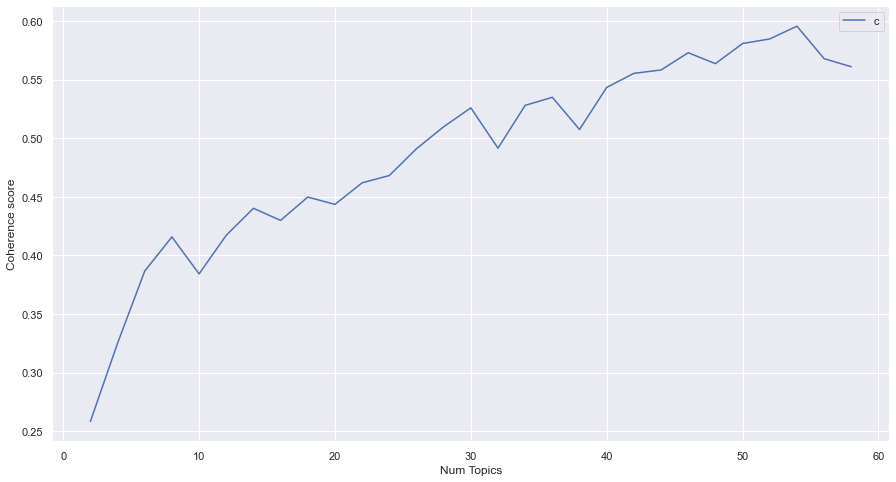

In [268]:
# Show graph
limit=60; start=2; step=2;
x = range(start, limit, step)
plt.figure(figsize=(15, 8))
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [269]:
best_result_index = coherence_values.index(max(coherence_values))
optimal_model = model_list[best_result_index]

# Select the model and print the topics
model_topics = optimal_model.show_topics(formatted=False)
print(f'''The {x[best_result_index]} topics gives the highest coherence score of {coherence_values[best_result_index]}''')

The 54 topics gives the highest coherence score of 0.5956828566426019


In [270]:
def convertldaGenToldaMallet(mallet_model):
    model_gensim = LdaModel(
        id2word=mallet_model.id2word, num_topics=mallet_model.num_topics,
        alpha=mallet_model.alpha, eta=0)
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

In [271]:
from gensim.models.ldamodel import LdaModel
optimal_model = convertldaGenToldaMallet(optimal_model)

In [272]:
plot_lda_vis(optimal_model, bow_corpus, dic)

/usr/local/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/usr/local/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp impo

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0      0.052847 -0.103090       1        1  1.897359
1      0.181204  0.089503       2        1  2.178363
2     -0.033169  0.015545       3        1  2.353279
3     -0.036971  0.005610       4        1  2.462601
4     -0.054059 -0.008551       5        1  1.605255
5      0.249553  0.027694       6        1  1.786741
6     -0.007947  0.024790       7        1  1.917675
7     -0.038507 -0.029643       8        1  1.651491
8      0.233623  0.027069       9        1  1.646078
9     -0.004186 -0.017550      10        1  1.719932
10    -0.086299  0.020743      11        1  2.331812
11    -0.053211 -0.112036      12        1  1.445322
12    -0.008915 -0.005508      13        1  2.477323
13     0.019366  0.009838      14        1  1.686062
14     0.053163 -0.069636      15        1  2.217033
15    -0.051189 -0.045552      16        1  2.229136
16    -0.043430  0.004692      17        1  1.511989
17     0.008114 -0.051435      18        1  1.422284
18     0.027736  0.013173      19        1  2.296350
19    -0.063121  0.083105      20        1  1.690769
20    -0.047265 -0.021743      21        1  1.762381
21     0.179148  0.155016      22        1  2.244338
22     0.023093 -0.031538      23        1  1.878196
23    -0.052926  0.011738      24        1  1.490795
24    -0.055144 -0.082028      25        1  2.080361
25     0.024720 -0.088424      26        1  2.048706
26    -0.027005 -0.037171      27        1  1.894512
27    -0.109377  0.260582      28        1  2.043089
28    -0.027810  0.025430      29        1  1.266740
29    -0.017066 -0.048065      30        1  1.720260
30    -0.057951  0.164927      31        1  1.610045
31     0.121935  0.006771      32        1  1.382571
32     0.274208  0.086224      33        1  1.734489
33    -0.041525  0.015998      34        1  2.098654
34    -0.082854  0.059242      35        1  1.562284
35    -0.013177 -0.046902      36        1  2.549673
36     0.061338 -0.052727      37        1  1.338944
37    -0.087289  0.004379      38        1  1.661126
38    -0.019912 -0.039833      39        1  1.898335
39     0.008024 -0.029032      40        1  1.223875
40    -0.032091 -0.112117      41        1  3.270932
41     0.068636 -0.118586      42        1  1.607806
42     0.009866 -0.051740      43        1  1.545255
43    -0.091170  0.062463      44        1  2.150714
44    -0.051086  0.162179      45        1  1.767209
45    -0.010230 -0.125258      46        1  2.267284
46    -0.036414 -0.041491      47        1  1.257102
47     0.014555 -0.053315      48        1  1.436331
48    -0.031619 -0.030849      49        1  1.630357
49    -0.022643 -0.064828      50        1  1.430266
50    -0.036067 -0.022857      51        1  1.851492
51    -0.080903  0.257796      52        1  2.088198
52    -0.057542 -0.049993      53        1  2.053839
53    -0.041063 -0.003008      54        1  1.626990, topic_info=           Term        Freq       Total Category  logprob  loglift
297        year  107.000000  107.000000  Default  30.0000  30.0000
62       people   88.000000   88.000000  Default  29.0000  29.0000
37         game   47.000000   47.000000  Default  28.0000  28.0000
278        time   45.000000   45.000000  Default  27.0000  27.0000
67        radio   41.000000   41.000000  Default  26.0000  26.0000
...         ...         ...         ...      ...      ...      ...
2111     remain    2.364619    5.657335  Topic54  -4.4886   3.2461
65      playing    2.364619    8.158275  Topic54  -4.4886   2.8800
61         open    1.182310    6.938130  Topic54  -5.1818   2.3489
259   sensitive    1.182310    2.334978  Topic54  -5.1818   3.4379
305      amount    1.182310    7.169457  Topic54  -5.1818   2.3161

[2854 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
3337     28  0.828687  abandonment
425      29  0.787292        abbey
1815   

In [165]:
## lesser topics, lesser overlapping, but individual topic coherence is vague, and so is inter topic coherence

trial = model_list[8]
trial = convertldaGenToldaMallet(trial)
plot_lda_vis(trial, bow_corpus, dic)

/usr/local/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/usr/local/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp impo

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0     -0.113620 -0.042077       1        1  5.902826
1     -0.008927 -0.130479       2        1  7.316457
2      0.103787  0.140347       3        1  7.060466
3      0.195687  0.114067       4        1  5.686177
4      0.200437  0.041739       5        1  5.700878
5     -0.024583 -0.221822       6        1  4.823835
6      0.131685  0.012504       7        1  4.838234
7     -0.144086  0.084240       8        1  4.764156
8     -0.106640  0.186967       9        1  5.715792
9      0.010033 -0.109921      10        1  5.735855
10    -0.069598 -0.067479      11        1  5.180997
11    -0.009440 -0.209884      12        1  6.040942
12    -0.064950 -0.026728      13        1  5.658362
13     0.083769 -0.028882      14        1  5.481323
14    -0.201960  0.090545      15        1  5.205581
15     0.176589  0.139745      16        1  5.520860
16    -0.207286  0.151477      17        1  4.195595
17     0.049101 -0.124358      18        1  5.171663, topic_info=          Term      Freq      Total Category  logprob  loglift
301       year  98.00000  98.000000  Default  30.0000  30.0000
56         n't  40.00000  40.000000  Default  29.0000  29.0000
2479     blair  44.00000  44.000000  Default  28.0000  28.0000
68       radio  40.00000  40.000000  Default  27.0000  27.0000
94       world  59.00000  59.000000  Default  26.0000  26.0000
...        ...       ...        ...      ...      ...      ...
94       world  15.02982  59.595187  Topic18  -3.7929   1.5844
925     coming   5.78070   9.430601  Topic18  -4.7484   2.4725
2484  campaign   6.93684  19.031487  Topic18  -4.5661   1.9527
54       money   5.78070  25.041543  Topic18  -4.7484   1.4960
1438       due   5.78070  11.488388  Topic18  -4.7484   2.2752

[1125 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1822     10  1.070686      'll
657       4  0.883877      're
657      14  0.126268      're
658       4  1.017487      've
831       8  0.858789      ...
...     ...       ...      ...
539       7  0.826812    £111m
827      18  0.864947     £14m
829       1  0.876011  £44,914
1241      8  0.857568  £77,800
540       7  0.826812   £8.5bn

[1238 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18])

In [273]:
# Find dominant topic in each news article

def format_topics_sentences(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for _, (topic_num, prop_topic) in enumerate(row):
            wp = ldamodel.show_topic(topic_num)
            topic_keywords = ", ".join([word for word, prop in wp])
            sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num)+1, round(prop_topic,4), topic_keywords]), ignore_index=True)
            break
    
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

In [274]:
df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=bow_corpus, texts=news_data['content'])

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'News Article']

# Show
df_dominant_topic.head(10)

/var/folders/qd/3_f8j7jn0sd60czml9wnjgww0000gp/T/ipykernel_55419/1470428163.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num)+1, round(prop_topic,4), topic_keywords]), ignore_index=True)
/var/folders/qd/3_f8j7jn0sd60czml9wnjgww0000gp/T/ipykernel_55419/1470428163.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num)+1, round(prop_topic,4), topic_keywords]), ignore_index=True)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,News Article
0,0,20,0.3991,"added, woman, men, money, club, week, bath, mi...",world number one lindsay davenport criticised ...
1,1,13,0.4797,"phone, camera, mobile, technology, image, mont...",four times mobiles cameras sold europe end las...
2,2,30,0.4270,"top, hard, national, test, time, blue, gene, p...",us pushed japan top supercomputing chart ibm p...
3,3,29,0.3440,"botin, santander, high, set, spain, lawyer, le...",trial emilio botin chairman spain powerful ban...
4,4,40,0.3143,"model, biggest, vehicle, system, recall, braki...",world biggest carmaker general motors gm recal...
5,5,44,0.3156,"williams, match, side, win, play, made, great,...",serena williams angrily rejected claims sister...
6,6,12,0.3579,"university, private, public, lost, failure, wa...",failed government scheme offer uk university c...
7,7,47,0.2125,"official, back, khan, give, viewer, visa, immi...",india ordered deportation iranian born model a...
8,8,15,0.4918,"world, hop, hip, spanish, millan, rap, group, ...",spin radio dial us likely find plenty spanish ...
9,9,35,0.2196,"million, firm, end, company, recently, share, ...",eurodisney european home mickey mouse friends ...


In [275]:
# Group top 5 sentences under each topic
sent_topics_sorteddf_mallet = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "News Article"]

# Show
print(sent_topics_sorteddf_mallet.shape)
sent_topics_sorteddf_mallet.head()

(49, 4)


,Topic_Num,Topic_Perc_Contrib,Keywords,News Article
0,1,0.5650,"record, speed, world, lift, building, control,...",two high speed lifts world tallest building of...
1,2,0.4487,"demand, video, offer, service, telewest, year,...",cable firms ntl telewest launched video demand...
2,3,0.4857,"music, player, digital, million, american, mar...",apple expanded ipod family release next genera...
3,4,0.4797,"program, virus, criminal, written, network, sp...",viruses trojans malicious programs sent net ca...
4,5,0.4465,"game, xbox, title, allard, microsoft, console,...",microsoft given game makers glimpse new xbox c...


In [277]:
# Number of Documents for Each Topic
topic_counts = df_dominant_topic['Dominant_Topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
topic_num_keywords = sent_topics_sorteddf_mallet[['Topic_Num', 'Keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0,1.0,"record, speed, world, lift, building, control,...",NaN,NaN
1,2.0,"demand, video, offer, service, telewest, year,...",1.0,0.0167
2,3.0,"music, player, digital, million, american, mar...",1.0,0.0167
3,4.0,"program, virus, criminal, written, network, sp...",1.0,0.0167
4,5.0,"game, xbox, title, allard, microsoft, console,...",1.0,0.0167
5,6.0,"year, show, super, bowl, jackson, singer, star...",1.0,0.0167
6,7.0,"market, life, cut, long, investment, bonus, pr...",1.0,0.0167
7,8.0,"injury, france, saturday, victory, laporte, sc...",1.0,0.0167
8,9.0,"year, race, event, pre, place, paula, march, c...",1.0,0.0167
9,10.0,"number, cent, school, latest, song, chart, rel...",2.0,0.0333
